# New version: Distance to respective ROI centroids 

Calculating the distance of all voxels to their respective ROI centroid with with voxel membership + ID number 

(before: it just had the ROI label but no ID to map it back to MNI space)

In [1]:
! pip install matplotlib

In [2]:
!pip install seaborn

In [1]:
import numpy as np
import pandas as pd
import pickle
import copy
import matplotlib.pyplot as plt
import seaborn as sns

In [85]:
# UMAP results
UMAP_k = np.load('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Ket/UMAP_ROI_Ketamine', allow_pickle=True)
UMAP_b_k = np.load('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Ket/UMAP_ROI_Baseline_ketamine', allow_pickle=True)
UMAP_p = np.load('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Placebo/UMAP_ROI_Placebo', allow_pickle=True)
UMAP_b_p = np.load('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Placebo/UMAP_ROI_Baseline_placebo', allow_pickle=True)

In [86]:
# Accurate voxel ID from mask: matlab script for labeling
mask_label_pfc= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/Mask_ind_pfc.csv', engine='c', header = None)
mask_label_str= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/Mask_ind_str.csv', engine='c', header = None)
# pfc and striatum labels
label_pfc= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/PFC_ROIs.csv', engine='c', header = None)
label_str= pd.read_csv('C:/Users/canlab/Desktop/Masterthesis_python/Striatum_ROIs.csv', engine='c', header = None)

Concat the voxel ID with the label

In [87]:
pfc = pd.concat([mask_label_pfc, label_pfc], axis = 1)
st = pd.concat([mask_label_str, label_str], axis=1)
voxel_id=pd.concat([mask_label_pfc, mask_label_str], axis=0, ignore_index=True)
voxel_id.columns=['ID']

In [88]:
voxel_id

,ID
0,205889
1,205890
2,205980
3,206071
4,206162
...,...
11878,491091
11879,491182
11880,491273
11881,491364


**ID and ROI membership** mapping 

In [89]:
labels = pd.concat([pfc, st], axis=0, ignore_index=True)
labels.columns=['ID', 'Label']
labels.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/Voxel_ID_ROI_Membership')
labels

,ID,Label
0,205889,OFC1
1,205890,OFC1
2,205980,OFC1
3,206071,OFC1
4,206162,OFC1
...,...,...
11878,491091,Caudate
11879,491182,Caudate
11880,491273,Caudate
11881,491364,Caudate


In [90]:
UMAP_k_comb=pd.concat([UMAP_k, voxel_id], axis=1)
UMAP_b_k_comb=pd.concat([UMAP_b_k, voxel_id], axis=1)
UMAP_k_comb

,x,y,ROI,ID
0,1.133926,-0.809377,OFC1,205889
1,1.134167,-0.851568,OFC1,205890
2,1.101762,-0.911788,OFC1,205980
3,1.149000,-0.465464,OFC1,206071
4,1.019709,-0.775353,OFC1,206162
...,...,...,...,...
11878,-2.722308,4.898921,Caudate,491091
11879,-2.703566,4.901717,Caudate,491182
11880,-2.700493,4.900335,Caudate,491273
11881,-2.707304,4.912504,Caudate,491364


In [91]:
UMAP_p_comb=pd.concat([UMAP_p, voxel_id], axis=1)
UMAP_b_p_comb=pd.concat([UMAP_b_p, voxel_id], axis=1)
UMAP_p_comb

,x,y,ROI,ID
0,-2.739387,-3.736372,OFC1,205889
1,-2.474142,-3.229756,OFC1,205890
2,-3.009511,-3.525998,OFC1,205980
3,-3.031270,-3.398739,OFC1,206071
4,-2.920102,-4.031644,OFC1,206162
...,...,...,...,...
11878,0.621853,2.811207,Caudate,491091
11879,0.642768,2.803928,Caudate,491182
11880,0.593797,2.761256,Caudate,491273
11881,0.626058,2.782596,Caudate,491364


Change dataframes to dictionaries

In [92]:
dict_k=UMAP_k_comb.to_dict(orient='index')
dict_k

{0: {'x': 1.133926272392273,
  'y': -0.8093768954277039,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': 1.134166955947876,
  'y': -0.8515681624412537,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': 1.1017615795135498,
  'y': -0.9117879271507263,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': 1.148999810218811,
  'y': -0.46546435356140137,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': 1.019708514213562,
  'y': -0.7753534317016602,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': 0.8803349137306213,
  'y': -0.1984509825706482,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': 0.9064167737960815,
  'y': -0.19024191796779633,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': 0.8654518723487854,
  'y': -0.04751083627343178,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': 1.0412830114364624,
  'y': -1.0815929174423218,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': 1.0253726243972778,
  'y': -0.9693430662155151,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': 0.6846315860748291,
  'y': -0.32965800166130066,
  'ROI': 'OFC2',
  'I

In [93]:
dict_b_k=UMAP_b_k_comb.to_dict(orient='index')
dict_b_k

{0: {'x': 2.056997060775757,
  'y': -2.4602537155151367,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': 2.519534111022949,
  'y': -1.3303687572479248,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': 2.159428596496582,
  'y': -2.477863311767578,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': 1.9194746017456055,
  'y': -2.5090932846069336,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': 1.9327510595321655,
  'y': -2.383242607116699,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': 2.2598352432250977,
  'y': -2.282024621963501,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': 2.4421021938323975,
  'y': -1.2365316152572632,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': 2.437937021255493,
  'y': -1.2744147777557373,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': 2.070375442504883,
  'y': -2.0100486278533936,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': 2.1214447021484375,
  'y': -2.2679407596588135,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': 2.2235019207000732,
  'y': -2.5891363620758057,
  'ROI': 'OFC2',
  'ID': 2154

In [94]:
dict_p=UMAP_p_comb.to_dict(orient='index')
dict_p

{0: {'x': -2.739386796951294,
  'y': -3.7363715171813965,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': -2.47414231300354,
  'y': -3.2297558784484863,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': -3.0095107555389404,
  'y': -3.5259978771209717,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': -3.0312700271606445,
  'y': -3.3987386226654053,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': -2.920102119445801,
  'y': -4.031643867492676,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': -2.5199127197265625,
  'y': -3.7720212936401367,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': -2.466846227645874,
  'y': -3.9160046577453613,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': -2.6233155727386475,
  'y': -4.1108527183532715,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': -2.2433812618255615,
  'y': -3.3037734031677246,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': -2.4480578899383545,
  'y': -3.788083791732788,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': -2.7444729804992676,
  'y': -4.13918399810791,
  'ROI': 'OFC2',
  

In [95]:
dict_b_p=UMAP_b_p_comb.to_dict(orient='index')
dict_b_p

{0: {'x': 2.5503923892974854,
  'y': -2.87528657913208,
  'ROI': 'OFC1',
  'ID': 205889},
 1: {'x': 2.2859420776367188,
  'y': -4.092872619628906,
  'ROI': 'OFC1',
  'ID': 205890},
 2: {'x': 2.986233949661255,
  'y': -3.0699374675750732,
  'ROI': 'OFC1',
  'ID': 205980},
 3: {'x': 3.1016931533813477,
  'y': -3.2356536388397217,
  'ROI': 'OFC1',
  'ID': 206071},
 4: {'x': 3.032506227493286,
  'y': -3.3654050827026367,
  'ROI': 'OFC1',
  'ID': 206162},
 5: {'x': 2.6042163372039795,
  'y': -3.118363380432129,
  'ROI': 'OFC2',
  'ID': 215350},
 6: {'x': 2.729343891143799,
  'y': -3.267606019973755,
  'ROI': 'OFC2',
  'ID': 215353},
 7: {'x': 2.742159366607666,
  'y': -3.250498056411743,
  'ROI': 'OFC2',
  'ID': 215354},
 8: {'x': 2.656796455383301,
  'y': -2.9640073776245117,
  'ROI': 'OFC2',
  'ID': 215440},
 9: {'x': 2.630622148513794,
  'y': -2.886380910873413,
  'ROI': 'OFC2',
  'ID': 215441},
 10: {'x': 2.7714686393737793,
  'y': -3.3917903900146484,
  'ROI': 'OFC2',
  'ID': 215444},


In [96]:
for i in dict_b_k:
    print(dict_b_k[i])

{'x': 2.056997060775757, 'y': -2.4602537155151367, 'ROI': 'OFC1', 'ID': 205889}
{'x': 2.519534111022949, 'y': -1.3303687572479248, 'ROI': 'OFC1', 'ID': 205890}
{'x': 2.159428596496582, 'y': -2.477863311767578, 'ROI': 'OFC1', 'ID': 205980}
{'x': 1.9194746017456055, 'y': -2.5090932846069336, 'ROI': 'OFC1', 'ID': 206071}
{'x': 1.9327510595321655, 'y': -2.383242607116699, 'ROI': 'OFC1', 'ID': 206162}
{'x': 2.2598352432250977, 'y': -2.282024621963501, 'ROI': 'OFC2', 'ID': 215350}
{'x': 2.4421021938323975, 'y': -1.2365316152572632, 'ROI': 'OFC2', 'ID': 215353}
{'x': 2.437937021255493, 'y': -1.2744147777557373, 'ROI': 'OFC2', 'ID': 215354}
{'x': 2.070375442504883, 'y': -2.0100486278533936, 'ROI': 'OFC2', 'ID': 215440}
{'x': 2.1214447021484375, 'y': -2.2679407596588135, 'ROI': 'OFC2', 'ID': 215441}
{'x': 2.2235019207000732, 'y': -2.5891363620758057, 'ROI': 'OFC2', 'ID': 215444}
{'x': 2.172590494155884, 'y': -2.562314987182617, 'ROI': 'OFC2', 'ID': 215445}
{'x': 2.141476631164551, 'y': -2.39289

{'x': 1.0279796123504639, 'y': -2.047250509262085, 'ROI': 'OFC1', 'ID': 256034}
{'x': 1.0731689929962158, 'y': -1.8906769752502441, 'ROI': 'OFC1', 'ID': 256035}
{'x': 1.4230494499206543, 'y': -0.7521012425422668, 'ROI': 'OFC3', 'ID': 256036}
{'x': 1.5007299184799194, 'y': -0.753973662853241, 'ROI': 'OFC3', 'ID': 256037}
{'x': 1.597151279449463, 'y': -0.6795721054077148, 'ROI': 'OFC3', 'ID': 256038}
{'x': 1.0690919160842896, 'y': -1.4874267578125, 'ROI': 'OFC3', 'ID': 256111}
{'x': 0.8777877688407898, 'y': -1.7227776050567627, 'ROI': 'OFC3', 'ID': 256112}
{'x': 0.8667089939117432, 'y': -1.8143755197525024, 'ROI': 'OFC3', 'ID': 256113}
{'x': 0.8460651636123657, 'y': -2.013749122619629, 'ROI': 'OFC3', 'ID': 256114}
{'x': 0.8897243738174438, 'y': -2.0279924869537354, 'ROI': 'OFC1', 'ID': 256115}
{'x': 0.8495075106620789, 'y': -2.070521116256714, 'ROI': 'OFC1', 'ID': 256116}
{'x': 0.8764382004737854, 'y': -2.1627447605133057, 'ROI': 'OFC1', 'ID': 256117}
{'x': 0.8490092158317566, 'y': -2.23

{'x': 1.977251410484314, 'y': 2.673922061920166, 'ROI': 'OFC3', 'ID': 294716}
{'x': 1.7647085189819336, 'y': 3.702986240386963, 'ROI': 'OFC3', 'ID': 294782}
{'x': 2.080711603164673, 'y': 2.6783759593963623, 'ROI': 'OFC3', 'ID': 294783}
{'x': 1.9865915775299072, 'y': 3.160250425338745, 'ROI': 'OFC3', 'ID': 294784}
{'x': 1.8131448030471802, 'y': 3.271946430206299, 'ROI': 'OFC3', 'ID': 294785}
{'x': 1.419548749923706, 'y': -0.047614600509405136, 'ROI': 's32', 'ID': 294790}
{'x': -1.8961946964263916, 'y': -7.194620132446289, 'ROI': 's32', 'ID': 294791}
{'x': -2.047269821166992, 'y': -7.070695400238037, 'ROI': 's32', 'ID': 294792}
{'x': -1.9974033832550049, 'y': -6.940775394439697, 'ROI': 's24', 'ID': 294793}
{'x': -1.891716480255127, 'y': -6.76975154876709, 'ROI': 's24', 'ID': 294794}
{'x': -1.8655463457107544, 'y': -6.722719669342041, 'ROI': 's32', 'ID': 294796}
{'x': -1.7291301488876343, 'y': -6.731409549713135, 'ROI': 's32', 'ID': 294797}
{'x': -1.7584381103515625, 'y': -6.7740454673767

{'x': -2.515805959701538, 'y': -6.956216335296631, 'ROI': 's24', 'ID': 314725}
{'x': -2.5100691318511963, 'y': -6.952579975128174, 'ROI': 's24', 'ID': 314726}
{'x': -2.3873214721679688, 'y': -6.976229667663574, 'ROI': 's24', 'ID': 314727}
{'x': 3.6874377727508545, 'y': 5.767183780670166, 'ROI': 'OFC7', 'ID': 314795}
{'x': 3.6708765029907227, 'y': 5.758199691772461, 'ROI': 's32', 'ID': 314810}
{'x': 3.6230547428131104, 'y': 5.751536846160889, 'ROI': 's32', 'ID': 314811}
{'x': -2.4876346588134766, 'y': -7.015811443328857, 'ROI': 's24', 'ID': 314812}
{'x': -2.5331385135650635, 'y': -7.183168888092041, 'ROI': 's24', 'ID': 314813}
{'x': -2.543860912322998, 'y': -7.034367084503174, 'ROI': 's24', 'ID': 314814}
{'x': -2.442443609237671, 'y': -6.798027038574219, 'ROI': 's24', 'ID': 314815}
{'x': -2.3673348426818848, 'y': -6.834123611450195, 'ROI': 's24', 'ID': 314816}
{'x': -2.287205457687378, 'y': -7.044178009033203, 'ROI': 's32', 'ID': 314817}
{'x': -2.6683592796325684, 'y': -6.97399044036865

{'x': -3.0483710765838623, 'y': -7.473063945770264, 'ROI': 'p32', 'ID': 345022}
{'x': -3.0439565181732178, 'y': -7.377438545227051, 'ROI': 'p24c', 'ID': 345023}
{'x': -3.011033058166504, 'y': -7.394189834594727, 'ROI': 'p24c', 'ID': 345024}
{'x': -2.7811572551727295, 'y': -7.169008731842041, 'ROI': 'p32', 'ID': 345025}
{'x': -3.032569408416748, 'y': -7.503178119659424, 'ROI': 'p24ab', 'ID': 345026}
{'x': -3.1053833961486816, 'y': -7.687384128570557, 'ROI': 'p24ab', 'ID': 345028}
{'x': -3.083580255508423, 'y': -7.640286922454834, 'ROI': 'p32', 'ID': 345029}
{'x': -3.107219696044922, 'y': -7.726550102233887, 'ROI': 'p32', 'ID': 345030}
{'x': -3.056403398513794, 'y': -7.64003324508667, 'ROI': 'p32', 'ID': 345031}
{'x': -3.071119785308838, 'y': -7.701266288757324, 'ROI': 'p32', 'ID': 345032}
{'x': -3.009697675704956, 'y': -7.761006832122803, 'ROI': 'p32', 'ID': 345033}
{'x': -2.863434314727783, 'y': -7.597999095916748, 'ROI': 'p32', 'ID': 345111}
{'x': -2.946643590927124, 'y': -7.635854721

{'x': -3.8839080333709717, 'y': -9.293604850769043, 'ROI': 'p32', 'ID': 405183}
{'x': -4.258504390716553, 'y': -9.747756958007812, 'ROI': 'p32', 'ID': 405263}
{'x': -4.090087413787842, 'y': -9.744565963745117, 'ROI': 'FP2', 'ID': 405264}
{'x': -4.027604579925537, 'y': -9.70241928100586, 'ROI': 'FP2', 'ID': 405265}
{'x': -4.03745174407959, 'y': -9.713688850402832, 'ROI': 'FP2', 'ID': 405266}
{'x': -3.9610304832458496, 'y': -9.575079917907715, 'ROI': 'FP2', 'ID': 405270}
{'x': -4.110776424407959, 'y': -9.26993465423584, 'ROI': 'FP2', 'ID': 405271}
{'x': -3.9764058589935303, 'y': -9.110719680786133, 'ROI': 'FP2', 'ID': 405272}
{'x': -3.919870615005493, 'y': -9.198861122131348, 'ROI': 'FP2', 'ID': 405273}
{'x': -3.8575613498687744, 'y': -9.295987129211426, 'ROI': 'p32', 'ID': 405274}
{'x': -4.2353997230529785, 'y': -9.794254302978516, 'ROI': 'FP2', 'ID': 405354}
{'x': -4.074050426483154, 'y': -9.813249588012695, 'ROI': 'FP2', 'ID': 405355}
{'x': -3.7975058555603027, 'y': -9.686084747314453

{'x': -3.5438232421875, 'y': 4.134139060974121, 'ROI': 'NAcc', 'ID': 323728}
{'x': -3.445817232131958, 'y': 4.116163730621338, 'ROI': 'NAcc', 'ID': 323729}
{'x': -3.416733503341675, 'y': 4.059245586395264, 'ROI': 'NAcc', 'ID': 323730}
{'x': 1.3532483577728271, 'y': -0.22640137374401093, 'ROI': 'NAcc', 'ID': 323736}
{'x': -3.4583933353424072, 'y': 4.095040798187256, 'ROI': 'NAcc', 'ID': 323737}
{'x': -3.4958975315093994, 'y': 4.261409282684326, 'ROI': 'NAcc', 'ID': 323738}
{'x': -3.640115261077881, 'y': 4.1934051513671875, 'ROI': 'NAcc', 'ID': 323739}
{'x': -3.6713616847991943, 'y': 4.233409881591797, 'ROI': 'Putamen', 'ID': 323740}
{'x': -4.4480061531066895, 'y': 4.1408371925354, 'ROI': 'Putamen', 'ID': 323741}
{'x': -5.110574722290039, 'y': 4.099422931671143, 'ROI': 'Putamen', 'ID': 323742}
{'x': -5.157098770141602, 'y': 4.098036289215088, 'ROI': 'Putamen', 'ID': 323743}
{'x': -5.306187152862549, 'y': 4.053940296173096, 'ROI': 'Putamen', 'ID': 323744}
{'x': -5.605747699737549, 'y': 4.

{'x': -2.9340341091156006, 'y': 4.473489761352539, 'ROI': 'Caudate', 'ID': 383422}
{'x': -2.5909857749938965, 'y': 4.291546821594238, 'ROI': 'Caudate', 'ID': 383423}
{'x': -2.459343433380127, 'y': 4.3950982093811035, 'ROI': 'Caudate', 'ID': 383424}
{'x': -2.1512467861175537, 'y': 4.4588212966918945, 'ROI': 'Caudate', 'ID': 383425}
{'x': -2.1119182109832764, 'y': 4.478211402893066, 'ROI': 'Caudate', 'ID': 383433}
{'x': -2.4969558715820312, 'y': 4.603785991668701, 'ROI': 'Caudate', 'ID': 383434}
{'x': -2.8365461826324463, 'y': 4.548859119415283, 'ROI': 'Caudate', 'ID': 383435}
{'x': -2.7838237285614014, 'y': 4.4789910316467285, 'ROI': 'Caudate', 'ID': 383436}
{'x': -2.9314231872558594, 'y': 4.452939987182617, 'ROI': 'Caudate', 'ID': 383437}
{'x': -6.548878192901611, 'y': 3.656780958175659, 'ROI': 'Putamen', 'ID': 383441}
{'x': -2.9820027351379395, 'y': 4.297399044036865, 'ROI': 'Caudate', 'ID': 383511}
{'x': -2.880880832672119, 'y': 4.366219520568848, 'ROI': 'Caudate', 'ID': 383512}
{'x'

In [97]:
# grouping of dataframes by their ROI to calculate centroid coordinates
grouped_b_k = UMAP_b_k.groupby('ROI')
grouped_k = UMAP_k.groupby('ROI')
grouped_b_p = UMAP_b_p.groupby('ROI')
grouped_p = UMAP_p.groupby('ROI')

In [98]:
centroids_b_k = grouped_b_k.mean()
centroids_k = grouped_k.mean()
centroids_b_p = grouped_b_p.mean()
centroids_p = grouped_p.mean()
centroids_b_k

,x,y
ROI,,
25,1.962205,-0.589941
33,-2.152755,-4.367899
Caudate,-2.117237,4.534369
FP2,-2.501559,-7.375797
NAcc,-3.128851,4.006806
OFC1,1.576348,-1.824799
OFC2,1.968189,-1.148709
OFC3,2.025534,0.526615
OFC4,2.375196,3.595102


In [99]:
centroid_dict_b_k = centroids_b_k.to_dict(orient='index')
centroid_dict_k = centroids_k.to_dict(orient='index')
centroid_dict_b_p = centroids_b_p.to_dict(orient='index')
centroid_dict_p = centroids_p.to_dict(orient='index')
centroid_dict_b_k

{'25': {'x': 1.962205410003662, 'y': -0.5899406671524048},
 '33': {'x': -2.1527554988861084, 'y': -4.367899417877197},
 'Caudate': {'x': -2.117236852645874, 'y': 4.534368515014648},
 'FP2': {'x': -2.5015594959259033, 'y': -7.375797271728516},
 'NAcc': {'x': -3.1288506984710693, 'y': 4.006805896759033},
 'OFC1': {'x': 1.5763479471206665, 'y': -1.824798822402954},
 'OFC2': {'x': 1.9681894779205322, 'y': -1.148708701133728},
 'OFC3': {'x': 2.0255343914031982, 'y': 0.5266154408454895},
 'OFC4': {'x': 2.3751962184906006, 'y': 3.595102071762085},
 'OFC5': {'x': 2.032886505126953, 'y': 2.695582389831543},
 'OFC6': {'x': 3.269740343093872, 'y': 4.501314640045166},
 'OFC7': {'x': 2.614281415939331, 'y': 3.8056535720825195},
 'Putamen': {'x': -6.240389347076416, 'y': 4.026293754577637},
 'p24ab': {'x': -3.5712263584136963, 'y': -7.3240156173706055},
 'p24c': {'x': -4.059215068817139, 'y': -7.8634819984436035},
 'p32': {'x': -3.6579222679138184, 'y': -8.036359786987305},
 's24': {'x': -0.76141917

### Function: calculating distance of each voxel to respective ROI centroid

In [100]:
for i in dict_b_k:
    print(dict_b_k[i]['ROI'])

OFC1
OFC1
OFC1
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC2
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1
OFC1


OFC3
OFC3
OFC3
OFC1
FP2
FP2
FP2
OFC1
OFC1
OFC1
OFC1
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC1
FP2
FP2
FP2
FP2
OFC1
OFC1
OFC3
OFC3
OFC3
OFC3
OFC1
FP2
FP2
FP2
FP2
FP2
OFC3
OFC3
FP2
FP2
FP2
FP2
FP2
OFC1
FP2
FP2
25
25
25
25
25
25
25
25
25
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
25
25
25
OFC2
OFC2
OFC2
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
s24
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
s24
s24
s24
s24
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC3
OFC3
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
s24
s24
s24
s24
s24
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC2
OFC2
OFC2
OFC2
OFC2
s24
s24
s24
s24
s24
s24
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC2
OFC2
OFC2
OFC2
s32
s32
s24
s32
s32
s32
OFC2
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC2
OFC2
OFC2
OFC2
s32
s32
s32
s32
s32
s32
OFC2
OFC2
OFC2
OFC2
OFC2
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
OFC3
O

FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
33
33
33
33
33
33
33
33
33
33
33
25
25
25
25
25
25
25
25
25
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
s24
33
p24ab
p24ab
s24
s24
s24
s24
33
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24ab
p24c
OFC7
OFC7
OFC7
p24ab
p24ab
p24ab
p24ab
p24ab
p24c
p24c
p24c
OFC6
OFC6
OFC7
p32
p24ab
p24ab
p24ab
p24ab
p24ab
p24c
p24c
p24c
p32
OFC6
p32
p32
p32
p24ab
p24ab
p24ab
p24ab
p24c
p24c
p32
p32
OFC6
OFC6
OFC6
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
OFC6
OFC6
OFC6
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
OFC6
OFC6
OFC6
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
OFC5
OFC6
OFC6
OFC5
OFC5
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
p32
OFC5
OFC5
OFC5
OFC5
p32
p32
p32
p32
p32
p32
p32
p32
p32
OFC5
OFC5
OFC5
OFC5
FP2
FP2
FP2
FP2
FP2
p32
p32
p32
p32
p32
OFC5
OFC5
OFC5
OFC5
OFC5
OFC5
OFC5
FP2
FP2
FP2
FP2
FP2
FP2
FP2
FP2
OFC5
OFC5

Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
NAcc
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Put

Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Caudate
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Putamen
Caudate
Caudate
Caudate


In [101]:
centroid_dict_k

{'25': {'x': -0.08172008395195007, 'y': 0.36029288172721863},
 '33': {'x': -2.881047010421753, 'y': -4.538675785064697},
 'Caudate': {'x': -3.5786354541778564, 'y': 4.434670925140381},
 'FP2': {'x': -2.4221794605255127, 'y': -7.830648422241211},
 'NAcc': {'x': -4.2162394523620605, 'y': 3.3673853874206543},
 'OFC1': {'x': 0.6760963201522827, 'y': -0.6770989298820496},
 'OFC2': {'x': 0.13276547193527222, 'y': 0.025617843493819237},
 'OFC3': {'x': 0.33274775743484497, 'y': 1.5291317701339722},
 'OFC4': {'x': 1.107063889503479, 'y': 4.451426982879639},
 'OFC5': {'x': 0.9362255334854126, 'y': 3.490879535675049},
 'OFC6': {'x': 1.569395899772644, 'y': 6.021818161010742},
 'OFC7': {'x': 1.1852601766586304, 'y': 5.25869083404541},
 'Putamen': {'x': -6.554598808288574, 'y': 1.5573567152023315},
 'p24ab': {'x': -3.648751974105835, 'y': -8.083394050598145},
 'p24c': {'x': -4.104691028594971, 'y': -8.841758728027344},
 'p32': {'x': -3.707462787628174, 'y': -8.99950885772705},
 's24': {'x': -1.7176

In [102]:
def calculate_distance(input_dict, centroid_dict):
    
    # entry: current voxel
    for entry in input_dict:
        # get the ROI of the current voxel
        curr_roi= input_dict[entry]['ROI']
        # get the centroid values
        x_centroid = centroid_dict[curr_roi]['x']
        print('centroid_x: ', x_centroid)
        y_centroid = centroid_dict[curr_roi]['y']
        print('centroid_y: ', y_centroid)
        
        x = input_dict[entry]['x']
        y = input_dict[entry]['y']
        print('x+y: ', x, 'and ', y)

        # calculate the squared distance from voxel to centroid
        dist = np.sqrt(((x-x_centroid)**2)+((y-y_centroid)**2))
        
        # create new entry in input_dict
        input_dict[entry]['Dist']= copy.deepcopy(dist)
        
        
    return input_dict

    

**Ketamine**

In [103]:
ket_dist_dict=calculate_distance(dict_k, centroid_dict_k)

centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.133926272392273 and  -0.8093768954277039
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.134166955947876 and  -0.8515681624412537
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.1017615795135498 and  -0.9117879271507263
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.148999810218811 and  -0.46546435356140137
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.019708514213562 and  -0.7753534317016602
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.8803349137306213 and  -0.1984509825706482
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.9064167737960815 and  -0.19024191796779633
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.8654518723487854 and  -0.04751083627343178
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  1.

centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.0716888904571533 and  -0.4045356214046478
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.07082998752594 and  -0.40144994854927063
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.1206426620483398 and  -0.4273518919944763
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.9556525945663452 and  -0.42276668548583984
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.9801540970802307 and  -0.47883617877960205
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.9684315919876099 and  -0.3718242943286896
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.00682532787323 and  -0.21174673736095428
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.0398954153060913 and  -0.22865508496761322
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.193784

centroid_y:  -0.6770989298820496
x+y:  0.9696882963180542 and  -0.8215638995170593
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.9320353269577026 and  -0.7006997466087341
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.7754164934158325 and  -0.612108051776886
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.9849745035171509 and  -0.27665483951568604
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.8072894215583801 and  -0.17766034603118896
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.49008095264434814 and  0.4775906205177307
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.5051493048667908 and  0.7153990268707275
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.401814341545105 and  0.657366931438446
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.31709808111190796 and  0.8281221389770508


x+y:  -0.30859705805778503 and  0.3683735430240631
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.04710327088832855 and  -0.1780124008655548
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.17260442674160004 and  -0.0292628426104784
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.02956443279981613 and  0.32783764600753784
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.09868855029344559 and  0.3400588929653168
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.13148508965969086 and  0.03353467956185341
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.043227795511484146 and  -0.762175440788269
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.36992383003234863 and  0.3478224277496338
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.4459015429019928 and  0.5035709738731384
centroid_

x+y:  0.2572025656700134 and  0.6309707164764404
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.39218854904174805 and  0.794952392578125
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.5202214121818542 and  0.7752363085746765
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.3490331172943115 and  0.05544973537325859
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.34949371218681335 and  -0.5325007438659668
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.2964812219142914 and  -0.4445886015892029
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.3409655690193176 and  -0.40324363112449646
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.3715135157108307 and  -0.4970914423465729
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.24159295856952667 and  -0.3541891276836395
centroid_x:  0.13276

x+y:  0.4696652889251709 and  -1.2410167455673218
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.5665024518966675 and  -1.2215216159820557
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.6575431823730469 and  -1.0427378416061401
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.7288192510604858 and  -0.6982805728912354
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.0115822553634644 and  -0.03762783110141754
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  1.0708733797073364 and  0.08884734660387039
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.097894310951233 and  0.06882006675004959
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.9852635264396667 and  0.11554623395204544
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.32744625210762024 and  0.5808576941490173
centroid_x:  0.332747757434844

centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.4163053035736084 and  0.9328611493110657
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.5475897192955017 and  0.6538517475128174
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -4.114804267883301 and  -10.421815872192383
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -4.348343372344971 and  -10.040834426879883
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.19122327864170074 and  1.4093966484069824
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.07671243697404861 and  1.5337783098220825
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.2507342994213104 and  1.5464951992034912
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.2894331216812134 and  0.8708438873291016
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.2774405

x+y:  0.7076071500778198 and  1.4044066667556763
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.8138415217399597 and  1.4260077476501465
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.628321647644043 and  0.9656246900558472
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.2244867980480194 and  0.9993151426315308
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.31053194403648376 and  -0.8053492307662964
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.2643025517463684 and  -1.0098048448562622
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.31344401836395264 and  -1.135294795036316
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.33425819873809814 and  -1.2250064611434937
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.28729546070098877 and  -1.2538716793060303
centroid_x:  0.6760963201522827


x+y:  0.7383625507354736 and  0.09665502607822418
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.7392589449882507 and  0.17942829430103302
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.42511186003685 and  -0.9816765189170837
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.4973445534706116 and  -0.6300485730171204
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  1.1220591068267822 and  -0.07731898128986359
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  0.3663768172264099 and  -1.3861486911773682
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.3360292613506317 and  -1.6146975755691528
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.3263126015663147 and  -1.6359320878982544
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.29996031522750854 and  -1.7403701543807983
centroid_x:  0.332747757434844

centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.4017758071422577 and  -0.41387125849723816
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.18459954857826233 and  -0.677356481552124
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.053826507180929184 and  -0.8770197033882141
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.05994165688753128 and  -0.802521288394928
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.08826830238103867 and  -0.8218558430671692
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  0.0654306709766388 and  -1.1352393627166748
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  0.08308295905590057 and  -0.990260124206543
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.09391704946756363 and  -0.8479219079017639
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493

centroid_y:  1.5291317701339722
x+y:  0.9831327795982361 and  2.590132236480713
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.9859510064125061 and  2.6133673191070557
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.9665449857711792 and  2.268761396408081
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.7090765237808228 and  1.0272729396820068
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.8825821876525879 and  0.6703221797943115
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.29072847962379456 and  -1.035333275794983
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.051564596593379974 and  -1.1398811340332031
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  -0.018326453864574432 and  -1.1694748401641846
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.00515469117090106 and  -1.4598197937011719

centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.0695701614022255 and  -1.2782763242721558
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.35277602076530457 and  -1.2374403476715088
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.0572786331176758 and  0.26402750611305237
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.0284245014190674 and  0.24916988611221313
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.0594433546066284 and  0.276373952627182
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.1040607690811157 and  0.41796988248825073
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.0270047187805176 and  1.2119224071502686
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.0123693943023682 and  1.6754584312438965
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.0942134857177734 an

x+y:  0.16467157006263733 and  0.9601307511329651
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.14880597591400146 and  1.2868232727050781
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.18853817880153656 and  1.490387201309204
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.12517932057380676 and  1.418294072151184
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.10140817612409592 and  1.4009007215499878
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -0.0019853906705975533 and  1.6380637884140015
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  -4.076019287109375 and  -10.292306900024414
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.1363675892353058 and  1.7720115184783936
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.11746480315923691 and  1.608389973640442
centroid_x:  0.3327477574348

centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.5106942653656006 and  7.390230655670166
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.518676519393921 and  7.304123878479004
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.5900245904922485 and  7.295034408569336
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.2183310985565186 and  7.120199203491211
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.1971633434295654 and  7.139191150665283
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.263327121734619 and  6.997283935546875
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.2245821952819824 and  6.866929531097412
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  2.1666059494018555 and  6.783555507659912
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  1.9211469888687134 and  6.89060115814209
centroid_x:  

centroid_y:  4.451426982879639
x+y:  1.773008108139038 and  5.422327518463135
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.60745370388031 and  5.266315460205078
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.5485681295394897 and  5.06986665725708
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.465133547782898 and  4.470964431762695
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.4377491474151611 and  4.428892612457275
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.4003973007202148 and  4.410590171813965
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.3705897331237793 and  4.342881202697754
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.3725489377975464 and  4.289486885070801
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.5078903436660767 and  4.304014682769775
centroid_x:  0.3327477574348449

x+y:  -0.5216315984725952 and  0.6780109405517578
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  -0.47257494926452637 and  1.0047550201416016
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  0.7888634204864502 and  5.428061485290527
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.008206844329834 and  5.674386024475098
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.0796396732330322 and  5.413357257843018
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.066218614578247 and  5.357180118560791
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  -2.0580503940582275 and  -8.88509464263916
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.033696413040161 and  -9.001747131347656
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.051379919052124 and  -8.957765579223633
centroid_x:  -2.4221794605255127
centroid_y:  -7.83064842224

x+y:  -2.092785596847534 and  -7.039661884307861
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -0.3802257776260376 and  -1.437255620956421
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -0.39429742097854614 and  -1.5262775421142578
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -0.38133761286735535 and  -1.451498031616211
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.2654223144054413 and  -1.3702305555343628
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.011044557206332684 and  0.2727434039115906
centroid_x:  0.6760963201522827
centroid_y:  -0.6770989298820496
x+y:  0.45242536067962646 and  0.5545929074287415
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.39945435523986816 and  3.272339105606079
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.4071362018585205 and  3.374796152114868
centroid_x:  0.3327477574

centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.4608505964279175 and  7.311417579650879
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.4255789518356323 and  7.141849040985107
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.5021501779556274 and  7.281567096710205
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.5158571004867554 and  7.246142864227295
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.6122995615005493 and  7.282811641693115
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.4685081243515015 and  7.186424255371094
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.179687023162842 and  6.988170623779297
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.223356008529663 and  6.952415943145752
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.241762161254883 and  6.920660018920898
centroid_x:  

centroid_y:  4.451426982879639
x+y:  2.187404155731201 and  5.8035383224487305
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.8501758575439453 and  5.406116962432861
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.810017466545105 and  5.233492374420166
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.5354381799697876 and  4.830875396728516
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.4785232543945312 and  4.653761386871338
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.4490193128585815 and  4.630333423614502
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.4998630285263062 and  4.633055686950684
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.5616062879562378 and  4.644397735595703
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  1.5836050510406494 and  4.6585845947265625
centroid_x:  0.33274775743484497

x+y:  -2.2641777992248535 and  -9.106902122497559
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.2432327270507812 and  -9.051504135131836
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.2540857791900635 and  -8.924276351928711
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.395113706588745 and  -9.124822616577148
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.4418890476226807 and  -9.09245491027832
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.5153934955596924 and  -9.160979270935059
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.1676383018493652 and  -8.72064208984375
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  -0.585180938243866 and  0.8886041641235352
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.09024977684021 and  5.74285364151001
centroid_x:  1.107063889503479
centroid_y:  4

x+y:  -2.2520062923431396 and  -7.545093536376953
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -2.0850000381469727 and  -7.184275150299072
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -2.155719757080078 and  -7.2902069091796875
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -2.087862968444824 and  -7.274049282073975
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -2.0814149379730225 and  -7.236780643463135
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -2.611222505569458 and  4.907498359680176
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  0.31887975335121155 and  3.8533756732940674
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  0.344356894493103 and  3.8207805156707764
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.38112542033195496 and  3.6841883659362793
centroid_x:  0.33274775743484497
ce

x+y:  1.4888912439346313 and  7.200401782989502
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.5894852876663208 and  7.223726272583008
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.1759824752807617 and  6.913349151611328
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.2419419288635254 and  6.856542587280273
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.3355517387390137 and  6.826672554016113
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.2796027660369873 and  6.735038757324219
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.295806646347046 and  6.63263463973999
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  2.1656506061553955 and  6.7424468994140625
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  2.2799887657165527 and  6.56170129776001
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  2.2480

centroid_y:  6.021818161010742
x+y:  2.2854456901550293 and  6.154698848724365
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.1690094470977783 and  5.941745758056641
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  2.1547720432281494 and  5.802642822265625
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.0851173400878906 and  5.785507678985596
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.1580989360809326 and  5.712040424346924
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.0230488777160645 and  5.534169673919678
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.0376780033111572 and  5.364823818206787
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.97983980178833 and  5.172890663146973
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  1.8870950937271118 and  5.060004711151123
centroid_x:  1.107063889503479
centroid_y: 

x+y:  0.04239162057638168 and  0.7379561066627502
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  0.052467018365859985 and  0.5639663338661194
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -0.40278029441833496 and  0.3715866506099701
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -0.3053571581840515 and  0.8004767894744873
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -0.2550157904624939 and  -0.5047591924667358
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.8409011363983154 and  -7.2596564292907715
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -0.056374333798885345 and  0.6278322339057922
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  0.30976054072380066 and  0.6675615906715393
centroid_x:  0.13276547193527222
centroid_y:  0.025617843493819237
x+y:  -0.01629820093512535 and  0.8055822253227234
centroid_x:  -1.717

centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  0.20024347305297852 and  5.049668788909912
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.2801509201526642 and  5.182175636291504
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.2890898883342743 and  5.170064449310303
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.350629985332489 and  5.230318069458008
centroid_x:  0.33274775743484497
centroid_y:  1.5291317701339722
x+y:  0.44462335109710693 and  5.437785625457764
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  0.694513738155365 and  5.5746941566467285
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  1.1921800374984741 and  6.903083801269531
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  1.234795093536377 and  7.023361682891846
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  1.28738272190094 and  7.1324768066406

x+y:  0.6261551380157471 and  6.113099575042725
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  0.7038288116455078 and  6.269565582275391
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  0.9491974711418152 and  6.599057197570801
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  1.086767315864563 and  6.624182224273682
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  1.1299937963485718 and  6.5952887535095215
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.2742433547973633 and  6.870181560516357
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.2917003631591797 and  6.817489147186279
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.3953255414962769 and  6.656795501708984
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.3248021602630615 and  6.8355278968811035
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.4

x+y:  2.137622833251953 and  5.548933982849121
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.141833543777466 and  5.421932220458984
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.0893092155456543 and  5.381572246551514
centroid_x:  1.107063889503479
centroid_y:  4.451426982879639
x+y:  2.126066207885742 and  5.3885040283203125
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.4001386165618896 and  -8.769257545471191
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.4188880920410156 and  -8.723213195800781
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.440788745880127 and  -8.921158790588379
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.403052806854248 and  -8.899194717407227
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.3638758659362793 and  -8.890863418579102
centroid_x:  -2.4221794605255127
centroid_y:  -7.83

centroid_y:  -4.366476535797119
x+y:  -2.730475902557373 and  -7.775693416595459
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  -2.7229859828948975 and  -7.708734035491943
centroid_x:  -1.4752453565597534
centroid_y:  -4.366476535797119
x+y:  0.09017350524663925 and  5.015749454498291
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  0.26008233428001404 and  5.150638103485107
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  0.21921616792678833 and  5.228946685791016
centroid_x:  1.1852601766586304
centroid_y:  5.25869083404541
x+y:  0.33219385147094727 and  5.461630344390869
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  0.5010126829147339 and  5.731904983520508
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  0.7464156150817871 and  6.332021713256836
centroid_x:  1.569395899772644
centroid_y:  6.021818161010742
x+y:  1.2392284870147705 and  7.086618900299072
centroid_x:  1.569395899772

x+y:  1.0972652435302734 and  6.389475345611572
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  1.120496392250061 and  6.498261451721191
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  1.1649184226989746 and  6.456751346588135
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  1.3660526275634766 and  6.394296169281006
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  1.4130960702896118 and  6.656118869781494
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  1.4371050596237183 and  6.7083611488342285
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  2.166942834854126 and  6.0475358963012695
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  2.151063919067383 and  6.015376091003418
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  2.128502368927002 and  5.914778232574463
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y

centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.8764188289642334 and  -7.964844226837158
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.8825480937957764 and  -7.995244026184082
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.91184663772583 and  -7.817035675048828
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.769078016281128 and  -7.8813276290893555
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.752361536026001 and  -7.547658443450928
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.7838633060455322 and  -7.5299973487854
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.8935017585754395 and  -7.756155490875244
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -2.7826590538024902 and  -7.843717098236084
centroid_x:  -1.7176908254623413
centroid_y:  -4.510146141052246
x+y:  -3.18044877052

x+y:  2.1476597785949707 and  6.061141490936279
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -2.4683997631073 and  -7.9826250076293945
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.3855671882629395 and  -8.067155838012695
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.398308277130127 and  -8.183236122131348
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.510582208633423 and  -8.195493698120117
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.4765164852142334 and  -8.134572982788086
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.621398448944092 and  -8.050629615783691
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.521019697189331 and  -8.294548034667969
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.5168802738189697 and  -8.408864974975586
centroid_x:  -3.707462787628174
centroid_y:  -8.999508

centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  2.4299237728118896 and  6.456888675689697
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  2.390228748321533 and  6.49282169342041
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  2.3526008129119873 and  6.386995792388916
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.54490065574646 and  -7.918466567993164
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.6619222164154053 and  -7.825176239013672
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.77427339553833 and  -7.872117519378662
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.6416280269622803 and  -7.835188865661621
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -2.6869099140167236 and  -7.90919828414917
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.2440555095672607 and  -8.264127731323

centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.83943772315979 and  3.491483211517334
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.4313259720802307 and  1.5664254426956177
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.30720043182373047 and  1.2013278007507324
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.3286474347114563 and  1.469312071800232
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.33960169553756714 and  1.4694451093673706
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.27402737736701965 and  1.3142611980438232
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.25251302123069763 and  1.0191258192062378
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.3133247196674347 and  1.472366213798523
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -0.3559932410717010

x+y:  -2.890367269515991 and  -9.151881217956543
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -2.7058534622192383 and  -8.9402437210083
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -2.6360366344451904 and  -8.850163459777832
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -2.7273125648498535 and  -8.65445613861084
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -2.7836127281188965 and  -8.686880111694336
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  2.102630853652954 and  6.01359224319458
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  1.9854787588119507 and  5.961853504180908
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  2.054579496383667 and  5.825324535369873
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  2.0990750789642334 and  5.758644104003906
centroid_x:  -2.4221794605255127
centroid_y:  -7.8306484222

centroid_y:  -8.99950885772705
x+y:  -2.9945449829101562 and  -8.560800552368164
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.0399181842803955 and  -8.533734321594238
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.2560131549835205 and  -8.342936515808105
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.419287919998169 and  -8.528387069702148
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.2650063037872314 and  -8.66299057006836
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.218234062194824 and  -8.57487964630127
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.2098238468170166 and  -8.543421745300293
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.2157883644104004 and  -8.604984283447266
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.0867199897766113 and  -8.628759384155273
centroid_x:  -3.707

centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -3.5968539714813232 and  -8.182071685791016
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.480015754699707 and  -8.067439079284668
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.3989672660827637 and  -7.957437515258789
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.3957576751708984 and  -7.9207868576049805
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.524195909500122 and  -8.297316551208496
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.530130386352539 and  -8.41711139678955
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -3.4873580932617188 and  -8.572739601135254
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -3.470431327819824 and  -8.752730369567871
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -3.514150381088257 and

x+y:  -3.3342814445495605 and  -7.935473918914795
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.1397056579589844 and  -7.873702526092529
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.213944911956787 and  -7.764955997467041
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.24202036857605 and  -7.738514423370361
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.507129669189453 and  -7.749090671539307
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.6213366985321045 and  -7.728001117706299
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.496767520904541 and  -7.650602340698242
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.265760898590088 and  -7.690602779388428
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -3.5088682174682617 and  -7.618961334228516
centroid_x:  -3.648751974105835
centroid_y: 

x+y:  -3.2130963802337646 and  -10.014240264892578
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.111462354660034 and  -9.965723037719727
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.1350128650665283 and  -9.888179779052734
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.808868646621704 and  -9.626899719238281
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -2.9838156700134277 and  -9.553217887878418
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.0812501907348633 and  -9.689769744873047
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.065840244293213 and  -9.98071002960205
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.098025321960449 and  -9.854503631591797
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.464625835418701 and  -10.002655982971191
centroid_x:  0.9362255334854126
ce

x+y:  -3.5551161766052246 and  -9.945444107055664
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.2703466415405273 and  -10.085715293884277
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.254626989364624 and  -9.963315963745117
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.2479701042175293 and  -9.952479362487793
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.245295763015747 and  -9.849748611450195
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.5689892768859863 and  -10.236629486083984
centroid_x:  -2.4221794605255127
centroid_y:  -7.830648422241211
x+y:  -3.4587466716766357 and  -10.037914276123047
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -3.2811875343322754 and  -9.877082824707031
centroid_x:  0.9362255334854126
centroid_y:  3.490879535675049
x+y:  -3.2150700092315674 and  -9.800952911376953
centroid_x:  -2.4221794605255127


centroid_y:  -8.99950885772705
x+y:  -3.6073808670043945 and  -9.875483512878418
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.643493175506592 and  -9.861120223999023
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.422349691390991 and  -9.358427047729492
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.5610527992248535 and  -9.91787338256836
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.70936918258667 and  -10.009759902954102
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.6924898624420166 and  -10.013838768005371
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.6217353343963623 and  -10.028895378112793
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.8896734714508057 and  -10.135205268859863
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.682710886001587 and  -10.066242218017578
centroid_x:  -3.

centroid_y:  -8.99950885772705
x+y:  -4.057719707489014 and  -9.88170337677002
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.126067161560059 and  -9.850391387939453
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.179721832275391 and  -9.932577133178711
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.200793743133545 and  -9.835461616516113
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.971421003341675 and  -10.059805870056152
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.708536148071289 and  -9.752510070800781
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.764051914215088 and  -9.899670600891113
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.8346259593963623 and  -9.911867141723633
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.9081578254699707 and  -9.971820831298828
centroid_x:  -3.707462

centroid_y:  -8.99950885772705
x+y:  -4.347387790679932 and  -9.911127090454102
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.144798278808594 and  -9.905990600585938
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.242214679718018 and  -10.02335262298584
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.176751613616943 and  -9.890660285949707
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.203738212585449 and  -9.909355163574219
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.211798191070557 and  -9.868124961853027
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.057351589202881 and  -9.914701461791992
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.89324951171875 and  -9.91910457611084
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -3.888138771057129 and  -9.777509689331055
centroid_x:  -3.7074627876

x+y:  -4.591917037963867 and  -9.642559051513672
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.589648723602295 and  -10.114441871643066
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.332161903381348 and  -10.182143211364746
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.326523780822754 and  -10.097623825073242
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.367550373077393 and  -10.095439910888672
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.422229766845703 and  -10.011419296264648
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.403308391571045 and  -9.938153266906738
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.111332893371582 and  -10.325608253479004
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.0261149406433105 and  -10.273947715759277
centroid_x:  -3.707462787628174
centroid_y:  -8

centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.618836402893066 and  -9.907675743103027
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.715826988220215 and  -9.913334846496582
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.612459182739258 and  -9.833800315856934
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.272023677825928 and  -10.19896125793457
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.3101606369018555 and  -10.179829597473145
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.375389575958252 and  -10.248342514038086
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.382232189178467 and  -10.295594215393066
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.425149917602539 and  -10.22978687286377
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.258510112762451 and  -9

centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -4.4249749183654785 and  -9.731195449829102
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.436943054199219 and  -10.233101844787598
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.425581932067871 and  -10.306922912597656
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.346075057983398 and  -10.364001274108887
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.076627731323242 and  -9.761588096618652
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.240187168121338 and  -9.983449935913086
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.459223747253418 and  -9.870686531066895
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.583041191101074 and  -9.908965110778809
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.744185447692871 and 

x+y:  -4.864387512207031 and  -9.982768058776855
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.75388240814209 and  -9.819458961486816
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.70045280456543 and  -9.870837211608887
centroid_x:  -3.648751974105835
centroid_y:  -8.083394050598145
x+y:  -4.865629196166992 and  -9.937732696533203
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.781351089477539 and  -9.782037734985352
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.628373622894287 and  -10.470976829528809
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.435611724853516 and  -10.479801177978516
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.481977462768555 and  -10.502285957336426
centroid_x:  -4.104691028594971
centroid_y:  -8.841758728027344
x+y:  -4.366962909698486 and  -10.51225471496582
centroid_x:  -4.104691028594971
centroid_y:  -8.8

centroid_y:  -8.99950885772705
x+y:  -4.621691703796387 and  -10.570382118225098
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.534786701202393 and  -10.192455291748047
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.795997619628906 and  -10.180731773376465
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.795804023742676 and  -10.180309295654297
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.765932083129883 and  -10.183745384216309
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.764523029327393 and  -10.11084270477295
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.837485313415527 and  -10.07052230834961
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.515782833099365 and  -10.593076705932617
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.495571136474609 and  -10.608134269714355
centroid_x:  -3.7

x+y:  -4.665340423583984 and  -10.259206771850586
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.683429718017578 and  -10.264013290405273
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.672115325927734 and  -10.589653015136719
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.516558647155762 and  -10.575174331665039
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.479279041290283 and  -10.570809364318848
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.517619609832764 and  -10.600387573242188
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.6696858406066895 and  -10.311324119567871
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.686093330383301 and  -10.287299156188965
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.7382586002349854 and  -6.823758602142334
centroid_x:  -2.881047010421753
centroid_y: 

centroid_y:  -8.99950885772705
x+y:  -4.956296443939209 and  -10.649214744567871
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -5.001797199249268 and  -10.139739036560059
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.992408752441406 and  -10.15268611907959
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -5.017818927764893 and  -10.11774730682373
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.975371360778809 and  -10.076005935668945
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.892496585845947 and  -10.798484802246094
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.935637474060059 and  -10.827183723449707
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.913076400756836 and  -10.728177070617676
centroid_x:  -3.707462787628174
centroid_y:  -8.99950885772705
x+y:  -4.883224010467529 and  -10.733049392700195
centroid_x:  -3.7

x+y:  -3.7173221111297607 and  -6.507005214691162
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.7249224185943604 and  -6.495782375335693
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.7238032817840576 and  -6.518144607543945
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.697941303253174 and  -6.547740459442139
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.752002239227295 and  -6.526691913604736
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.7236647605895996 and  -6.471909999847412
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.78535532951355 and  -6.571165561676025
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.8152332305908203 and  -6.547858715057373
centroid_x:  -2.881047010421753
centroid_y:  -4.538675785064697
x+y:  -3.7881453037261963 and  -6.5113301277160645
centroid_x:  -2.881047010421753
centroid_

x+y:  -6.905705451965332 and  0.6205857992172241
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.81608772277832 and  0.5762642025947571
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.709606647491455 and  0.6728794574737549
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.700445175170898 and  0.5974031090736389
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.7526750564575195 and  0.5908416509628296
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.865310192108154 and  0.6207531094551086
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.741328716278076 and  0.6237075924873352
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.7463788986206055 and  0.6864528059959412
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.730506420135498 and  0.6126519441604614
centroid_x:  -6.554598808288574
centroid_y:  1

x+y:  -6.929981708526611 and  0.6321759223937988
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.823365211486816 and  0.6979267597198486
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.755407810211182 and  0.6464135050773621
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.813319683074951 and  0.6097518801689148
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.898467540740967 and  0.6245031952857971
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.898434162139893 and  0.6451832056045532
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.794370174407959 and  0.7281302809715271
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.568404674530029 and  0.7181889414787292
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.741513729095459 and  0.5464193820953369
centroid_x:  -6.554598808288574
centroid_y:  1.

x+y:  -4.637470722198486 and  3.377736806869507
centroid_x:  -4.2162394523620605
centroid_y:  3.3673853874206543
x+y:  -4.548743724822998 and  3.445530652999878
centroid_x:  -4.2162394523620605
centroid_y:  3.3673853874206543
x+y:  -4.4886860847473145 and  3.4147281646728516
centroid_x:  -4.2162394523620605
centroid_y:  3.3673853874206543
x+y:  -4.254838943481445 and  3.5469632148742676
centroid_x:  -4.2162394523620605
centroid_y:  3.3673853874206543
x+y:  -3.6375696659088135 and  3.5144245624542236
centroid_x:  -4.2162394523620605
centroid_y:  3.3673853874206543
x+y:  -4.280298233032227 and  3.512939929962158
centroid_x:  -4.2162394523620605
centroid_y:  3.3673853874206543
x+y:  -4.392098426818848 and  3.558096408843994
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -4.420104503631592 and  3.66868257522583
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -4.482862949371338 and  3.589448928833008
centroid_x:  -6.554598808288574
centroid_y:  1

x+y:  -6.336623668670654 and  1.7250903844833374
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.517585754394531 and  1.5048547983169556
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.634642124176025 and  1.2016477584838867
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.742603302001953 and  1.2666525840759277
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.678337097167969 and  1.299858808517456
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.642090797424316 and  1.3412718772888184
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.324587821960449 and  1.6063878536224365
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.206439971923828 and  1.6998398303985596
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -5.998540878295898 and  1.905415415763855
centroid_x:  -6.554598808288574
centroid_y:  1.55

centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.221735000610352 and  0.8154066801071167
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.013515472412109 and  0.7022634148597717
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.9012908935546875 and  0.6913135647773743
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.861538410186768 and  0.693952739238739
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.163309097290039 and  0.7656520009040833
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.179943084716797 and  0.7437455058097839
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.21059513092041 and  0.7626315951347351
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.0123772621154785 and  0.6470845341682434
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.827956676483154 and  0.

centroid_y:  4.434670925140381
x+y:  -4.279530048370361 and  3.7717180252075195
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.32033109664917 and  3.8074560165405273
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -4.290646076202393 and  3.8289809226989746
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -5.959444999694824 and  2.214174747467041
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.086759090423584 and  2.054213523864746
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.289768695831299 and  2.330256700515747
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -4.339686393737793 and  4.246498107910156
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.053633213043213 and  1.9004563093185425
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.035191059112549 and  2.0499885082244873
centroid_x:  -3.57863

centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.147244930267334 and  1.4673051834106445
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.824752330780029 and  1.436491847038269
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.704831600189209 and  1.2465070486068726
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.713379383087158 and  1.647217869758606
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.306539058685303 and  1.7544900178909302
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.243183135986328 and  1.8049852848052979
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.1853814125061035 and  1.8508872985839844
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -6.113211154937744 and  1.8160332441329956
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.402640342712402 and  4.3

centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.246720790863037 and  1.0096344947814941
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.176296710968018 and  1.2501102685928345
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.841477870941162 and  1.1324294805526733
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.473930835723877 and  1.4057402610778809
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.470461845397949 and  1.634131669998169
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.749523162841797 and  1.4258055686950684
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.11386251449585 and  1.1125776767730713
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.1767497062683105 and  1.0835579633712769
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.29587459564209 and  1.21

x+y:  -6.864561557769775 and  1.0832068920135498
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.812873363494873 and  0.9879480600357056
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.873966217041016 and  0.9583945274353027
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.011965274810791 and  0.997911274433136
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.880444526672363 and  1.0837079286575317
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.005036354064941 and  1.052351713180542
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.851230144500732 and  1.048210859298706
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.994526386260986 and  0.9738186597824097
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.190535545349121 and  0.8615721464157104
centroid_x:  -6.554598808288574
centroid_y:  1.557

x+y:  -4.29681921005249 and  4.423490047454834
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.222615718841553 and  4.389804840087891
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.6682591438293457 and  4.274012088775635
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.8556830883026123 and  4.208030700683594
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.9846417903900146 and  4.256412029266357
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.14771842956543 and  4.374952793121338
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.270663261413574 and  4.271402359008789
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.227971076965332 and  4.221122741699219
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.603295803070068 and  1.80069100856781
centroid_x:  -6.554598808288574
centroid_y:  1.557356715

centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -7.269441604614258 and  1.7363462448120117
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.885464191436768 and  1.6508359909057617
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.88998556137085 and  1.524782657623291
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.67546272277832 and  1.757779836654663
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.531387805938721 and  1.8179703950881958
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.353846549987793 and  4.3527374267578125
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.273526191711426 and  4.444117069244385
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.169593334197998 and  4.53948974609375
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.741004467010498 and  4.3763542

x+y:  -6.85723352432251 and  2.0154917240142822
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.904194355010986 and  2.010861873626709
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.837465286254883 and  1.6312857866287231
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.833134651184082 and  1.8353062868118286
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.690084457397461 and  1.7461910247802734
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -6.510599613189697 and  1.8219736814498901
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.176677703857422 and  4.4152140617370605
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.206827163696289 and  4.497927188873291
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.198057651519775 and  4.472955226898193
centroid_x:  -3.5786354541778564
centroid_y:  4.434

centroid_y:  1.5573567152023315
x+y:  -7.009111404418945 and  1.6880556344985962
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -6.822744846343994 and  1.6082593202590942
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -6.544209957122803 and  1.7197538614273071
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.130727291107178 and  4.574623107910156
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.134623050689697 and  4.551286220550537
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.02535343170166 and  4.5121355056762695
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.008660316467285 and  4.618510723114014
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -4.140679836273193 and  4.607521057128906
centroid_x:  -6.554598808288574
centroid_y:  1.5573567152023315
x+y:  -4.071720123291016 and  4.57111120223999
centroid_x:  -6.554598

x+y:  -2.8012914657592773 and  4.933535575866699
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.735067844390869 and  4.954580783843994
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.753326416015625 and  4.935626983642578
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.298158884048462 and  4.565399646759033
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.4934756755828857 and  4.491652011871338
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.9883720874786377 and  4.57930326461792
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.841418981552124 and  4.625441551208496
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.9064769744873047 and  4.632658958435059
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.0254435539245605 and  4.518055438995361
centroid_x:  -3.5786354541778564
centroid_y:  4.4346

centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.9686529636383057 and  4.522991180419922
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.6784305572509766 and  4.647401332855225
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.2659201622009277 and  4.619021892547607
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.214089870452881 and  4.5805439949035645
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.480618953704834 and  4.558299541473389
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -3.600750207901001 and  4.6322150230407715
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.8355672359466553 and  5.064894676208496
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.7871599197387695 and  5.0599164962768555
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.8405039310455322 and  5

centroid_y:  4.434670925140381
x+y:  -2.8461830615997314 and  4.862568378448486
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.702314615249634 and  4.867801189422607
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.6982908248901367 and  5.042618274688721
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.740885019302368 and  4.9432854652404785
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.754974126815796 and  5.012332916259766
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.737247943878174 and  4.918178558349609
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.7378177642822266 and  4.927873611450195
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.7179315090179443 and  4.961828708648682
centroid_x:  -3.5786354541778564
centroid_y:  4.434670925140381
x+y:  -2.7498221397399902 and  5.01181173324585
centroid_x:  -3.5786

In [104]:
ket_dist_dict

{0: {'x': 1.133926272392273,
  'y': -0.8093768954277039,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4765561093270855},
 1: {'x': 1.134166955947876,
  'y': -0.8515681624412537,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.49017162350341814},
 2: {'x': 1.1017615795135498,
  'y': -0.9117879271507263,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.4860759595640086},
 3: {'x': 1.148999810218811,
  'y': -0.46546435356140137,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.518099319447076},
 4: {'x': 1.019708514213562,
  'y': -0.7753534317016602,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.35738394904559734},
 5: {'x': 0.8803349137306213,
  'y': -0.1984509825706482,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.7804273887557499},
 6: {'x': 0.9064167737960815,
  'y': -0.19024191796779633,
  'ROI': 'OFC2',
  'ID': 215353,
  'Dist': 0.8032009546117277},
 7: {'x': 0.8654518723487854,
  'y': -0.04751083627343178,
  'ROI': 'OFC2',
  'ID': 215354,
  'Dist': 0.7363268059465254},
 8: {'x': 1.041283011436

In [105]:
b_k_dist_dict=calculate_distance(dict_b_k, centroid_dict_b_k)

centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  2.056997060775757 and  -2.4602537155151367
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  2.519534111022949 and  -1.3303687572479248
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  2.159428596496582 and  -2.477863311767578
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.9194746017456055 and  -2.5090932846069336
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.9327510595321655 and  -2.383242607116699
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  2.2598352432250977 and  -2.282024621963501
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  2.4421021938323975 and  -1.2365316152572632
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  2.437937021255493 and  -1.2744147777557373
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  2.070375442504883 and  -2

centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.9574761390686035 and  -2.2335009574890137
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.9885762929916382 and  -2.230811595916748
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.860519289970398 and  -2.207664966583252
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.8392751216888428 and  -2.336315155029297
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.957882285118103 and  -1.1148908138275146
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.471691131591797 and  -0.6827681064605713
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.8221455812454224 and  -0.8769164085388184
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.5515011548995972 and  -1.1347428560256958
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.5747464895248413 and  

centroid_y:  0.5266154408454895
x+y:  2.283522605895996 and  -1.0076807737350464
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.204279899597168 and  -1.116671085357666
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.0027029514312744 and  -1.0282659530639648
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.9437251091003418 and  -1.3779754638671875
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.8059711456298828 and  -1.9022085666656494
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.5535740852355957 and  -2.0498764514923096
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.765332579612732 and  -2.215108633041382
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.7637838125228882 and  -2.407255172729492
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.7457342147827148 and  -2.4457459449768066
centroid_x: 

x+y:  1.7446269989013672 and  -2.36818265914917
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.7687745094299316 and  -2.126624822616577
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.7453761100769043 and  -2.138523817062378
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.825474500656128 and  -2.0987508296966553
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.666553258895874 and  -1.1983741521835327
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.8257410526275635 and  -0.9722660779953003
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.4135172367095947 and  -0.45837756991386414
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.2782979011535645 and  -0.4998776614665985
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.315584182739258 and  -0.35169559717178345
centroid_x:  1.5763479471206665
centroid_y:

x+y:  1.5645862817764282 and  -1.7572966814041138
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.815268635749817 and  -1.6891367435455322
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.5504573583602905 and  -1.6811578273773193
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.9593263864517212 and  -1.97292959690094
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.7609926462173462 and  -2.077393054962158
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.4494659900665283 and  -1.6338584423065186
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.5933223962783813 and  -2.0087528228759766
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.8515032529830933 and  -1.1367204189300537
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.9630979299545288 and  -1.363280177116394
centroid_x:  1.9681894779205322
centroid_y:

centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.5641465187072754 and  -2.326965570449829
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.6363415718078613 and  -2.4154248237609863
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.557261347770691 and  -2.4077987670898438
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.6623127460479736 and  -2.2898666858673096
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.5106149911880493 and  -2.119514226913452
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.6816420555114746 and  -1.8617072105407715
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.664046287536621 and  -0.8724125623703003
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.86952543258667 and  -0.8539523482322693
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.8827582597732544 and  

centroid_y:  -1.824798822402954
x+y:  0.9508308172225952 and  -2.052039861679077
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  0.9255416989326477 and  -1.9727132320404053
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  0.9923926591873169 and  -2.0014455318450928
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.0932111740112305 and  -1.9747490882873535
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.042829990386963 and  -1.989746332168579
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  1.2777256965637207 and  -1.5676566362380981
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.0040565729141235 and  -1.7816987037658691
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.5345803499221802 and  -1.2044031620025635
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  0.9122006893157959 and  -1.7107027769088745
centroid_

x+y:  2.6023924350738525 and  0.41311734914779663
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.5210492610931396 and  0.3129929304122925
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.468388319015503 and  0.15215446054935455
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.538682222366333 and  0.10125422477722168
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.3853049278259277 and  -0.2006741762161255
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.470883846282959 and  -0.9789217710494995
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  2.564805030822754 and  -0.7085106372833252
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.6216682195663452 and  -1.1026649475097656
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.2098283767700195 and  -2.450012683868408
centroid_x:  1.9681894779205322
centroid_y: 

centroid_y:  -1.824798822402954
x+y:  1.1961528062820435 and  -2.398420572280884
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.2814172506332397 and  -2.2788288593292236
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.377309799194336 and  -1.9911911487579346
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.5276238918304443 and  -0.7667258977890015
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.6307283639907837 and  -0.7278316617012024
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.7190860509872437 and  -0.619084358215332
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.2589948177337646 and  -0.20353320240974426
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.2759287357330322 and  -0.00422281539067626
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  2.22104811668396 and  0.17693908512592316
centroid_x: 

centroid_y:  0.5266154408454895
x+y:  2.8279519081115723 and  -0.08184988796710968
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.759796619415283 and  0.2521047592163086
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.645148277282715 and  0.3492283523082733
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.6025819778442383 and  0.3938767910003662
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.6238136291503906 and  0.1656268984079361
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.619405746459961 and  0.03310268744826317
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.4234375953674316 and  -0.178708016872406
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.7821767330169678 and  -0.7336464524269104
centroid_x:  1.9681894779205322
centroid_y:  -1.148708701133728
x+y:  1.8046069145202637 and  -0.4151812791824341
centroid_x:  

centroid_y:  0.5266154408454895
x+y:  1.9855537414550781 and  0.8060851097106934
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.019631862640381 and  0.7919543981552124
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.1030993461608887 and  0.7934413552284241
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.1282265186309814 and  0.9272663593292236
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  2.2212889194488525 and  1.061643362045288
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  4.257636547088623 and  5.069452285766602
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  4.18936014175415 and  4.936943531036377
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.745530843734741 and  5.740875720977783
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.7033495903015137 and  5.744967460632324
centroid_x:  3.269740343093872
centr

x+y:  3.9044034481048584 and  4.674444198608398
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.3011529445648193 and  5.441792011260986
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.3989057540893555 and  5.492642879486084
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  3.2784218788146973 and  5.469357490539551
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  3.2314515113830566 and  5.4369425773620605
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  3.1772408485412598 and  5.392839431762695
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.19290828704834 and  1.0625971555709839
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.199876546859741 and  1.0364060401916504
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.0916988849639893 and  0.9392046332359314
centroid_x:  2.0255343914031982
centroid_y:  0.52661544084

centroid_y:  0.5266154408454895
x+y:  2.4236838817596436 and  -0.31402578949928284
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.5160152912139893 and  -0.18674641847610474
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.604417085647583 and  -0.12427610903978348
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.746129035949707 and  -0.04238056018948555
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.6199846267700195 and  0.281062513589859
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.5879275798797607 and  0.4398256540298462
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.623239278793335 and  0.33584195375442505
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.9897406101226807 and  -0.23217090964317322
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.6712217330932617 and  -0.09194733202457428
centro

centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  1.7480145692825317 and  0.2888850271701813
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  1.7530075311660767 and  0.09991063922643661
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  1.543257713317871 and  -1.2174211740493774
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  0.7899547815322876 and  -2.680891752243042
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -0.06341680139303207 and  -4.214609146118164
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -0.01883142814040184 and  -4.131531715393066
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  -1.033468246459961 and  -5.723066329956055
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  0.19449079036712646 and  -3.752298355102539
centroid_x:  1.5763479471206665
centroid_y:  -1.824798822402954
x+y:  0.16593916714191437 

centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.9632112979888916 and  4.756194591522217
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.429190158843994 and  5.577051162719727
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.286613941192627 and  5.571199893951416
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.2240307331085205 and  5.451971054077148
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.377936363220215 and  5.481210231781006
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.277566432952881 and  5.354270935058594
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.2712292671203613 and  5.3380913734436035
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.9933407306671143 and  5.157240390777588
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.9062607288360596 and  5.022284030914307
centroid_x:

centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.3858723640441895 and  5.010763645172119
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  -2.180098533630371 and  -8.26629638671875
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.192206859588623 and  -8.24099349975586
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.0737836360931396 and  -8.213581085205078
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -1.9639838933944702 and  -8.103858947753906
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.0269641876220703 and  -8.077309608459473
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  2.9681200981140137 and  3.2206733226776123
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.984445333480835 and  3.2275233268737793
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.9964053630828857 and  3

centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.012092351913452 and  1.8724921941757202
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.008138656616211 and  2.482640027999878
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.1659369468688965 and  2.1192264556884766
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.1402225494384766 and  2.1294124126434326
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.192729949951172 and  2.023890256881714
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.223597526550293 and  2.00248646736145
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.1731531620025635 and  2.102616786956787
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.177448272705078 and  1.8749616146087646
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.126582622528076 and  1.85980415344

x+y:  2.2323954105377197 and  4.377923011779785
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.1195740699768066 and  4.23089599609375
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.7003716230392456 and  4.066108703613281
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.70036780834198 and  4.1990532875061035
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.6390706300735474 and  4.126528263092041
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  1.4827346801757812 and  4.029298782348633
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -1.9373462200164795 and  -6.852417469024658
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -1.8279181718826294 and  -6.808135032653809
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -1.8666719198226929 and  -6.803008556365967
centroid_x:  -1.034178376197815
centroid_y:  -4.6813

centroid_y:  0.5266154408454895
x+y:  2.645787239074707 and  3.2368881702423096
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.553941488265991 and  3.311927556991577
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.504070997238159 and  3.284014940261841
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.5060760974884033 and  3.2876956462860107
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.102238178253174 and  3.7862799167633057
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.0869638919830322 and  3.7993428707122803
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.2243027687072754 and  3.953425168991089
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.6022422313690186 and  4.232279300689697
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.627344846725464 and  4.517994403839111
centroid_x:  3.269740343093872

x+y:  3.1385910511016846 and  4.190613269805908
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.2930195331573486 and  4.498509407043457
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.163611888885498 and  4.518841743469238
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.105222463607788 and  4.613377571105957
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.6999242305755615 and  5.189175128936768
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.633972406387329 and  5.136795520782471
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.4143247604370117 and  5.122223377227783
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.287302255630493 and  5.076587677001953
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.512218475341797 and  5.0553717613220215
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y

centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.8673717975616455 and  2.6867153644561768
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.9588909149169922 and  2.8750808238983154
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.9575958251953125 and  2.873239755630493
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.0098795890808105 and  2.695917844772339
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.0690624713897705 and  3.3521945476531982
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  1.9307705163955688 and  3.240961790084839
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  1.9061576128005981 and  3.161921501159668
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.3355551958084106 and  3.770341157913208
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  -0.7745586633682251 and  4.5016193

x+y:  -1.9973911046981812 and  -6.931940078735352
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.124990940093994 and  -7.013898849487305
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.1059927940368652 and  -7.097231388092041
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.0489227771759033 and  -7.086291313171387
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -1.977238416671753 and  -7.0001325607299805
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.017561674118042 and  -7.132620334625244
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.0205891132354736 and  -6.994132041931152
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  -1.9832452535629272 and  -6.984946250915527
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.0690712928771973 and  3.259521484375
centroid_x:  2.0255343914031982
centroid_y:  

centroid_y:  0.5266154408454895
x+y:  2.680964469909668 and  3.3900904655456543
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.6491756439208984 and  3.484189510345459
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.6049418449401855 and  3.562119722366333
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  2.6372649669647217 and  3.4839866161346436
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.7259953022003174 and  3.5980684757232666
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.0157508850097656 and  3.934626817703247
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.108464002609253 and  4.032858848571777
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.358872413635254 and  4.109062194824219
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  3.598673105239868 and  4.46052885055542
centroid_x:  2.614281415939331


x+y:  2.371868371963501 and  5.107997417449951
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  2.30055832862854 and  5.0316996574401855
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  -2.5435922145843506 and  -8.499431610107422
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.6742894649505615 and  -8.638749122619629
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.665034055709839 and  -8.667490005493164
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.656705141067505 and  -8.57392692565918
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.762394905090332 and  -8.733351707458496
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.5724568367004395 and  -8.572632789611816
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.8297231197357178 and  -8.709551811218262
centroid_x:  -2.5015594959259033
centroid_y:

x+y:  3.6850390434265137 and  5.759222030639648
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.1047396659851074 and  3.896934747695923
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  1.8533015251159668 and  3.4510090351104736
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.5988757610321045 and  3.5439186096191406
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  1.303066372871399 and  3.645991563796997
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  -2.266052484512329 and  -7.082517147064209
centroid_x:  2.0255343914031982
centroid_y:  0.5266154408454895
x+y:  -2.3393239974975586 and  -7.254578590393066
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.304649829864502 and  -6.894266605377197
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  -2.2804901599884033 and  -6.792693614959717
centroid_x:  -1.034178376197815
centroid_y:  -4.681

x+y:  3.655364990234375 and  5.755096435546875
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.5129120349884033 and  5.754514694213867
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.317535400390625 and  5.741318225860596
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.1686477661132812 and  5.797801971435547
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.165350914001465 and  5.718513488769531
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.994588851928711 and  5.668355941772461
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.8665645122528076 and  5.583566665649414
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.7056097984313965 and  5.616600036621094
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.6129584312438965 and  5.452583312988281
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.5

x+y:  2.120685338973999 and  4.9674506187438965
centroid_x:  2.3751962184906006
centroid_y:  3.595102071762085
x+y:  1.9882664680480957 and  4.871288299560547
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.2406046390533447 and  -7.4904890060424805
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.1439948081970215 and  -7.613866806030273
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.2844505310058594 and  -7.663806438446045
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.319401502609253 and  -7.594118118286133
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.3065946102142334 and  -7.517222881317139
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.3960375785827637 and  -7.9503374099731445
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.3065314292907715 and  -7.601374626159668
centroid_x:  -3.6579222679138184
ce

centroid_x:  1.962205410003662
centroid_y:  -0.5899406671524048
x+y:  1.8291844129562378 and  -0.3360493779182434
centroid_x:  1.962205410003662
centroid_y:  -0.5899406671524048
x+y:  2.059065103530884 and  -0.410171777009964
centroid_x:  1.962205410003662
centroid_y:  -0.5899406671524048
x+y:  2.072371244430542 and  -0.46265920996665955
centroid_x:  -0.7614191770553589
centroid_y:  -4.530345916748047
x+y:  2.324308156967163 and  -0.03484134003520012
centroid_x:  -0.7614191770553589
centroid_y:  -4.530345916748047
x+y:  1.8736987113952637 and  -0.3993677496910095
centroid_x:  -0.7614191770553589
centroid_y:  -4.530345916748047
x+y:  1.9550827741622925 and  -0.3033836781978607
centroid_x:  -0.7614191770553589
centroid_y:  -4.530345916748047
x+y:  1.4014848470687866 and  -0.6858991980552673
centroid_x:  -0.7614191770553589
centroid_y:  -4.530345916748047
x+y:  2.2925221920013428 and  -0.30742400884628296
centroid_x:  -0.7614191770553589
centroid_y:  -4.530345916748047
x+y:  1.88178467750

x+y:  3.135345458984375 and  5.779339790344238
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.9671506881713867 and  5.6748948097229
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.934992790222168 and  5.624181747436523
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.6781270503997803 and  5.64456844329834
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.66672420501709 and  5.433170795440674
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.1269142627716064 and  4.800233364105225
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  1.8352735042572021 and  4.432888984680176
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  1.7577571868896484 and  4.377236366271973
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  1.610337495803833 and  4.392833709716797
centroid_x:  -1.034178376197815
centroid_y:  -4.681362628936768
x+y:  

x+y:  3.3198935985565186 and  4.5998640060424805
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.326432466506958 and  4.645273208618164
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.539721727371216 and  4.749989986419678
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.631547689437866 and  4.703709602355957
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.9774608612060547 and  5.49323844909668
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.9420688152313232 and  5.519254684448242
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.8767902851104736 and  5.239237308502197
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.668816566467285 and  5.270342826843262
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.550801992416382 and  5.342506408691406
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.4961276

x+y:  2.6053872108459473 and  3.777583360671997
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.768528461456299 and  3.9033968448638916
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.83465313911438 and  4.538740158081055
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.859170436859131 and  4.764826774597168
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.879976272583008 and  4.710642337799072
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.7281641960144043 and  4.270452976226807
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  3.5889976024627686 and  5.766999244689941
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  3.3885393142700195 and  5.782329082489014
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2.8739373683929443 and  5.6594648361206055
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  2

centroid_y:  2.695582389831543
x+y:  3.242863893508911 and  4.578173637390137
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.321316957473755 and  4.5974860191345215
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.38173508644104 and  4.589273929595947
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.3260743618011475 and  4.767452716827393
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.4261538982391357 and  4.797722816467285
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  3.0062005519866943 and  5.49247932434082
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.9544034004211426 and  5.342467784881592
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.8283448219299316 and  5.331295013427734
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  2.847385883331299 and  5.363996505737305
centroid_x:  2.032886505126953
centroid_y:  2.

x+y:  2.810375690460205 and  3.9035089015960693
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  2.801720142364502 and  3.965871572494507
centroid_x:  3.269740343093872
centroid_y:  4.501314640045166
x+y:  3.698990821838379 and  4.562499523162842
centroid_x:  2.614281415939331
centroid_y:  3.8056535720825195
x+y:  3.4970264434814453 and  5.711069583892822
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.558364152908325 and  -6.9703497886657715
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -2.780120849609375 and  -6.970348358154297
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.011557102203369 and  -7.060035705566406
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -2.8652098178863525 and  -7.020050048828125
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -2.7159383296966553 and  -7.094509124755859
centroid_x:  -3.5712263584136963
centroid_y:  

x+y:  -3.297269344329834 and  -9.157843589782715
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.162874937057495 and  -9.002317428588867
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.358826160430908 and  -9.044715881347656
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.3651087284088135 and  -9.02340030670166
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.785630226135254 and  -8.76055908203125
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.908461093902588 and  -8.798925399780273
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.9307618141174316 and  -8.532845497131348
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.8446342945098877 and  -8.655975341796875
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.2295897006988525 and  -9.041573524475098
centroid_x:  -2.5015594959259033
cent

centroid_y:  -8.036359786987305
x+y:  -2.860025405883789 and  -7.817776203155518
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.755950450897217 and  -7.947666645050049
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.811988115310669 and  -7.929436683654785
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.8149619102478027 and  -7.978306770324707
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.924234628677368 and  -7.890212059020996
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -2.901475429534912 and  -7.999635696411133
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.6091527938842773 and  -7.749544620513916
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.6805906295776367 and  -7.853743076324463
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -2.6962788105010986 and  -7.891698360443115
cen

x+y:  -3.1951420307159424 and  -7.69626522064209
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -3.3035736083984375 and  -7.724722862243652
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -3.317188262939453 and  -7.613071918487549
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -3.2133114337921143 and  -7.655926704406738
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.251966714859009 and  -7.509210109710693
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.231011390686035 and  -7.587385177612305
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -2.7464160919189453 and  -7.136052131652832
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -3.167180061340332 and  -7.582022666931152
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -3.194706439971924 and  -7.693580627441406
centroid_x:  -4.059215068817139
c

centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.1637792587280273 and  -6.998525619506836
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -2.7507152557373047 and  -7.094289302825928
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.1424293518066406 and  -6.9331955909729
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.037432909011841 and  -7.201420307159424
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.1837172508239746 and  -7.044363498687744
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.080847978591919 and  -7.030027866363525
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.128967761993408 and  -6.920847415924072
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.102966070175171 and  -6.985342979431152
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.1441

x+y:  -3.341369152069092 and  -9.407783508300781
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.2831568717956543 and  -9.119882583618164
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.223353862762451 and  -9.1213960647583
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.121206760406494 and  -9.13357925415039
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.7973310947418213 and  -8.939430236816406
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.360891580581665 and  -9.008004188537598
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.3055312633514404 and  -9.384461402893066
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.3046419620513916 and  -9.294602394104004
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.3398330211639404 and  -9.235766410827637
centroid_x:  -2.5015594959259033
cent

centroid_y:  2.695582389831543
x+y:  -3.4416513442993164 and  -9.088769912719727
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  -3.3832991123199463 and  -9.13336181640625
centroid_x:  2.032886505126953
centroid_y:  2.695582389831543
x+y:  -3.401418924331665 and  -9.144773483276367
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  3.016633987426758 and  5.374316692352295
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  2.8924036026000977 and  5.276630878448486
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  2.8232016563415527 and  5.226428985595703
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.440302610397339 and  -9.485791206359863
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.3846611976623535 and  -9.320762634277344
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.460637331008911 and  -9.416691780090332
centroid_x:  -2.

centroid_y:  -8.036359786987305
x+y:  -3.515986442565918 and  -9.03120231628418
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  2.8973114490509033 and  5.191671848297119
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  2.767988920211792 and  5.238302230834961
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -4.113796710968018 and  -9.577556610107422
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -4.08441162109375 and  -9.380633354187012
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.7301673889160156 and  -9.45328426361084
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.742285966873169 and  -9.402142524719238
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.690211772918701 and  -9.269490242004395
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.782834529876709 and  -9.149358749389648
centroid_x: 

centroid_y:  -8.036359786987305
x+y:  -4.014436721801758 and  -9.011942863464355
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.048863410949707 and  -8.981173515319824
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -3.9234912395477295 and  -9.112417221069336
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -3.7043263912200928 and  -8.98114013671875
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -3.4196157455444336 and  -8.931352615356445
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -3.6995906829833984 and  -9.388516426086426
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -3.8653311729431152 and  -9.435566902160645
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -3.944415330886841 and  -9.613991737365723
centroid_x:  -2.5015594959259033
centroid_y:  -7.375797271728516
x+y:  -4.0337724685668945 and  -9.642301559448242
ce

centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -0.8961721658706665 and  4.420417308807373
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.072094440460205 and  -9.567750930786133
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.006383895874023 and  -9.576672554016113
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.0336480140686035 and  -9.676898956298828
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.005521774291992 and  -9.697901725769043
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.082050800323486 and  -9.822153091430664
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.141869068145752 and  -9.69824504852295
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.2155442237854 and  -9.109355926513672
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.136866569519043 

centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.197632789611816 and  -9.775588989257812
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.268867015838623 and  -9.56648063659668
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.3157219886779785 and  -9.079422950744629
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.3771748542785645 and  -9.061823844909668
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.332820415496826 and  -9.039806365966797
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.211364269256592 and  -9.00085163116455
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.324232578277588 and  -8.67215347290039
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.376664161682129 and  -8.939918518066406
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.305483341217041

centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  1.4835453033447266 and  0.35743826627731323
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.479243278503418 and  -9.530296325683594
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.383995532989502 and  -9.519954681396484
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.436642646789551 and  -9.844290733337402
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.366992950439453 and  -9.762882232666016
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.348770618438721 and  -9.764683723449707
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.4236016273498535 and  -9.823372840881348
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.556883811950684 and  -9.022294044494629
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.419529914855

centroid_y:  -8.036359786987305
x+y:  -4.657780170440674 and  -9.284486770629883
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -0.7505342364311218 and  4.1922125816345215
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.27020788192749 and  -9.620915412902832
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.390429973602295 and  -9.801667213439941
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.312349796295166 and  -9.895613670349121
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.363949775695801 and  -9.793466567993164
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.436654567718506 and  -9.774860382080078
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.450328350067139 and  -9.902386665344238
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.548720836639404 and  -9.038394927978516
centroi

centroid_y:  -8.036359786987305
x+y:  -4.5906901359558105 and  -9.128597259521484
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.571860313415527 and  -9.099040031433105
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.660768985748291 and  -9.111987113952637
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.642799377441406 and  -8.77602481842041
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.574437618255615 and  -9.694337844848633
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.514714241027832 and  -9.937947273254395
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.470408916473389 and  -9.819716453552246
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.528761386871338 and  -9.7481689453125
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.573999881744385 and  -9.52590560913086
centroid_x

centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.557779312133789 and  -9.629975318908691
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.571566581726074 and  -9.371658325195312
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.514067649841309 and  -9.252238273620605
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.494017124176025 and  -9.278671264648438
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.559232234954834 and  -9.234440803527832
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.499239444732666 and  -9.712166786193848
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.427892208099365 and  -9.670259475708008
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.503682613372803 and  -9.610241889953613
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.52439308166503

x+y:  -3.8762199878692627 and  -6.5770649909973145
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.8699448108673096 and  -6.6511549949646
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.816561222076416 and  -6.624993801116943
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.8676888942718506 and  -6.602614402770996
centroid_x:  -3.5712263584136963
centroid_y:  -7.3240156173706055
x+y:  -3.9829232692718506 and  -7.250085353851318
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -4.004301071166992 and  -7.207489013671875
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -4.5173797607421875 and  -7.71504020690918
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -4.454823970794678 and  -7.527588844299316
centroid_x:  -4.059215068817139
centroid_y:  -7.8634819984436035
x+y:  -4.424346446990967 and  -7.532986164093018
centroid_x:  -4.059215068817139
cen

x+y:  -5.052330017089844 and  -9.35466480255127
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.093118667602539 and  -9.353546142578125
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.067044734954834 and  -9.32936954498291
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.937981605529785 and  -9.38393497467041
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.906844139099121 and  -9.834494590759277
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.891968727111816 and  -9.722026824951172
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.928337097167969 and  -9.823280334472656
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.913785457611084 and  -9.80581283569336
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.979851245880127 and  -9.782541275024414
centroid_x:  -3.6579222679138184
centroid_y

x+y:  -5.056014060974121 and  -9.792495727539062
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.070772171020508 and  -9.757464408874512
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.0284013748168945 and  -9.797240257263184
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.12607479095459 and  -9.45418930053711
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.139244556427002 and  -9.440827369689941
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.111196994781494 and  -9.44372272491455
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.11923360824585 and  -9.43211555480957
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -5.044647693634033 and  -9.457369804382324
centroid_x:  -3.6579222679138184
centroid_y:  -8.036359786987305
x+y:  -4.9328694343566895 and  -9.815101623535156
centroid_x:  -3.6579222679138184
centroid_

x+y:  -3.5155563354492188 and  -5.923491954803467
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.5899133682250977 and  -6.0735182762146
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.7537739276885986 and  -6.193511962890625
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.691190481185913 and  -6.180484294891357
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.759950637817383 and  -6.129853248596191
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.7391886711120605 and  -6.294950485229492
centroid_x:  -2.1527554988861084
centroid_y:  -4.367899417877197
x+y:  -3.7960948944091797 and  -6.233252048492432
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  1.8154206275939941 and  0.05489499121904373
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -3.7403430938720703 and  3.978533983230591
centroid_x:  -6.240389347076416
centroi

centroid_y:  4.026293754577637
x+y:  -6.927426815032959 and  4.355571746826172
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.357855319976807 and  4.381490707397461
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.751359939575195 and  4.250549793243408
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.686001300811768 and  4.394219875335693
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.391960620880127 and  4.434654712677002
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.964553356170654 and  4.350589752197266
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.314281463623047 and  4.407179832458496
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.610543727874756 and  4.332470417022705
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.4544358253479 and  4.342453479766846
centroid_x:  -6.240389347076416
cen

x+y:  -7.042747974395752 and  4.412836074829102
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.227017402648926 and  4.371678352355957
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.312986850738525 and  4.350706100463867
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.436782360076904 and  4.08857536315918
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.263263702392578 and  4.351711273193359
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.035330772399902 and  4.424373626708984
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.221017837524414 and  4.274401664733887
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.066891670227051 and  4.30863618850708
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.297640800476074 and  4.259028434753418
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y

centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  -3.6211788654327393 and  4.254936218261719
centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  -3.45102596282959 and  4.183891296386719
centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  -3.4054317474365234 and  4.185851573944092
centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  -3.2216506004333496 and  4.088656902313232
centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  1.405877947807312 and  -0.10834775120019913
centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  -3.2741191387176514 and  4.126805782318115
centroid_x:  -3.1288506984710693
centroid_y:  4.006805896759033
x+y:  -3.432544469833374 and  4.241166591644287
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -3.500541925430298 and  4.266870975494385
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -3.399404525756836 and  4.32107

centroid_y:  4.026293754577637
x+y:  -6.111392974853516 and  4.217609405517578
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.134369850158691 and  4.12671422958374
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.843645095825195 and  4.086334228515625
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.671538829803467 and  4.1252827644348145
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.4137864112854 and  4.02544641494751
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.426241397857666 and  4.082754611968994
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.194577217102051 and  4.161988735198975
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -3.3263614177703857 and  4.589014530181885
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -3.30446195602417 and  4.3728179931640625
centroid_x:  -3.1288506984710693
ce

x+y:  -6.650786399841309 and  4.1089253425598145
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.935368061065674 and  3.9738001823425293
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.116720676422119 and  3.9808216094970703
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.9193925857543945 and  3.8806843757629395
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.905559062957764 and  4.100313663482666
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.863350868225098 and  4.15737771987915
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.456932067871094 and  4.267578601837158
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.9663214683532715 and  4.143463134765625
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.864237308502197 and  4.198688983917236
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577

centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.357015132904053 and  3.934291124343872
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.4258222579956055 and  4.099446773529053
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.279046535491943 and  4.065937519073486
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.129543304443359 and  4.318168640136719
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.209890842437744 and  4.254009246826172
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.346660137176514 and  4.03361701965332
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.417189121246338 and  3.956267833709717
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.373666286468506 and  3.8516383171081543
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.3064422607421875 and  4.083943843841553

x+y:  -3.0451340675354004 and  4.379212379455566
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.7600345611572266 and  4.401678562164307
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.344420909881592 and  4.244315147399902
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.7402286529541016 and  4.221580505371094
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -0.9185205698013306 and  4.310645580291748
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.613040804862976 and  4.249316215515137
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.8798723220825195 and  4.1936869621276855
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.50063419342041 and  4.2689313888549805
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.592067241668701 and  4.297814846038818
centroid_x:  -2.117236852645874
centroid_y:  4.53436851501

centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.831104040145874 and  4.661651134490967
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.8810606002807617 and  4.737372875213623
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.918574571609497 and  4.712334632873535
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -5.821712970733643 and  4.026863098144531
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.857794761657715 and  3.9117321968078613
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.93441104888916 and  3.7385165691375732
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.0629048347473145 and  3.8501174449920654
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.391385555267334 and  3.717064142227173
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.865652084350586 and  3.4652388095855

centroid_y:  4.026293754577637
x+y:  -7.168031215667725 and  3.614734411239624
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.526732444763184 and  3.914033889770508
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.498611927032471 and  3.9964921474456787
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.33501672744751 and  4.070394992828369
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.058287143707275 and  3.9599199295043945
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.943491458892822 and  4.035363674163818
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.5416131019592285 and  4.849454402923584
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.9661431312561035 and  3.865699052810669
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.089010238647461 and  3.9824576377868652
centroid_x:  -6.2403893470764

centroid_y:  4.026293754577637
x+y:  -5.9655609130859375 and  4.017491340637207
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.448552370071411 and  4.789762020111084
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -5.931492805480957 and  3.9960684776306152
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.2232232093811035 and  3.9374115467071533
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.439823627471924 and  3.938629388809204
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.6275553703308105 and  3.96216082572937
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.994327068328857 and  3.639486789703369
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.141944885253906 and  3.6475653648376465
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.06860876083374 and  3.6013498306274414
centroid_x:  -6.240389347076

x+y:  -6.851775169372559 and  3.922816514968872
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.83470344543457 and  3.8244473934173584
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.09152889251709 and  3.6634328365325928
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.085034370422363 and  3.7328341007232666
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.755282402038574 and  3.8478899002075195
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.709305763244629 and  3.908926010131836
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.451840877532959 and  4.0556817054748535
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.444084167480469 and  4.00617790222168
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -2.47914457321167 and  4.706644535064697
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648


x+y:  -6.692131519317627 and  3.8225579261779785
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.833222389221191 and  3.6545257568359375
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.929279804229736 and  3.6062304973602295
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -7.1448259353637695 and  3.664119005203247
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.6506266593933105 and  3.883190870285034
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.577676296234131 and  3.9062576293945312
centroid_x:  -6.240389347076416
centroid_y:  4.026293754577637
x+y:  -6.367906093597412 and  4.00581693649292
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -6.273004531860352 and  4.0132646560668945
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.3562300205230713 and  4.868590831756592
centroid_x:  -6.240389347076416
centroid_y:  4.0262937545

centroid_y:  4.534368515014648
x+y:  -2.524183511734009 and  4.752697467803955
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.5175166130065918 and  4.6702189445495605
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.7677574157714844 and  4.741527557373047
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.5819733142852783 and  4.679134368896484
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.365962266921997 and  4.616229057312012
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.157984733581543 and  4.48494291305542
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.8102108240127563 and  4.421000003814697
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.7615422010421753 and  4.428347110748291
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.102630376815796 and  4.461102485656738
centroid_x:  -2.117236852645

x+y:  -2.319207191467285 and  4.826342582702637
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.4025144577026367 and  4.818634986877441
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.373631238937378 and  4.855860233306885
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.6515986919403076 and  4.850939750671387
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.4697344303131104 and  4.67651891708374
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.3726608753204346 and  4.715973377227783
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.0880353450775146 and  4.779228687286377
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.1780483722686768 and  4.750892162322998
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -2.302816867828369 and  4.810698986053467
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014

x+y:  -0.8875550031661987 and  4.429927349090576
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.4753222465515137 and  4.551313400268555
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.254414439201355 and  4.4546027183532715
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.4242445230484009 and  4.443756103515625
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -1.4082486629486084 and  4.440122604370117
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -0.9190635681152344 and  4.56142520904541
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -0.8967363238334656 and  4.497584342956543
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -0.9028156399726868 and  4.528329849243164
centroid_x:  -2.117236852645874
centroid_y:  4.534368515014648
x+y:  -0.9189149737358093 and  4.493977069854736
centroid_x:  -2.117236852645874
centroid_y:  4.534368515

In [106]:
b_k_dist_dict

{0: {'x': 2.056997060775757,
  'y': -2.4602537155151367,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.796759996258371},
 1: {'x': 2.519534111022949,
  'y': -1.3303687572479248,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 1.0649231094806377},
 2: {'x': 2.159428596496582,
  'y': -2.477863311767578,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.8754863054015845},
 3: {'x': 1.9194746017456055,
  'y': -2.5090932846069336,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.7655029798225058},
 4: {'x': 1.9327510595321655,
  'y': -2.383242607116699,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.6624821803052633},
 5: {'x': 2.2598352432250977,
  'y': -2.282024621963501,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 1.170240244063723},
 6: {'x': 2.4421021938323975,
  'y': -1.2365316152572632,
  'ROI': 'OFC2',
  'ID': 215353,
  'Dist': 0.48198145871818565},
 7: {'x': 2.437937021255493,
  'y': -1.2744147777557373,
  'ROI': 'OFC2',
  'ID': 215354,
  'Dist': 0.48627643595894043},
 8: {'x': 2.070375442504883,
  

In [107]:
b_k_df

,x,y,ROI,ID,Dist
0,2.056997,-2.460254,OFC1,205889,0.796760
1,2.519534,-1.330369,OFC1,205890,1.064923
2,2.159429,-2.477863,OFC1,205980,0.875486
3,1.919475,-2.509093,OFC1,206071,0.765503
4,1.932751,-2.383243,OFC1,206162,0.662482
...,...,...,...,...,...
11878,-0.910370,4.515695,Caudate,491091,1.207011
11879,-0.873054,4.543928,Caudate,491182,1.244220
11880,-0.851213,4.525461,Caudate,491273,1.266056
11881,-0.863534,4.552104,Caudate,491364,1.253828


In [108]:
b_k_df=pd.DataFrame.from_dict(b_k_dist_dict, orient='index')

In [109]:
np.save('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/B_K_dist_to_respec_centroid', b_k_df)

In [110]:
b_k_df.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/B_K_centroid')

In [111]:
b_k_df

,x,y,ROI,ID,Dist
0,2.056997,-2.460254,OFC1,205889,0.796760
1,2.519534,-1.330369,OFC1,205890,1.064923
2,2.159429,-2.477863,OFC1,205980,0.875486
3,1.919475,-2.509093,OFC1,206071,0.765503
4,1.932751,-2.383243,OFC1,206162,0.662482
...,...,...,...,...,...
11878,-0.910370,4.515695,Caudate,491091,1.207011
11879,-0.873054,4.543928,Caudate,491182,1.244220
11880,-0.851213,4.525461,Caudate,491273,1.266056
11881,-0.863534,4.552104,Caudate,491364,1.253828


Calculate the difference between ketamine and its baseline

In [112]:
for entry in ket_dist_dict:
    k = ket_dist_dict[entry]['Dist']
    b = b_k_dist_dict[entry]['Dist']
    diff=k-b
    ket_dist_dict[entry]['Diff']=copy.deepcopy(diff)

In [113]:
ket_dist_dict

{0: {'x': 1.133926272392273,
  'y': -0.8093768954277039,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4765561093270855,
  'Diff': -0.32020388693128554},
 1: {'x': 1.134166955947876,
  'y': -0.8515681624412537,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.49017162350341814,
  'Diff': -0.5747514859772196},
 2: {'x': 1.1017615795135498,
  'y': -0.9117879271507263,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.4860759595640086,
  'Diff': -0.38941034583757583},
 3: {'x': 1.148999810218811,
  'y': -0.46546435356140137,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.518099319447076,
  'Diff': -0.24740366037542982},
 4: {'x': 1.019708514213562,
  'y': -0.7753534317016602,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.35738394904559734,
  'Diff': -0.30509823125966595},
 5: {'x': 0.8803349137306213,
  'y': -0.1984509825706482,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.7804273887557499,
  'Diff': -0.38981285530797305},
 6: {'x': 0.9064167737960815,
  'y': -0.19024191796779633,
  'ROI': 'OFC2',
  '

In [114]:
ket_dist_dict

{0: {'x': 1.133926272392273,
  'y': -0.8093768954277039,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.4765561093270855,
  'Diff': -0.32020388693128554},
 1: {'x': 1.134166955947876,
  'y': -0.8515681624412537,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.49017162350341814,
  'Diff': -0.5747514859772196},
 2: {'x': 1.1017615795135498,
  'y': -0.9117879271507263,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.4860759595640086,
  'Diff': -0.38941034583757583},
 3: {'x': 1.148999810218811,
  'y': -0.46546435356140137,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.518099319447076,
  'Diff': -0.24740366037542982},
 4: {'x': 1.019708514213562,
  'y': -0.7753534317016602,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.35738394904559734,
  'Diff': -0.30509823125966595},
 5: {'x': 0.8803349137306213,
  'y': -0.1984509825706482,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.7804273887557499,
  'Diff': -0.38981285530797305},
 6: {'x': 0.9064167737960815,
  'y': -0.19024191796779633,
  'ROI': 'OFC2',
  '

In [115]:
k_df = pd.DataFrame.from_dict(ket_dist_dict,orient='index')
k_df

,x,y,ROI,ID,Dist,Diff
0,1.133926,-0.809377,OFC1,205889,0.476556,-0.320204
1,1.134167,-0.851568,OFC1,205890,0.490172,-0.574751
2,1.101762,-0.911788,OFC1,205980,0.486076,-0.389410
3,1.149000,-0.465464,OFC1,206071,0.518099,-0.247404
4,1.019709,-0.775353,OFC1,206162,0.357384,-0.305098
...,...,...,...,...,...,...
11878,-2.722308,4.898921,Caudate,491091,0.974076,-0.232935
11879,-2.703566,4.901717,Caudate,491182,0.991907,-0.252313
11880,-2.700493,4.900335,Caudate,491273,0.993970,-0.272086
11881,-2.707304,4.912504,Caudate,491364,0.993752,-0.260076


In [39]:
roi_list_plot = ['OFC1', 'OFC2', 'OFC3','OFC4','OFC5','OFC6','OFC7','FP2', '25', 's24', 's32', '33', 'p24ab', 'p24c', 'p32', 'Putamen', 'NAcc', 'Caudate']

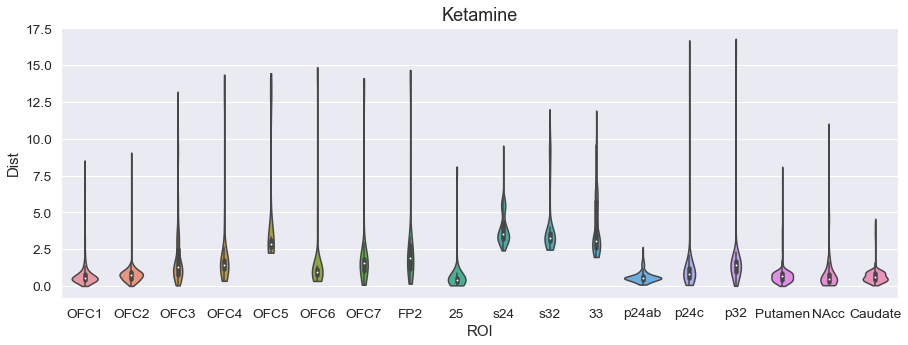

In [45]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=k_df, order = roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Ketamine', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Plots/Dist_Ketamine_Violinplot')

**Placebo**

In [28]:
b_p_dist_dict=calculate_distance(dict_b_p, centroid_dict_b_p)

centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.5503923892974854 and  -2.87528657913208
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.2859420776367188 and  -4.092872619628906
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.986233949661255 and  -3.0699374675750732
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.1016931533813477 and  -3.2356536388397217
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.032506227493286 and  -3.3654050827026367
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.6042163372039795 and  -3.118363380432129
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.729343891143799 and  -3.267606019973755
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.742159366607666 and  -3.250498056411743
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.656796455383301 and  -2.96400737762

centroid_y:  -3.226566791534424
x+y:  3.1492276191711426 and  -3.6627349853515625
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.1422183513641357 and  -3.5707149505615234
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.1416232585906982 and  -3.625969409942627
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.03578519821167 and  -3.6584362983703613
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.7432048320770264 and  -3.245572328567505
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.574183464050293 and  -3.089085817337036
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.912128210067749 and  -2.468945026397705
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.557894229888916 and  -2.4543251991271973
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.013169765472412 and  -2.4350829124450684
centroid_x:  2.9006843

x+y:  1.7623841762542725 and  -2.9789230823516846
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.6314932107925415 and  -3.006537437438965
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.623081922531128 and  -2.9392287731170654
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.4737353324890137 and  -2.843017101287842
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.3489848375320435 and  -2.613574504852295
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.307656168937683 and  -2.4952070713043213
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.3286035060882568 and  -2.471897840499878
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.26933753490448 and  -3.034440517425537
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.2094461917877197 and  -10.31689167022705
centroid_x:  2.363102912902832
centroid_y:  -1.79

x+y:  2.4720518589019775 and  -2.238035202026367
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.018345594406128 and  -2.199071168899536
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.00331974029541 and  -2.424448013305664
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.0252692699432373 and  -2.448357343673706
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.9963557720184326 and  -2.6336750984191895
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.9748992919921875 and  -3.165865898132324
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.985034942626953 and  -3.776576280593872
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.8991177082061768 and  -3.7103514671325684
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.0714449882507324 and  -3.6519877910614014
centroid_x:  2.900684356689453
centroid_y:  -3.226566

x+y:  2.2286314964294434 and  -3.1122045516967773
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.338693141937256 and  -3.366884469985962
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.483142375946045 and  -3.496689796447754
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.747485399246216 and  -3.3621509075164795
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.802744150161743 and  -3.9104983806610107
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.0976309776306152 and  -3.2957417964935303
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.527548313140869 and  -3.45756459236145
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.286144733428955 and  -3.3962044715881348
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.25934100151062 and  -3.52457332611084
centroid_x:  2.281481981277466
centroid_y:  -3.1949298381805

x+y:  2.1082358360290527 and  -2.059448719024658
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.6491475105285645 and  -2.260066032409668
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.5237832069396973 and  -2.247144937515259
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.58567214012146 and  -2.355067491531372
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.8656814098358154 and  -2.9155006408691406
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.7637147903442383 and  -3.4504847526550293
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.8419690132141113 and  -3.7461788654327393
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.7464611530303955 and  -3.6471445560455322
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.567314624786377 and  -3.5744431018829346
centroid_x:  2.281481981277466
centroid_y:  -3.194

x+y:  3.0287938117980957 and  -3.99648118019104
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.9501941204071045 and  -3.6218369007110596
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.838960886001587 and  -3.4470934867858887
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.1129488945007324 and  -2.6478161811828613
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.1914689540863037 and  -2.5956807136535645
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.212151527404785 and  -2.624183177947998
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.0302906036376953 and  -2.4284470081329346
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.9379074573516846 and  -2.508502721786499
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.966515064239502 and  -2.660358428955078
centroid_x:  2.363102912902832
centroid_y:  -1.794

x+y:  2.517212390899658 and  -3.606987953186035
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.4817214012145996 and  -3.5642781257629395
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.6085681915283203 and  -3.745824098587036
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.4345359802246094 and  -3.4385194778442383
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.454068660736084 and  -3.4934699535369873
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.47651743888855 and  -3.708174467086792
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.3586831092834473 and  -3.280583143234253
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.295501708984375 and  -3.330362319946289
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.686678171157837 and  -2.58616304397583
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180

x+y:  2.0105655193328857 and  -1.7719745635986328
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.1091184616088867 and  -1.8334304094314575
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.587905168533325 and  -1.7025277614593506
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.7242729663848877 and  -1.7339951992034912
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.9558448791503906 and  -1.4527391195297241
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.8350610733032227 and  -1.6311287879943848
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.82112717628479 and  -1.6909348964691162
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.808133840560913 and  -1.9719568490982056
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.7789511680603027 and  -3.367029905319214
centroid_x:  2.900684356689453
centroid_y:  -

centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.324110269546509 and  -2.6391921043395996
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.2094295024871826 and  -2.322136878967285
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.3584017753601074 and  -2.9581072330474854
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.4978787899017334 and  -2.9040043354034424
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.332874298095703 and  -3.085500478744507
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  3.1025097370147705 and  -4.112997055053711
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.9276885986328125 and  -4.403564453125
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.7695021629333496 and  -4.387323379516602
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.855767250061035 and  -4.47173

centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.4668023586273193 and  -4.076392650604248
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.381199359893799 and  -3.5626745223999023
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.3451013565063477 and  -2.3898491859436035
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.078580379486084 and  -2.0593409538269043
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.8708646297454834 and  -1.9960349798202515
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.8304109573364258 and  -1.727570652961731
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.8269280195236206 and  -1.6579025983810425
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.783284306526184 and  -1.591480016708374
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  1.770362377166748 and  -1.323

x+y:  4.808576583862305 and  2.1428236961364746
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.848424434661865 and  2.2140653133392334
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.953975200653076 and  2.159621477127075
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.8297996520996094 and  1.886684775352478
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.8480587005615234 and  1.9332386255264282
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.7900307178497314 and  1.9613844156265259
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.72693133354187 and  1.8931620121002197
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.7640185356140137 and  1.722736120223999
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.136653184890747 and  -0.3575480580329895
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.08456492424

centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.137863874435425 and  -2.7151670455932617
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.124800205230713 and  -3.2914347648620605
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  2.1149399280548096 and  -3.1600120067596436
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.0513741970062256 and  -3.941291093826294
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.022672176361084 and  -3.783902883529663
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.113800048828125 and  -3.6957128047943115
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.8827252388000488 and  -2.374680280685425
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.8614790439605713 and  -2.3394389152526855
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.0668745040893555 and  -2.6845703

x+y:  2.755460262298584 and  -1.5669721364974976
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  2.7292027473449707 and  -2.2521255016326904
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  2.420058012008667 and  -4.082691192626953
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  2.5443429946899414 and  -4.291371822357178
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.8025660514831543 and  -7.3797760009765625
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.636727213859558 and  -7.566134929656982
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  1.7024319171905518 and  -7.713927745819092
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.491760492324829 and  -4.365790367126465
centroid_x:  2.900684356689453
centroid_y:  -3.226566791534424
x+y:  2.3871965408325195 and  -4.474610805511475
centroid_x:  2.363102912902832
centroid_y:  -1

centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.553772211074829 and  1.1413177251815796
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.4999094009399414 and  0.5959331393241882
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.4577035903930664 and  0.4605385661125183
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.4406838417053223 and  0.32917672395706177
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.500291585922241 and  0.36079442501068115
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.4944567680358887 and  0.32174593210220337
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.513775110244751 and  0.0235754307359457
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.025434970855713 and  -1.3410634994506836
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.0994231700897217 and 

x+y:  1.9616214036941528 and  -2.495617389678955
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.1489431858062744 and  -2.6001715660095215
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.3051817417144775 and  -2.566737651824951
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.9553484916687012 and  -3.064946174621582
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.2094860076904297 and  -2.990189552307129
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.7256927490234375 and  -3.5720200538635254
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.998871088027954 and  -3.834010362625122
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.9348430633544922 and  -3.888091564178467
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.9039056301116943 and  -3.6533358097076416
centroid_x:  1.583754062652588
centroid_y:  -6.419897

x+y:  1.8673458099365234 and  -7.708257675170898
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.8518381118774414 and  -7.911751747131348
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.6011571884155273 and  -7.7985100746154785
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  -0.532038152217865 and  1.5640588998794556
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.9136483669281006 and  -0.44722095131874084
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  2.03969407081604 and  -0.5193349719047546
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.985432505607605 and  -0.5477985739707947
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  2.0229969024658203 and  -0.5497192144393921
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.016364574432373 and  -0.559425413608551
centroid_x:  2.363102912902832
centroi

x+y:  4.931258201599121 and  1.9329742193222046
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.933622360229492 and  2.036210298538208
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.882203578948975 and  1.9845943450927734
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.900235652923584 and  1.986777663230896
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.813100337982178 and  2.043325424194336
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.779270172119141 and  2.0166127681732178
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.94260311126709 and  1.8212227821350098
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.8195762634277344 and  1.8612871170043945
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.8563175201416016 and  1.7893022298812866
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.787545919418335 and  1

x+y:  4.835724353790283 and  1.6530689001083374
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.089398384094238 and  1.2367154359817505
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.008347511291504 and  1.0948021411895752
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  3.9669060707092285 and  1.2174097299575806
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.9924700260162354 and  1.08665132522583
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.96819806098938 and  0.8580614328384399
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.9304800033569336 and  0.7641955018043518
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.896566867828369 and  0.7954061627388
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  3.831181526184082 and  0.5863960385322571
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741

centroid_y:  -3.194929838180542
x+y:  1.8021918535232544 and  -2.79917049407959
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.089235305786133 and  -2.2829501628875732
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  1.9963210821151733 and  -2.356679916381836
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.0437281131744385 and  -2.4311370849609375
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.0835001468658447 and  -2.562222480773926
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.0737059116363525 and  -2.4096884727478027
centroid_x:  2.281481981277466
centroid_y:  -3.194929838180542
x+y:  2.129596471786499 and  -8.295552253723145
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.9632487297058105 and  -8.135034561157227
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.9042434692382812 and  -8.264130592346191
centroid_x:  1.58375406

x+y:  3.946784257888794 and  2.140507459640503
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.933242082595825 and  2.2012627124786377
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.7866721153259277 and  2.0325353145599365
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.835660457611084 and  2.0560450553894043
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.7836503982543945 and  1.866809606552124
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.7665772438049316 and  1.8362102508544922
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.7132065296173096 and  1.7837306261062622
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.4449515342712402 and  1.6167665719985962
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.2513930797576904 and  1.4694236516952515
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473

centroid_y:  -9.678050994873047
x+y:  3.340148448944092 and  -1.005050539970398
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.345759630203247 and  -1.0589103698730469
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.550999879837036 and  -0.9784281849861145
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.9872074127197266 and  -0.34595823287963867
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.06440544128418 and  -0.23328673839569092
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.752193450927734 and  0.9400288462638855
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.748418807983398 and  0.9609869718551636
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.9133124351501465 and  1.0382845401763916
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.830348968505859 and  1.3038445711135864
centroid_x: 

centroid_y:  -3.066465377807617
x+y:  1.772837519645691 and  -3.2123279571533203
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.8131779432296753 and  -3.1959290504455566
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.896880030632019 and  -2.677870512008667
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.9172394275665283 and  -2.7884654998779297
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.9341427087783813 and  -2.7544233798980713
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.89731764793396 and  -2.994856119155884
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.8470737934112549 and  -3.153529167175293
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  1.9896057844161987 and  -3.2557430267333984
centroid_x:  1.956697702407837
centroid_y:  -3.066465377807617
x+y:  2.2274396419525146 and  -2.7024338245391846
centroid_x:  1.956697

centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.1306421756744385 and  1.0709444284439087
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.119018077850342 and  1.0307447910308838
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  3.0929439067840576 and  0.9368636608123779
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.950723886489868 and  0.8255480527877808
centroid_x:  2.363102912902832
centroid_y:  -1.7942759990692139
x+y:  2.743675947189331 and  0.6359968781471252
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.021095633506775 and  -8.077807426452637
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  0.9932260513305664 and  -8.101059913635254
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  1.024867296218872 and  -8.11811637878418
centroid_x:  1.6688745021820068
centroid_y:  -6.2883219718933105
x+y:  0.910020112991333 and  -8.13

centroid_y:  -1.7942759990692139
x+y:  4.1816182136535645 and  -0.09272895008325577
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.400055408477783 and  0.2335643321275711
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.785658836364746 and  0.9867966175079346
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.830728054046631 and  1.1144444942474365
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.90677547454834 and  1.2098909616470337
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.879639148712158 and  1.3403496742248535
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  4.854227542877197 and  1.512637972831726
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.828235149383545 and  1.498525619506836
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.793532371520996 and  1.6428202390670776
centroid_x:  3.90807795524

centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.777736186981201 and  1.3120157718658447
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.741734981536865 and  1.2630257606506348
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  4.709749221801758 and  1.3940404653549194
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  4.133692741394043 and  1.010277509689331
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  4.129374027252197 and  0.8987014889717102
centroid_x:  3.910292863845825
centroid_y:  -0.07856474071741104
x+y:  4.089460372924805 and  0.8273901343345642
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.167026996612549 and  -9.817359924316406
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.047700881958008 and  -9.834394454956055
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.001321315765381 and  -10.05

x+y:  4.94144868850708 and  1.9545295238494873
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.877073287963867 and  2.0251519680023193
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.8387131690979 and  1.959176778793335
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.9784750938415527 and  2.2642877101898193
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.8498215675354004 and  2.1065256595611572
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.843733549118042 and  2.0285873413085938
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.819335460662842 and  1.7241113185882568
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.60512638092041 and  1.7384213209152222
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y:  3.563558578491211 and  1.3797080516815186
centroid_x:  3.6245594024658203
centroid_y:  0.6687418818473816
x+y

centroid_y:  1.3033367395401
x+y:  4.850975513458252 and  1.7461549043655396
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.711020469665527 and  1.7253596782684326
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.750667572021484 and  1.8464257717132568
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.6664628982543945 and  1.734828233718872
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  4.047343730926514 and  1.7723593711853027
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  3.9909398555755615 and  1.3420404195785522
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  3.964188814163208 and  1.581088662147522
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.952943801879883 and  1.4382457733154297
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  3.9596972465515137 and  1.4930332899093628
centroid_x:  4.187370777130127
centroid_y:  1.30

x+y:  1.875356674194336 and  -3.4241204261779785
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.8917350769042969 and  -3.0060789585113525
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  2.0189783573150635 and  -2.5738420486450195
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.7605303525924683 and  -3.4278781414031982
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.7429790496826172 and  -3.5987467765808105
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.9320050477981567 and  -3.552809238433838
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.886829137802124 and  -3.4825668334960938
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.8801618814468384 and  -2.887678861618042
centroid_x:  1.583754062652588
centroid_y:  -6.419897079467773
x+y:  1.672721028327942 and  -3.323709487915039
centroid_x:  1.583754062652588
centroid_y:  -6.41989

x+y:  1.3186360597610474 and  -8.462545394897461
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.2570946216583252 and  -8.476252555847168
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.29233980178833 and  -8.626194953918457
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.3596676588058472 and  -8.60226821899414
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.0399396419525146 and  -8.527220726013184
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  0.8747804164886475 and  -8.470789909362793
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.02823805809021 and  -8.46230697631836
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  0.9623251557350159 and  -8.392398834228516
centroid_x:  4.187370777130127
centroid_y:  1.3033367395401
x+y:  0.910382866859436 and  -8.370645523071289
centroid_x:  4.187370777130127
centroid_y:  1.303336739540

x+y:  1.1399362087249756 and  -7.69372034072876
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -2.608515977859497 and  1.5943617820739746
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.15230393409729 and  -2.3264641761779785
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.0402896404266357 and  -4.345637798309326
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.0914933681488037 and  -3.356200933456421
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -2.6043219566345215 and  1.5721830129623413
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.0937092304229736 and  -2.4433655738830566
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.0811564922332764 and  -3.0776479244232178
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.0163679122924805 and  -3.08616304397583
centroid_x:  0.519551694393158
centroid_y:  -5.

centroid_y:  -0.5318092703819275
x+y:  4.406594753265381 and  1.4098230600357056
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  4.081666946411133 and  1.397588849067688
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  4.070266246795654 and  1.3462022542953491
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  4.0320963859558105 and  1.2757714986801147
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.2254068851470947 and  -8.646838188171387
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.4132150411605835 and  -8.95529556274414
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.4308018684387207 and  -8.985736846923828
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.5732842683792114 and  -8.946918487548828
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.6411335468292236 and  -8.870064735412598
centroid_x:  1.5

x+y:  0.6082987189292908 and  -8.5771484375
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  1.0001652240753174 and  -8.56378173828125
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.8525762557983398 and  -8.5022611618042
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.6205456852912903 and  -8.262846946716309
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.49197453260421753 and  -8.287288665771484
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.4562622010707855 and  -8.30134391784668
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.4119528532028198 and  -8.372187614440918
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.24247394502162933 and  -8.361627578735352
centroid_x:  0.5626610517501831
centroid_y:  -8.885432243347168
x+y:  0.4987412393093109 and  -8.372045516967773
centroid_x:  0.5626610517501831
centroid_y:  -8.885432

centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.4988889694213867 and  -1.9029473066329956
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -1.1719529628753662 and  1.42908775806427
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.6220853328704834 and  -1.78975510597229
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.996292233467102 and  1.4050477743148804
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.7886987924575806 and  -1.8170849084854126
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.614510416984558 and  -1.6587189435958862
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -1.0350052118301392 and  1.162245512008667
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.956199288368225 and  -1.9120879173278809
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.5030944347381592 and  -1

centroid_y:  -8.649028778076172
x+y:  1.744776964187622 and  -9.200629234313965
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.7763175964355469 and  -9.048344612121582
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.8594765663146973 and  -9.138750076293945
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.771726369857788 and  -8.982839584350586
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.9503135681152344 and  -9.04321575164795
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.136094570159912 and  1.233641505241394
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.0587663650512695 and  1.2159500122070312
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.108737468719482 and  1.2621541023254395
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  3.973790168762207 and  1.2276028394699097
centroid_x:  2.174

x+y:  1.6083984375 and  -9.674281120300293
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.6646218299865723 and  -9.612467765808105
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.7546552419662476 and  -9.514571189880371
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.825135350227356 and  -9.368885040283203
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.24564266204834 and  -9.916729927062988
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.1761741638183594 and  -9.804437637329102
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.0025112628936768 and  -10.005253791809082
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.7037330865859985 and  -9.727991104125977
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.7786016464233398 and  -9.5552339553833
centroid_x:  2.1741158962249756
centroid_y:  -8.6490287

x+y:  1.51552152633667 and  -9.370983123779297
centroid_x:  3.9080779552459717
centroid_y:  -0.5318092703819275
x+y:  1.4910813570022583 and  -9.31064224243164
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.0579047203063965 and  1.3688099384307861
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.042153835296631 and  1.25062894821167
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.06067419052124 and  1.2419748306274414
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  4.07811975479126 and  1.2789095640182495
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.024326801300049 and  -10.456929206848145
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.137059450149536 and  -10.33948040008545
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.1194100379943848 and  -10.24572467803955
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778

x+y:  1.6259088516235352 and  -9.95527458190918
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6366089582443237 and  -10.04444694519043
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.4993098974227905 and  -10.008057594299316
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6839187145233154 and  -10.106277465820312
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.986732840538025 and  -10.43775749206543
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.942039966583252 and  -10.430458068847656
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.9097645282745361 and  -10.422615051269531
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.854124903678894 and  -10.476560592651367
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.933902382850647 and  -10.500831604003906
centroid_x:  1.5128509998321533
centroid_y:  -

x+y:  1.2681326866149902 and  -10.2493896484375
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.4025077819824219 and  -9.974913597106934
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5931406021118164 and  -10.19325065612793
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5499922037124634 and  -10.26121711730957
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.549433946609497 and  -10.1578369140625
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6994755268096924 and  -10.074361801147461
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7254323959350586 and  -9.345348358154297
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7657526731491089 and  -10.240013122558594
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.8533881902694702 and  -10.215859413146973
centroid_x:  2.1741158962249756
centroid_y:  -8

centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.9054697751998901 and  -10.775025367736816
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.7550928592681885 and  -10.841041564941406
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.9251896142959595 and  -10.267509460449219
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.9445518255233765 and  -10.470226287841797
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.986467957496643 and  -10.388940811157227
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.146013021469116 and  -10.845645904541016
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.017179489135742 and  -10.549622535705566
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.252546787261963 and  -10.66299819946289
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.1671738624572754 and 

centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.2438108921051025 and  -10.67203426361084
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.098536729812622 and  -10.669671058654785
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.7147523164749146 and  -10.689606666564941
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.0078625679016113 and  -10.700583457946777
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.0390326976776123 and  -10.374687194824219
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.0174803733825684 and  -10.51073932647705
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.7505162954330444 and  -10.936458587646484
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  1.5544450283050537 and  -10.727842330932617
centroid_x:  2.1741158962249756
centroid_y:  -8.649028778076172
x+y:  2.1078433990478516 an

centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.1485774517059326 and  -10.402413368225098
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7166008949279785 and  -10.189023971557617
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7318007946014404 and  -10.785714149475098
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.895163893699646 and  -10.904685020446777
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7225099802017212 and  -10.866076469421387
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.9205942153930664 and  -10.860786437988281
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.8919390439987183 and  -10.663363456726074
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.760300874710083 and  -10.793050765991211
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.8434903621673584 a

centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6341060400009155 and  -10.816851615905762
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5898464918136597 and  -10.84593391418457
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6470072269439697 and  -10.802284240722656
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.2333171367645264 and  -10.254976272583008
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5468775033950806 and  -11.143658638000488
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7696269750595093 and  -10.938851356506348
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.8821196556091309 and  -11.126181602478027
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.897136926651001 and  -10.995444297790527
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7956615686416626 a

centroid_y:  -9.678050994873047
x+y:  1.5605123043060303 and  -11.05109977722168
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.4987047910690308 and  -10.909368515014648
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.4324692487716675 and  -10.969852447509766
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.4028502702713013 and  -10.858640670776367
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.0619508028030396 and  -10.430244445800781
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  -0.4956081211566925 and  1.382706642150879
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5065617561340332 and  -11.125249862670898
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6557966470718384 and  -11.199854850769043
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7485278844833374 and  -11.03607177734375
centroid_

centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5986384153366089 and  -11.050190925598145
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.3493913412094116 and  -10.95377254486084
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6293681859970093 and  -11.174190521240234
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6643060445785522 and  -11.274191856384277
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6307801008224487 and  -11.262300491333008
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.740559697151184 and  -11.291576385498047
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.7031207084655762 and  -11.140069961547852
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6183946132659912 and  -11.17424201965332
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.562045931816101 and

x+y:  1.6353223323822021 and  -11.211207389831543
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.368549108505249 and  -11.280099868774414
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6517252922058105 and  -11.265704154968262
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.65704345703125 and  -11.330917358398438
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.5917210578918457 and  -11.251461029052734
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.436379313468933 and  -11.232449531555176
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.6860030889511108 and  -11.296277046203613
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.8599510192871094 and  -11.311237335205078
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.8052085638046265 and  -11.268732070922852
centroid_x:  1.5128509998321533
centroid_y

centroid_y:  -9.800189971923828
x+y:  0.9377758502960205 and  -11.137511253356934
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.2542047500610352 and  -11.261687278747559
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.2247421741485596 and  -11.293987274169922
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.2762861251831055 and  -11.25444507598877
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.335357666015625 and  -11.246381759643555
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  1.450907588005066 and  -11.520838737487793
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  0.9406543374061584 and  -11.20443058013916
centroid_x:  1.5128509998321533
centroid_y:  -9.678050994873047
x+y:  0.9345262050628662 and  -11.248453140258789
centroid_x:  0.8835276961326599
centroid_y:  -9.800189971923828
x+y:  0.9416049122810364 and  -11.238980293273926
centroid_x

centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  4.410037517547607 and  0.545930027961731
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  0.7564067840576172 and  -7.437692165374756
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.4111008644104004 and  -9.878154754638672
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.8691807985305786 and  -3.3437981605529785
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.291128158569336 and  -9.909226417541504
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.8264780044555664 and  -3.466986894607544
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  2.555488348007202 and  -3.6990199089050293
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  1.773462176322937 and  -3.533189296722412
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.25867345929145813 and  -7.

x+y:  -0.13092447817325592 and  -7.480710029602051
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.14403913915157318 and  -7.555588722229004
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -6.588286399841309 and  1.39255690574646
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.11866281181573868 and  -7.326724052429199
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.1165895164012909 and  -7.398608684539795
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.18155686557292938 and  -7.6109747886657715
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -6.498542308807373 and  1.4266853332519531
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.12029664218425751 and  -7.383246898651123
centroid_x:  0.519551694393158
centroid_y:  -5.7693095207214355
x+y:  -0.119828000664711 and  -7.4548258781433105
centroid_x:  0.519551694393158
centr

x+y:  -6.2557830810546875 and  1.3947538137435913
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.273495674133301 and  1.2611229419708252
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.213572025299072 and  1.2243857383728027
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.787283420562744 and  1.458869218826294
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.025207042694092 and  1.3833293914794922
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.403874397277832 and  1.341518521308899
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.137295246124268 and  1.2673548460006714
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.9514360427856445 and  1.3196965456008911
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.6747145652771 and  1.459067463874817
centroid_x:  -5.4373884201049805
centroid_y:  1.78

x+y:  -5.845829963684082 and  1.3668875694274902
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.24053430557251 and  1.3141906261444092
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.405914783477783 and  1.41690194606781
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.374194145202637 and  1.3264210224151611
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.142416954040527 and  1.3117225170135498
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.911682605743408 and  1.3815072774887085
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.125119209289551 and  1.2993088960647583
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.459123134613037 and  1.399356722831726
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.467570781707764 and  1.390916109085083
centroid_x:  -5.4373884201049805
centroid_y:  1.7895

x+y:  -5.055671691894531 and  1.9630351066589355
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.241837978363037 and  1.8775627613067627
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.308048725128174 and  1.9087928533554077
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.7203168869018555 and  1.9268931150436401
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.634746074676514 and  1.9208452701568604
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.5499796867370605 and  1.8894380331039429
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.420970439910889 and  1.816223382949829
centroid_x:  -2.7931745052337646
centroid_y:  1.6267194747924805
x+y:  -3.1964454650878906 and  1.7980785369873047
centroid_x:  -2.7931745052337646
centroid_y:  1.6267194747924805
x+y:  -3.123730421066284 and  1.8034212589263916
centroid_x:  -2.7931745052337646
centroid_y

centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.33030891418457 and  1.7939484119415283
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.177367687225342 and  1.8982993364334106
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.888333797454834 and  1.9421806335449219
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.645972728729248 and  1.8223012685775757
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.658203601837158 and  1.8953653573989868
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.684782028198242 and  1.881827712059021
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.418983459472656 and  1.8211721181869507
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.839188814163208 and  2.053776979446411
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.8668951988220215 and  1.

centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.700528621673584 and  2.254422187805176
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.6038455963134766 and  2.083101511001587
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.569833993911743 and  2.0843818187713623
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.6283164024353027 and  2.1573057174682617
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.691358804702759 and  2.2082715034484863
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.7877111434936523 and  2.1432740688323975
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.882963180541992 and  1.984222173690796
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.3658952713012695 and  1.8556816577911377
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -4.544825077056885

x+y:  -5.654099464416504 and  1.571695327758789
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.5509443283081055 and  1.818420171737671
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.669042587280273 and  1.7227448225021362
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.167139053344727 and  1.6245555877685547
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.267573356628418 and  1.7265100479125977
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.257964134216309 and  1.6058779954910278
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.537021636962891 and  1.7093414068222046
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.492596626281738 and  1.8190045356750488
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.119649410247803 and  1.6338986158370972
centroid_x:  -5.4373884201049805
centroid_y:  1.

centroid_y:  1.9072145223617554
x+y:  -1.0573660135269165 and  1.4732110500335693
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.7561104893684387 and  1.5014885663986206
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.993517875671387 and  1.492730975151062
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.289802074432373 and  1.5588113069534302
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.093926429748535 and  1.7734043598175049
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.02119779586792 and  1.5595602989196777
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.404008865356445 and  1.593796730041504
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.227202415466309 and  1.5335659980773926
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.954447269439697 and  1.6421841382980347
centroid_x:  -5

x+y:  -5.4764933586120605 and  1.795501947402954
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.690485000610352 and  1.5272777080535889
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.650245189666748 and  1.8094124794006348
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.250015735626221 and  1.8966206312179565
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.11852502822876 and  1.952486276626587
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.022263050079346 and  1.9902963638305664
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.5350849628448486 and  2.035043716430664
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.5583603382110596 and  2.103903293609619
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.21750807762146 and  2.131152629852295
centroid_x:  -1.7916738986968994
centroid_y:  1.

x+y:  -6.109569549560547 and  1.8964067697525024
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.130667686462402 and  1.8541443347930908
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.648606300354004 and  1.6336766481399536
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.2361040115356445 and  1.949362874031067
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.884257793426514 and  1.8315813541412354
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.776644706726074 and  1.911370038986206
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.4978928565979 and  2.0058202743530273
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.372007846832275 and  1.963040828704834
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.283851623535156 and  2.0555717945098877
centroid_x:  -5.4373884201049805
centroid_y:  1.789

centroid_y:  1.789565920829773
x+y:  -6.337560176849365 and  1.924289584159851
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.9032697677612305 and  1.7865451574325562
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.739294528961182 and  1.8859643936157227
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.850557804107666 and  1.713375210762024
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.136139869689941 and  1.6971337795257568
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.406284809112549 and  1.7624739408493042
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.420491695404053 and  1.7979824542999268
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.589376449584961 and  1.667733073234558
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.466923236846924 and  1.8039283752441406
centroid_x:  -5.43

centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.7471506595611572 and  1.6775680780410767
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.0512621402740479 and  1.495568037033081
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.7280864715576172 and  1.6418529748916626
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.062901496887207 and  1.7493245601654053
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.0526139736175537 and  1.7279090881347656
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.14284348487854 and  1.7632758617401123
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.3471660614013672 and  1.7517879009246826
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.8292673826217651 and  1.6738322973251343
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.1199772357

x+y:  -5.730875492095947 and  1.8964004516601562
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.9893364906311035 and  2.0069572925567627
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.838327884674072 and  2.126429796218872
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -5.6440911293029785 and  2.0331785678863525
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.3151237964630127 and  2.2122392654418945
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.1464972496032715 and  2.182304620742798
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.0759239196777344 and  2.2280375957489014
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.9911521673202515 and  2.142909526824951
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.1213629245758057 and  2.063667058944702
centroid_x:  -1.7916738986968994
centr

x+y:  -2.1532983779907227 and  2.323854923248291
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.229390859603882 and  2.251218557357788
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -5.484203338623047 and  1.9912656545639038
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.794930458068848 and  1.9963107109069824
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.865407943725586 and  2.0869362354278564
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.64957857131958 and  2.1423583030700684
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -5.519423007965088 and  2.0349984169006348
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.281209945678711 and  2.149785280227661
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.011854648590088 and  2.3160557746887207
centroid_x:  -1.7916738986968994
centroid_y: 

x+y:  -0.9628961682319641 and  1.6396452188491821
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.65791255235672 and  1.6971290111541748
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.888926029205322 and  2.0976104736328125
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.04780912399292 and  2.073888063430786
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.977932453155518 and  2.0801942348480225
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -6.000810146331787 and  2.0527312755584717
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.712554931640625 and  2.131086826324463
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.925606727600098 and  2.1002678871154785
centroid_x:  -5.4373884201049805
centroid_y:  1.789565920829773
x+y:  -5.980776309967041 and  2.0269479751586914
centroid_x:  -5.4373884201049805
centroid_y:  1.7

x+y:  -1.9128708839416504 and  2.2961418628692627
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -2.028994083404541 and  2.3794500827789307
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.5493935346603394 and  2.214262008666992
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.9987931847572327 and  1.9145324230194092
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.8477715253829956 and  2.2864725589752197
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.9908685684204102 and  2.297975778579712
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.8121744394302368 and  2.3168883323669434
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.792349934577942 and  2.2861180305480957
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -1.330936312675476 and  2.107107639312744
centroid_x:  -1.7916738986968994
cen

centroid_y:  1.9072145223617554
x+y:  -0.8784083127975464 and  1.8633840084075928
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.9480079412460327 and  1.9353286027908325
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.8852097392082214 and  1.8634777069091797
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.7932776212692261 and  1.85148024559021
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.9159135818481445 and  1.8878451585769653
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.734136164188385 and  1.7921276092529297
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.9320617914199829 and  1.9176911115646362
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.8592590689659119 and  1.8738118410110474
centroid_x:  -1.7916738986968994
centroid_y:  1.9072145223617554
x+y:  -0.7487394213676453 and  1.8367705345153809
c

In [49]:
b_p_df=pd.DataFrame.from_dict(b_p_dist_dict, orient='index')

In [50]:
b_p_df.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/B_P_centroid')

In [51]:
b_p_df

,x,y,ROI,ID,Dist
0,2.550392,-2.875287,OFC1,205889,0.496087
1,2.285942,-4.092873,OFC1,205890,1.062259
2,2.986234,-3.069937,OFC1,205980,0.178470
3,3.101693,-3.235654,OFC1,206071,0.201214
4,3.032506,-3.365405,OFC1,206162,0.191450
...,...,...,...,...,...
11878,-0.619342,1.684050,Caudate,491091,1.193383
11879,-0.624093,1.701689,Caudate,491182,1.185532
11880,-0.661921,1.710923,Caudate,491273,1.146679
11881,-0.667506,1.682475,Caudate,491364,1.146412


In [29]:
p_dist_dict=calculate_distance(dict_p, centroid_dict_p)

centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.739386796951294 and  -3.7363715171813965
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.47414231300354 and  -3.2297558784484863
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.0095107555389404 and  -3.5259978771209717
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.0312700271606445 and  -3.3987386226654053
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.920102119445801 and  -4.031643867492676
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5199127197265625 and  -3.7720212936401367
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.466846227645874 and  -3.9160046577453613
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.6233155727386475 and  -4.1108527183532715
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.2433

centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.2343666553497314 and  -3.842355966567993
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.3530701398849487 and  -3.0922462940216064
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.6417394876480103 and  -3.3138487339019775
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.6086690425872803 and  -3.842021942138672
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.622490406036377 and  -4.208406925201416
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -3.0385310649871826 and  -4.023531913757324
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5890753269195557 and  -3.7382307052612305
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.6333446502685547 and  -4.083326816558838
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.9685

centroid_y:  -2.373764753341675
x+y:  -2.6411712169647217 and  -2.9616928100585938
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.4215989112854004 and  -2.918769121170044
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.5267438888549805 and  -2.9440789222717285
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.6816067695617676 and  -2.780550479888916
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.9161322116851807 and  -3.2082815170288086
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.6565821170806885 and  -3.4680023193359375
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.803205966949463 and  -3.6631078720092773
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.906304359436035 and  -3.751335859298706
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.8538191318511963 and  -3.42416763305

x+y:  -3.08012056350708 and  -3.5147500038146973
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.2526586055755615 and  -3.9806628227233887
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.1280858516693115 and  -3.2611782550811768
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.0422203540802 and  -3.4567081928253174
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.19455885887146 and  -3.5709593296051025
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.0986640453338623 and  -4.109055042266846
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.1228129863739014 and  -4.046564102172852
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.194021224975586 and  -3.9326987266540527
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -3.2340409755706787 and  -3.5393667221069336
centroid_x:  -2.748140096664428

centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.831310987472534 and  -3.8555376529693604
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.8885350227355957 and  -4.1187615394592285
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.933786153793335 and  -4.619722843170166
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.81376576423645 and  -3.78737211227417
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.8503432273864746 and  -4.180980682373047
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5281102657318115 and  -3.8866944313049316
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.44915509223938 and  -3.560847282409668
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.6224550008773804 and  -3.4589409828186035
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.298520684

centroid_y:  -3.817998170852661
x+y:  -2.4617741107940674 and  -3.4540889263153076
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5899136066436768 and  -3.4795868396759033
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.8593859672546387 and  -3.8287534713745117
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.8462584018707275 and  -3.7392711639404297
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.8693060874938965 and  -3.9625182151794434
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.9181158542633057 and  -4.026731014251709
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.747159957885742 and  -4.087018966674805
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.9479563236236572 and  -3.939613103866577
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.7382469177246094 and  -4.2864599227

centroid_y:  -3.817998170852661
x+y:  -2.8661324977874756 and  -3.036750078201294
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.782386541366577 and  -3.550107479095459
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.864535093307495 and  -4.019128322601318
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.9688668251037598 and  -4.139566421508789
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.9155819416046143 and  -4.2058796882629395
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.893735408782959 and  -4.161380767822266
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.8014705181121826 and  -4.19787073135376
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.8213863372802734 and  -4.205952167510986
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.7338037490844727 and  -4.047495365142822
c

x+y:  -1.3492577075958252 and  -3.1665546894073486
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.5737578868865967 and  -3.296109437942505
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.187079906463623 and  -3.706515312194824
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5714194774627686 and  -0.35050052404403687
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.5560873746871948 and  -3.6360695362091064
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.4373736381530762 and  -3.210158109664917
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.3685145378112793 and  -3.3890793323516846
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.3153417110443115 and  -3.337937116622925
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.3237141370773315 and  -3.4593679904937744
centroid_x:  -2.277018785

x+y:  -1.4253748655319214 and  -3.360862970352173
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.4034665822982788 and  -3.276492118835449
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.4135937690734863 and  -3.1810693740844727
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.4543851613998413 and  -3.2914974689483643
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.3585165739059448 and  -3.268211603164673
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.2778759002685547 and  -3.2801601886749268
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.0885554552078247 and  -3.249389886856079
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.0724713802337646 and  -3.2270474433898926
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.3243393898010254 and  -5.197401523590088
centroid_x:  -2.2770187854

centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.466261625289917 and  -4.320301055908203
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5075628757476807 and  -3.900817394256592
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.844831943511963 and  -3.5086238384246826
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.6781483888626099 and  -3.251601457595825
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.5787537097930908 and  -2.9289438724517822
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.4501512050628662 and  -3.0832061767578125
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.3215246200561523 and  -2.9367895126342773
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.2907707691192627 and  -3.056138515472412
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.4947

x+y:  -2.6789629459381104 and  -4.17397403717041
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.670083522796631 and  -4.173863887786865
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.7889177799224854 and  -4.355274200439453
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.7005412578582764 and  -4.4765625
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.5919952392578125 and  -4.450109481811523
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.4390485286712646 and  -3.7696166038513184
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.4170992374420166 and  -3.369877576828003
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.154165744781494 and  -2.6117818355560303
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.921289086341858 and  -2.6053991317749023
centroid_x:  -2.2770187854766846
centro

x+y:  -2.9296183586120605 and  -3.286226511001587
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.4559788703918457 and  -3.275435209274292
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1198630332946777 and  -3.2377607822418213
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1988370418548584 and  -3.2285032272338867
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.21769118309021 and  -3.3371806144714355
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.964160442352295 and  -2.7887017726898193
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.9862470626831055 and  -2.7815563678741455
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.134739637374878 and  -2.8158977031707764
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.9995269775390625 and  -3.042116165161133
centroid_x:  -2.748140096664

centroid_y:  -3.640535831451416
x+y:  -2.1982390880584717 and  -4.9386186599731445
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.8994728326797485 and  -4.209364414215088
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.9074556827545166 and  -3.6898603439331055
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.604983925819397 and  -3.143064022064209
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8906373977661133 and  -3.179814100265503
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.011698007583618 and  -3.585378646850586
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9382891654968262 and  -3.508524179458618
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8712712526321411 and  -3.4935381412506104
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.5834918022155762 and  -3.5460939407348

x+y:  -1.8887784481048584 and  -2.8690431118011475
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.4920777082443237 and  -2.889299154281616
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.520708441734314 and  -2.8732714653015137
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.866122841835022 and  -2.899260997772217
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.904035210609436 and  -2.8869917392730713
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.21077561378479 and  -3.3864121437072754
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.4189467430114746 and  -4.060225009918213
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.3822946548461914 and  -4.1169114112854
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.4621334075927734 and  -4.052852630615234
centroid_x:  -2.1326420307159424


x+y:  -1.9669910669326782 and  -2.452544689178467
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9327893257141113 and  -2.546095371246338
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.955473780632019 and  -2.5428695678710938
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.029747247695923 and  -2.561573028564453
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.3147552013397217 and  -3.3895585536956787
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.424644947052002 and  -4.326951026916504
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.623832941055298 and  -4.442461013793945
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.407942533493042 and  -4.112533092498779
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.556356906890869 and  -4.53790807723999
centroid_x:  -2.7481400966644287
ce

x+y:  -2.7575888633728027 and  -1.814009666442871
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.677734136581421 and  -2.074336290359497
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.0127816200256348 and  -2.4424972534179688
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.115961790084839 and  -2.545569896697998
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.9946062564849854 and  -3.114210844039917
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.5265696048736572 and  -4.599788188934326
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.5732221603393555 and  -4.696102619171143
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.567910671234131 and  -4.641030311584473
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.558919906616211 and  -4.611278057098389
centroid_x:  -2.7481400966644287


x+y:  -3.258035898208618 and  -2.2048380374908447
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.856253147125244 and  -4.5921196937561035
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.8712315559387207 and  -4.623534202575684
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.73531174659729 and  -4.695876598358154
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.688854694366455 and  -4.817563533782959
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.591614007949829 and  -4.565521717071533
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.954594850540161 and  -3.509321451187134
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.608515501022339 and  -2.5436906814575195
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.752086639404297 and  -2.7191836833953857
centroid_x:  -2.2770187854766846
ce

centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.9320905208587646 and  -3.699972152709961
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.9347960948944092 and  -3.645479202270508
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -2.0596396923065186 and  -3.7977378368377686
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.4831691980361938 and  -3.2994136810302734
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.747654914855957 and  -3.759749412536621
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.5883870124816895 and  -3.311048746109009
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.9361460208892822 and  -3.2851712703704834
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.0437839031219482 and  -3.3365418910980225
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8767

centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.098968029022217 and  -2.8805882930755615
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.1688649654388428 and  -2.9113261699676514
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.6733415126800537 and  -3.0369832515716553
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.7723907232284546 and  -4.226886749267578
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.432554244995117 and  -4.759524822235107
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.3944876194000244 and  -5.210453033447266
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.2190897464752197 and  -5.159860610961914
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -2.0764212608337402 and  -4.82243537902832
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.655452

x+y:  -1.9546831846237183 and  -2.3507118225097656
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.2690882682800293 and  -1.8845617771148682
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.3893914222717285 and  -2.334359884262085
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.25718355178833 and  -3.1384665966033936
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.395437240600586 and  -4.660218238830566
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.260887622833252 and  -4.951475143432617
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.5530433654785156 and  -4.749931335449219
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.4896769523620605 and  -4.887280464172363
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.4850001335144043 and  -4.89125394821167
centroid_x:  -2.7481400966644287
centr

centroid_y:  0.5309603810310364
x+y:  -3.881190776824951 and  1.0525943040847778
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.7775163650512695 and  1.3339813947677612
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.8215112686157227 and  1.2715046405792236
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.030026435852051 and  1.2813246250152588
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.437588930130005 and  -0.08083469420671463
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.7401208877563477 and  -1.2075551748275757
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.672264575958252 and  -1.4591904878616333
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.6735668182373047 and  -1.4975268840789795
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.75321102142334 and  -1.250442862510681

centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.636643886566162 and  1.1723984479904175
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.926323413848877 and  0.9940645694732666
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.6878509521484375 and  0.9750666618347168
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.6948344707489014 and  0.7495692372322083
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.7582414150238037 and  0.9218028783798218
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.9422991275787354 and  0.822063148021698
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.8664538860321045 and  0.6734032034873962
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.4082601070404053 and  0.3364645838737488
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.480088233

x+y:  -3.432729482650757 and  -0.90699702501297
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.3322319984436035 and  -1.0936808586120605
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.251885175704956 and  -0.9714064002037048
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.160341739654541 and  -2.5644829273223877
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.327073335647583 and  -6.754385948181152
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.205810308456421 and  -8.651535987854004
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.90185284614563 and  -4.687584400177002
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.653141498565674 and  -5.002822399139404
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.7066357135772705 and  -4.3567352294921875
centroid_x:  -2.7481400966644287
ce

x+y:  -1.6823090314865112 and  -2.9487903118133545
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.5380699634552002 and  -2.8933043479919434
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.7009830474853516 and  -2.889047622680664
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.7901884317398071 and  -3.0047924518585205
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.0131924152374268 and  -2.837791681289673
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.9700005054473877 and  -2.8263907432556152
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.7136424779891968 and  -2.8827450275421143
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.6918673515319824 and  -2.927374839782715
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.6484602689743042 and  -2.7660109996795654
centroid_x:  -2.13264203

centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.993652105331421 and  -6.059874057769775
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.3909225463867188 and  -4.9134721755981445
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.8407169580459595 and  -5.864105701446533
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.074629545211792 and  -5.7038960456848145
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.065216541290283 and  -5.817162036895752
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.1739115715026855 and  -4.6772942543029785
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.5277609825134277 and  -3.067122220993042
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.695029854774475 and  -3.0287413597106934
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.781454205513000

x+y:  -1.9885928630828857 and  -1.2100528478622437
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9454418420791626 and  -1.167208194732666
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1237759590148926 and  -1.0997120141983032
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.0905141830444336 and  -1.1767728328704834
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.11371111869812 and  -1.327435851097107
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.039958953857422 and  -1.4337656497955322
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.0997211933135986 and  -1.423351764678955
centroid_x:  -2.7481400966644287
centroid_y:  -3.817998170852661
x+y:  -2.097325325012207 and  -2.5874006748199463
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.650765299797058 and  -3.0828404426574707
centroid_x:  -1.5341565608978271

x+y:  -2.1609058380126953 and  -1.9365531206130981
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.066084861755371 and  -1.5304803848266602
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.018341064453125 and  -1.3823434114456177
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.0295915603637695 and  -1.2817732095718384
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.0456132888793945 and  -1.2954756021499634
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -1.9881047010421753 and  -1.2966036796569824
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.410311222076416 and  1.3023035526275635
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.632199287414551 and  1.381329894065857
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.441030025482178 and  1.4835172891616821
centroid_x:  -3.962065935

centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.297320604324341 and  -0.08211518824100494
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.169767379760742 and  -0.21990585327148438
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.1939220428466797 and  -0.3725496530532837
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.1464695930480957 and  -0.5815448760986328
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.212157964706421 and  -0.47110632061958313
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.943434476852417 and  -0.732283353805542
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.3158347606658936 and  -2.021038055419922
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.0367348194122314 and  -2.0485644340515137
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.0

x+y:  -2.702759027481079 and  -1.4902453422546387
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.658815860748291 and  1.0465433597564697
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.887301445007324 and  0.9238070845603943
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.761166095733643 and  1.0218786001205444
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.743844509124756 and  0.8968935012817383
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.716102600097656 and  0.9380531907081604
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.581516265869141 and  1.1595274209976196
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.518833637237549 and  1.0962224006652832
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.554355621337891 and  1.1190688610076904
centroid_x:  -3.9620659351348877
centr

x+y:  -3.311213970184326 and  -0.9807016849517822
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.1385741233825684 and  -8.954373359680176
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1109631061553955 and  -9.018952369689941
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1662752628326416 and  -8.83359146118164
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.3890416622161865 and  -1.9240306615829468
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.3484673500061035 and  -2.053227424621582
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.3212568759918213 and  -1.995429277420044
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.3584742546081543 and  -1.8484437465667725
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.8776283264160156 and  -0.9431069493293762
centroid_x:  -3.788897752761

x+y:  -1.6921343803405762 and  -2.9274027347564697
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.7858983278274536 and  -3.0903193950653076
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.0924811363220215 and  -3.991673231124878
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -1.8226431608200073 and  -4.16981840133667
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -1.918741226196289 and  -3.8823835849761963
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.9773650169372559 and  -3.9112167358398438
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.8752084970474243 and  -4.276796817779541
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -2.011732578277588 and  -3.103511095046997
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.064624071121216 and  -3.3294878005981445
centroid_x:  -2.13264203071594

x+y:  -1.8080130815505981 and  -1.2261098623275757
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.7830313444137573 and  -1.2598894834518433
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8419357538223267 and  -1.246277093887329
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8333138227462769 and  -1.2307089567184448
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8426920175552368 and  -1.1882154941558838
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.0267937183380127 and  -1.4948323965072632
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.8756866455078125 and  -2.7824833393096924
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.0127809047698975 and  -2.9698879718780518
centroid_x:  -2.1326420307159424
centroid_y:  -3.640535831451416
x+y:  -2.2225217819213867 and  -3.276789426803589
centroid_x:  -2.1326420

centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.9669679403305054 and  -1.071218490600586
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9657866954803467 and  -1.0203889608383179
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9260880947113037 and  -1.1366649866104126
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.84764564037323 and  -1.1495554447174072
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.277355670928955 and  1.5336593389511108
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.391726970672607 and  1.4247264862060547
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.34691047668457 and  1.4445981979370117
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.9169089794158936 and  1.206668734550476
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.9420905113220

x+y:  -3.135413408279419 and  -0.0015214509330689907
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.9354331493377686 and  -0.22620125114917755
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.8807013034820557 and  -0.22167831659317017
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.7952816486358643 and  -0.5160393714904785
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.849626302719116 and  -0.5696032643318176
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.9563663005828857 and  -0.5798619389533997
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.77258038520813 and  -0.6032111048698425
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.4779038429260254 and  -7.517263889312744
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.4579960107803345 and  -7.570985794067383
centroid_x:  -1.534156560897827

x+y:  -3.4426796436309814 and  0.3297266364097595
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.236102342605591 and  0.08474241197109222
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.161837100982666 and  -0.19871634244918823
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.117718458175659 and  -0.13023103773593903
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.0764455795288086 and  -0.16231228411197662
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.932917833328247 and  -0.5469334721565247
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.110322952270508 and  -0.5647769570350647
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -3.191925287246704 and  -0.6328523755073547
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.7417688369750977 and  -0.5840988159179688
centroid_x:  -1.534156560897827

centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.304673910140991 and  -0.2909853160381317
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.1667821407318115 and  -0.5189356803894043
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.201611280441284 and  -0.5276970267295837
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.319422721862793 and  -0.6069137454032898
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.3524153232574463 and  -0.7505809664726257
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.321634292602539 and  -0.7308909893035889
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -0.4824354350566864 and  1.4065593481063843
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.9531495571136475 and  -1.3652838468551636
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.858

x+y:  -4.433868408203125 and  0.9873419404029846
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.103513240814209 and  0.7550055980682373
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.7460882663726807 and  0.6586456894874573
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.7596044540405273 and  0.4567658305168152
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.792773962020874 and  0.32702288031578064
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.7705211639404297 and  0.15423376858234406
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.721353769302368 and  0.19402828812599182
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.7065820693969727 and  -0.030583666637539864
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.788651943206787 and  -0.11254456639289856
centroid_x:  -3.78889775276

x+y:  -2.074920892715454 and  -9.323028564453125
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.989771842956543 and  -9.036359786987305
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.970224380493164 and  -9.033278465270996
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.078601121902466 and  -9.007342338562012
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.902134418487549 and  -0.9774441123008728
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.9434409141540527 and  -1.0191384553909302
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.94392466545105 and  -0.937833309173584
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.983254909515381 and  -0.8332785367965698
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.651816368103027 and  0.43224242329597473
centroid_x:  -3.788897752761841
cen

centroid_y:  -3.640535831451416
x+y:  -1.7797012329101562 and  -2.8884522914886475
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9073125123977661 and  -3.4792888164520264
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.535126805305481 and  -7.423532962799072
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.6220810413360596 and  -7.376172065734863
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.6325029134750366 and  -7.020401954650879
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.4757804870605469 and  -7.902073860168457
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.6891591548919678 and  -6.979821681976318
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.3962904214859009 and  -7.452818870544434
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.2516200542449951 and  -7.59976053237915
cent

x+y:  -2.0412850379943848 and  -0.6726887822151184
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.982532262802124 and  -0.6741003394126892
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.009255886077881 and  -0.7407532930374146
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -1.9479626417160034 and  -0.9341081380844116
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.334316253662109 and  1.49222993850708
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.369614601135254 and  1.521321177482605
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.401986122131348 and  1.4581587314605713
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -4.526306629180908 and  1.357085108757019
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.420713424682617 and  1.4573415517807007
centroid_x:  -3.9620659351348877
centroid_y

centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.499389171600342 and  0.8110500574111938
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.286170244216919 and  0.6252998113632202
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.260739803314209 and  0.6248816251754761
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.0848631858825684 and  0.20622549951076508
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.867905855178833 and  -0.28607019782066345
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.8078880310058594 and  -0.30944952368736267
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.7997403144836426 and  -0.31897521018981934
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.5353965759277344 and  -0.6852803826332092
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  

centroid_y:  -2.373764753341675
x+y:  -2.377793550491333 and  -0.5835011601448059
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.3598690032958984 and  -0.4349726140499115
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.37949800491333 and  -0.4692537188529968
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.520977973937988 and  0.8643693327903748
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.734570026397705 and  1.0520780086517334
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.665472507476807 and  0.8974730968475342
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.661863327026367 and  1.055169701576233
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.682158470153809 and  0.9400696158409119
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.624123573303223 and  1.2297977209091187

x+y:  -3.633305788040161 and  -0.30163145065307617
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.5651586055755615 and  -0.42373302578926086
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.572518825531006 and  -0.40333497524261475
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -1.3586386442184448 and  -8.206976890563965
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5182437896728516 and  -8.164098739624023
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.4408541917800903 and  -8.318475723266602
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0513604879379272 and  -8.370586395263672
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -3.641470193862915 and  -1.2219932079315186
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -3.674694061279297 and  -1.1521319150924683
centroid_x:  -2.2770187854

x+y:  -3.746192455291748 and  -0.24757921695709229
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.7791054248809814 and  -0.2901794910430908
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.8762779235839844 and  -0.14272275567054749
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.7417168617248535 and  -0.20974983274936676
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9163711071014404 and  -9.131118774414062
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9520756006240845 and  -9.07827091217041
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9638360738754272 and  -9.022226333618164
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9534856081008911 and  -8.852322578430176
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.939161777496338 and  -8.916404724121094
centroid_x:  -2.0383901596

x+y:  -2.184443235397339 and  -9.72680377960205
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.0992324352264404 and  -2.839250326156616
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.206137180328369 and  -0.6465682983398438
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.425417423248291 and  0.28213417530059814
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.465319633483887 and  0.2698075771331787
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.428431987762451 and  0.526777982711792
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.162600040435791 and  0.48421433568000793
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.851590633392334 and  -0.014009102247655392
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -2.6579489707946777 and  -2.4738125801086426
centroid_x:  -3.788897752761841


centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.4589565992355347 and  -7.925919532775879
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.516404151916504 and  -7.8911590576171875
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.2583608627319336 and  -7.639679431915283
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.5266488790512085 and  -8.004841804504395
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.2747935056686401 and  -7.616306781768799
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.873039960861206 and  -9.017088890075684
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.6278594732284546 and  -7.78135347366333
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.1448619365692139 and  -7.9273505210876465
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -1.4096167

x+y:  -1.2387127876281738 and  -7.926318168640137
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.2020211219787598 and  -7.910800933837891
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.087975025177002 and  -0.5498924851417542
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.0462214946746826 and  -0.5479531288146973
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.1732873916625977 and  -0.48994776606559753
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -2.2185122966766357 and  -0.49948883056640625
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.2092607021331787 and  -0.5875818729400635
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1636955738067627 and  -0.6162979006767273
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.547605276107788 and  -0.14672695100307465
centroid_x:  -2.2770187854766846
cent

x+y:  -1.164412260055542 and  -7.93503475189209
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.1625049114227295 and  -0.7063881158828735
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.2964203357696533 and  -0.5185490846633911
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -2.271371841430664 and  -0.4343090355396271
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.292361259460449 and  -0.4602002203464508
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.2364282608032227 and  -0.5285388231277466
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.604423999786377 and  -0.09838777780532837
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.5847296714782715 and  1.1617615222930908
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.548408508300781 and  1.1826961040496826
centroid_x:  -3.39335489

centroid_y:  0.021331369876861572
x+y:  -2.6287355422973633 and  -0.4966994524002075
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.334658622741699 and  -0.4521687626838684
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -2.4419708251953125 and  -0.35529014468193054
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.575891971588135 and  0.8538975119590759
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.615357875823975 and  1.1233811378479004
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.689487457275391 and  1.0322716236114502
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.602270603179932 and  1.0627795457839966
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.632606506347656 and  1.1268765926361084
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.558866024017334 and  1.1121195554

x+y:  -4.207704067230225 and  -0.5787160992622375
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.4864888191223145 and  -0.10518816858530045
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.606222152709961 and  0.25225555896759033
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.632798194885254 and  0.4456261396408081
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.618917465209961 and  0.45774978399276733
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.631877422332764 and  0.6704200506210327
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.595852851867676 and  0.7981556057929993
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.5604248046875 and  0.8183099627494812
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.5535759925842285 and  0.9651910662651062
centroid_x:  -3.7363979816436768


centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -3.883270025253296 and  -0.03152434527873993
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9927146434783936 and  -9.494940757751465
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.0070834159851074 and  -9.564905166625977
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8273354768753052 and  -9.759060859680176
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.6329792737960815 and  -9.555510520935059
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8464268445968628 and  -8.982547760009766
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8593438863754272 and  -9.052477836608887
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7715978622436523 and  -9.100346565246582
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.83177

centroid_y:  -3.552319288253784
x+y:  -2.252281665802002 and  -4.015574932098389
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -2.005096197128296 and  -4.185441017150879
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -2.089306354522705 and  -3.440391778945923
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -1.9604781866073608 and  -3.5188140869140625
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -2.0728049278259277 and  -3.259554147720337
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -1.560455083847046 and  -5.339734077453613
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -1.6326026916503906 and  -3.3589913845062256
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -1.793592095375061 and  -3.2134881019592285
centroid_x:  -1.853474736213684
centroid_y:  -3.552319288253784
x+y:  -1.976159930229187 and  -3.4082517623901367
centroid

centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -0.7019944787025452 and  -8.209734916687012
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -0.736464262008667 and  -8.004875183105469
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -0.9577598571777344 and  -7.7982635498046875
centroid_x:  -2.2770187854766846
centroid_y:  -2.373764753341675
x+y:  -0.7641388773918152 and  -8.097124099731445
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -0.8158451318740845 and  -8.117740631103516
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -0.7480270266532898 and  -8.073724746704102
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.0588756799697876 and  -8.02802848815918
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -0.9381960034370422 and  -8.227254867553711
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -0.9428079724311829 and

centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.6725945472717285 and  0.9344931840896606
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.66620135307312 and  0.9061753153800964
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.73190975189209 and  0.7673532366752625
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.6394219398498535 and  0.7597861289978027
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.6205248832702637 and  0.7179988622665405
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.568366527557373 and  0.6800122261047363
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.627657175064087 and  0.729841411113739
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.5878074169158936 and  0.40687063336372375
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.5119488

x+y:  -4.683445930480957 and  0.8641309142112732
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -4.5765581130981445 and  0.9229187369346619
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.598686695098877 and  0.9605494737625122
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.648946285247803 and  0.9498292803764343
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.456437110900879 and  0.9961798787117004
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.526096820831299 and  0.9635996222496033
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -4.464134216308594 and  0.9754869937896729
centroid_x:  -3.9620659351348877
centroid_y:  0.5309603810310364
x+y:  -3.719589948654175 and  0.7468134760856628
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -3.7854483127593994 and  0.64462810754776
centroid_x:  -3.7363979816436768
cent

x+y:  -4.627543926239014 and  0.3837246000766754
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.601871013641357 and  0.3806460499763489
centroid_x:  -3.788897752761841
centroid_y:  -0.7598500847816467
x+y:  -4.665894508361816 and  0.36166346073150635
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.688929080963135 and  0.39076855778694153
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.580488681793213 and  0.7332529425621033
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.551745414733887 and  0.7411798238754272
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.588543891906738 and  0.8199619650840759
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.5072431564331055 and  0.9192271828651428
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.51932954788208 and  1.030142903327942
centroid_x:  -3.7363979816436768

centroid_y:  -1.1104496717453003
x+y:  -3.8440513610839844 and  0.1633029729127884
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -3.7891769409179688 and  0.179286926984787
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -3.8029327392578125 and  0.16097676753997803
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.785341501235962 and  0.11496824771165848
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.168914318084717 and  -10.047298431396484
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.2111904621124268 and  -10.064848899841309
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.267306089401245 and  -9.895366668701172
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.1847243309020996 and  -9.676568984985352
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.0955004692077637 and  -9.79261970520

centroid_y:  -6.206447124481201
x+y:  -0.6919095516204834 and  -8.142725944519043
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.7218879461288452 and  -8.044083595275879
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.983709454536438 and  -8.085603713989258
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.8815293908119202 and  -7.9976067543029785
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.7663741111755371 and  -8.25252914428711
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.4848981499671936 and  -8.472577095031738
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.40583285689353943 and  -8.39548397064209
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.585725724697113 and  -8.223151206970215
centroid_x:  -1.4246649742126465
centroid_y:  -6.206447124481201
x+y:  -0.6390077471733093 and  -8.22104549407959
c

centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -2.9626991748809814 and  -0.2616962194442749
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2736366987228394 and  -8.542013168334961
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -1.1033109426498413 and  -8.303775787353516
centroid_x:  -1.5341565608978271
centroid_y:  -6.334228515625
x+y:  -0.9497807621955872 and  -8.341155052185059
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.849086582660675 and  -8.322608947753906
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.8462119102478027 and  -8.240530014038086
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.6990693211555481 and  -8.803937911987305
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -0.6924538016319275 and  -8.569695472717285
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -0.6964198946

centroid_y:  -9.809224128723145
x+y:  -1.778607726097107 and  -8.722076416015625
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.5975192785263062 and  -8.746452331542969
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.7510701417922974 and  -8.862542152404785
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4465054273605347 and  -8.461995124816895
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.614232063293457 and  0.7127763628959656
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.478466510772705 and  0.8311870694160461
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.49839973449707 and  0.8515558242797852
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.371673583984375 and  0.780996561050415
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -4.247408866882324 and  0.743042528629303
ce

centroid_y:  -8.754473686218262
x+y:  -2.3157196044921875 and  -9.87291431427002
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.3318326473236084 and  -9.81157398223877
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.094794750213623 and  -9.808389663696289
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.204836845397949 and  -9.790980339050293
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.0826401710510254 and  -9.693382263183594
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.0592451095581055 and  -9.328878402709961
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -4.167474269866943 and  0.5471387505531311
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9100589752197266 and  -9.606423377990723
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.3134267330169678 and  -9.798564910888672
cen

x+y:  -0.5632129907608032 and  -8.303009033203125
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.8305442333221436 and  1.228114128112793
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -3.7643818855285645 and  1.1825261116027832
centroid_x:  -3.393354892730713
centroid_y:  0.021331369876861572
x+y:  -0.5713159441947937 and  -8.400708198547363
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.5800002813339233 and  -8.445878028869629
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.3164067566394806 and  -8.573898315429688
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.4796135127544403 and  -8.208891868591309
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.5928977727890015 and  -8.374341011047363
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.495548814535141 and  -8.320340156555176
centroid_x:  -0.7359653115272

x+y:  -3.729541301727295 and  0.6970179677009583
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -3.738164186477661 and  0.676643967628479
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2415721416473389 and  -8.563770294189453
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2347111701965332 and  -8.704520225524902
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.097267746925354 and  -8.684785842895508
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2735568284988403 and  -8.500657081604004
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.135225534439087 and  -8.608494758605957
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1010538339614868 and  -8.572256088256836
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.9838489294052124 and  -8.877342224121094
centroid_x:  -1.3628560304641724
c

centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -3.910600423812866 and  0.8581692576408386
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -3.9798476696014404 and  0.42220625281333923
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -1.5052788257598877 and  -3.660337448120117
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.1277108192443848 and  -9.773688316345215
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.1195826530456543 and  -9.68040943145752
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9744434356689453 and  -9.63978385925293
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8531086444854736 and  -9.696846961975098
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.94736647605896 and  -9.406830787658691
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8985314

centroid_y:  -5.147179126739502
x+y:  -0.5947219133377075 and  -8.521406173706055
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.8007382154464722 and  -8.511415481567383
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.8196303248405457 and  -8.142367362976074
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.7430473566055298 and  -8.701129913330078
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.8773602247238159 and  -8.703567504882812
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.9657069444656372 and  -8.221073150634766
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.7488635778427124 and  -8.368050575256348
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.6388708353042603 and  -8.212015151977539
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.7727163434028625 and  -8.48060607910156

centroid_y:  -9.809224128723145
x+y:  -1.3053874969482422 and  -8.65247631072998
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4465179443359375 and  -8.562952995300293
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.796980381011963 and  0.5263828039169312
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.821493148803711 and  0.40838006138801575
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.8217499256134033 and  0.45596396923065186
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.8235745429992676 and  0.3017280399799347
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.4847972393035889 and  -9.503983497619629
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5366928577423096 and  -9.485613822937012
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.4520395994186401 and  -9.411680221557617

centroid_y:  -8.916847229003906
x+y:  -0.3129056394100189 and  -8.334585189819336
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.3002821207046509 and  -8.266682624816895
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.2906346321105957 and  -8.435782432556152
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.3824367821216583 and  -8.426032066345215
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.467454731464386 and  -8.70275592803955
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.5126194357872009 and  -8.75537395477295
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.47807759046554565 and  -8.611897468566895
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.4287772476673126 and  -8.33315658569336
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.3193548619747162 and  -8.402374267578125
c

centroid_y:  -1.1104496717453003
x+y:  -1.9313809871673584 and  -9.637704849243164
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -1.9861146211624146 and  -9.638272285461426
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.0936970710754395 and  -10.123032569885254
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8820933103561401 and  -9.810606002807617
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.2715749740600586 and  -9.764313697814941
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.1758968830108643 and  -10.045602798461914
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.0684494972229004 and  -9.834251403808594
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9091243743896484 and  -9.80710506439209
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8347784280776978 and  -9.78630828857

x+y:  -1.309359073638916 and  -9.301102638244629
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1201931238174438 and  -9.558869361877441
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1416958570480347 and  -9.7943754196167
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0700664520263672 and  -9.622761726379395
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.8613377213478088 and  -9.605156898498535
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -1.029975175857544 and  -9.785691261291504
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.76759934425354 and  -9.31213092803955
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.7723885178565979 and  -9.693204879760742
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.829754650592804 and  -9.723098754882812
centroid_x:  -0.7359653115272522
centr

centroid_y:  -8.754473686218262
x+y:  -3.814086675643921 and  0.33494502305984497
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.7426412105560303 and  0.3158305585384369
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7170801162719727 and  -9.681069374084473
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8247466087341309 and  -9.619942665100098
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9111305475234985 and  -9.698140144348145
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.2365260124206543 and  -9.951186180114746
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -2.2573161125183105 and  -10.045674324035645
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.710080862045288 and  -10.054242134094238
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -1.7441091537475586 and  -9.984537124633

centroid_y:  -9.809224128723145
x+y:  -1.2723853588104248 and  -10.203969955444336
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.241468071937561 and  -10.211617469787598
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0883617401123047 and  -9.879971504211426
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.9746224880218506 and  -9.685028076171875
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.7997794151306152 and  -9.426952362060547
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.800754189491272 and  -9.86013126373291
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8484344482421875 and  -9.810562133789062
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9663352370262146 and  -9.858295440673828
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8313857913017273 and  -10.04112529754638

centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -1.802538514137268 and  -10.112993240356445
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.898465633392334 and  0.47861117124557495
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.775103807449341 and  0.3505610227584839
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.8064870834350586 and  0.42097315192222595
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.891841411590576 and  0.3494076728820801
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9301851987838745 and  -10.251387596130371
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7198747396469116 and  -10.098738670349121
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9637229442596436 and  -10.068902015686035
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.990

x+y:  -0.29520902037620544 and  -8.83651065826416
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.5553654432296753 and  -8.920501708984375
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.6169130206108093 and  -9.038505554199219
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.7459828853607178 and  -9.887521743774414
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.7741008996963501 and  -10.007444381713867
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8107825517654419 and  -10.058828353881836
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.7712536454200745 and  -10.102734565734863
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0052250623703003 and  -10.19044017791748
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.230099081993103 and  -10.015990257263184
centroid_x:  -0.73596531152

centroid_y:  -8.754473686218262
x+y:  -1.899793267250061 and  -10.727188110351562
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.618971824645996 and  -10.202080726623535
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7169312238693237 and  -10.250306129455566
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7602624893188477 and  -10.227301597595215
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -1.7757976055145264 and  -10.306367874145508
centroid_x:  -3.7363979816436768
centroid_y:  -1.1104496717453003
x+y:  -1.6194844245910645 and  -10.288543701171875
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -3.855283260345459 and  0.14378824830055237
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7131813764572144 and  -9.961614608764648
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8980650901794434 and  -10.6143016

centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0609794855117798 and  -10.362932205200195
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0806398391723633 and  -10.351496696472168
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.8184965252876282 and  -10.191953659057617
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2050412893295288 and  -10.486186981201172
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1155346632003784 and  -10.534175872802734
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.3293672800064087 and  -10.342089653015137
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.3100801706314087 and  -10.532293319702148
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.5348480939865112 and  -10.595014572143555
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -

centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5548943281173706 and  -10.764592170715332
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7336448431015015 and  -10.374300956726074
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9475899934768677 and  -10.701554298400879
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9227542877197266 and  -10.710790634155273
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.895936131477356 and  -10.749164581298828
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7632588148117065 and  -10.388566970825195
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5541578531265259 and  -10.46844482421875
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5644947290420532 and  -10.741191864013672
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.

centroid_y:  -9.724228858947754
x+y:  -0.7709062099456787 and  -10.394911766052246
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8265634775161743 and  -10.456844329833984
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9194523096084595 and  -10.441034317016602
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  0.6189935803413391 and  2.345241069793701
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1503835916519165 and  -10.533612251281738
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0209368467330933 and  -10.512899398803711
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8080455660820007 and  -9.94655704498291
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8521987199783325 and  -9.808338165283203
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.7246196866035461 and  -9.486629486083

centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.8410756587982178 and  -10.644017219543457
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.760162591934204 and  -10.845216751098633
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.6635408401489258 and  -10.684178352355957
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.6302903890609741 and  -10.824653625488281
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.4420890808105469 and  -10.835928916931152
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5537632703781128 and  -10.814603805541992
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8908575773239136 and  -10.96939754486084
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5174494981765747 and  -10.865106582641602
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.

x+y:  -1.1565425395965576 and  -10.54706859588623
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.8668871521949768 and  -10.382787704467773
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8839303255081177 and  -10.582101821899414
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9255896806716919 and  -10.66437816619873
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9632681012153625 and  -10.67955207824707
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.1304738521575928 and  -10.735374450683594
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.043768048286438 and  -10.717297554016113
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  0.5510352849960327 and  2.628801107406616
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1566492319107056 and  -10.727356910705566
centroid_x:  -1.362856030464

centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5309929847717285 and  -10.875870704650879
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.455104112625122 and  -10.668420791625977
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.7040289640426636 and  -10.868135452270508
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9079018831253052 and  -10.954867362976074
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.819421410560608 and  -10.582854270935059
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9429502487182617 and  -10.790237426757812
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.9094220399856567 and  -10.81466293334961
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.6617817878723145 and  -10.841163635253906
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5

centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.042187213897705 and  -10.801300048828125
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.6979827880859375 and  -10.522233009338379
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.5612342357635498 and  -11.099316596984863
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.6801795959472656 and  -10.952469825744629
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4892914295196533 and  -11.023587226867676
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.3577696084976196 and  -10.80478286743164
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.194175362586975 and  -10.746999740600586
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2779450416564941 and  -10.69967269897461
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.08

x+y:  -1.7460044622421265 and  -10.963237762451172
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.8077151775360107 and  -10.886589050292969
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.598623514175415 and  -10.868285179138184
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.4825907945632935 and  -10.928092956542969
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.4302558898925781 and  -10.972607612609863
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.5489674806594849 and  -10.954514503479004
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.6809637546539307 and  -11.149833679199219
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.6272410154342651 and  -10.979789733886719
centroid_x:  -2.0383901596069336
centroid_y:  -8.754473686218262
x+y:  -1.3792275190353394 and  -11.053757667541504
centroid_x:  -2.038390

centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2692872285842896 and  -10.930730819702148
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.5225334167480469 and  -10.969136238098145
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1910773515701294 and  -11.08263874053955
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0881496667861938 and  -11.059535026550293
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9943557977676392 and  -11.036760330200195
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.1084730625152588 and  -11.037633895874023
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9605979323387146 and  -10.87469482421875
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  0.7324200868606567 and  2.6695327758789062
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.60

x+y:  -0.614408552646637 and  -10.680536270141602
centroid_x:  -0.4345068037509918
centroid_y:  -8.916847229003906
x+y:  -0.7357484102249146 and  -10.835664749145508
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.7030515074729919 and  -10.732595443725586
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.6811861991882324 and  -10.825016975402832
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.731726348400116 and  -11.031051635742188
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.7777678966522217 and  -10.866589546203613
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.083560585975647 and  -10.437944412231445
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.0542659759521484 and  -10.820837020874023
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.2768220901489258 and  -11.247706413269043
centroid_x:  -0.73596531

centroid_y:  -5.147179126739502
x+y:  0.009196363389492035 and  -8.300422668457031
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.08666203171014786 and  -8.289692878723145
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.013478484936058521 and  -8.253165245056152
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.11529485881328583 and  -8.393434524536133
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.13387352228164673 and  -8.427605628967285
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.14831456542015076 and  -8.337200164794922
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.11490461975336075 and  -8.326720237731934
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.12247783690690994 and  -8.429483413696289
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  0.050174321979284286 and  -8.52975368499

centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1736328601837158 and  -11.45274829864502
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.1703320741653442 and  -11.4784574508667
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.8690844774246216 and  -0.449972540140152
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.5393964052200317 and  -11.375133514404297
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.6068321466445923 and  -11.294734001159668
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.6041007041931152 and  -11.45348072052002
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.6169283390045166 and  -11.35975456237793
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.6295572519302368 and  -11.32654857635498
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.08380

x+y:  -1.4016921520233154 and  -11.390647888183594
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2275584936141968 and  -11.195852279663086
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9482643604278564 and  -11.43276596069336
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9748003482818604 and  -11.558187484741211
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9784438610076904 and  -11.456476211547852
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.9867978692054749 and  -11.408500671386719
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8911211490631104 and  -11.042283058166504
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4290306568145752 and  -11.315149307250977
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4041928052902222 and  -11.48730182647705
centroid_x:  -1.3628560

x+y:  -1.3935834169387817 and  -11.557873725891113
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0041236877441406 and  -11.603285789489746
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -0.9773644208908081 and  -11.601215362548828
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.0529154539108276 and  -11.5765962600708
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.0345563888549805 and  -11.492352485656738
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -1.002329707145691 and  -11.44261360168457
centroid_x:  -0.7359653115272522
centroid_y:  -9.724228858947754
x+y:  -0.8513320088386536 and  -10.969846725463867
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.300972819328308 and  -11.411429405212402
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4319264888763428 and  -11.485645294189453
centroid_x:  -1.3628560304

x+y:  -1.5602076053619385 and  -11.62580680847168
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.3003151416778564 and  -11.691515922546387
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.193718433380127 and  -11.67535400390625
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2196229696273804 and  -11.638297080993652
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.187347650527954 and  -11.536959648132324
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.5607783794403076 and  -11.570255279541016
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.617824673652649 and  -11.558581352233887
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.566681146621704 and  -11.584305763244629
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4978244304656982 and  -11.66771411895752
centroid_x:  -1.362856030464

centroid_y:  -9.809224128723145
x+y:  -1.528279423713684 and  -11.533995628356934
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.4839799702167511 and  -8.319183349609375
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.0550495386123657 and  -2.2375919818878174
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.0966622829437256 and  -1.4141380786895752
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.1462337970733643 and  -1.3370829820632935
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -0.5173417925834656 and  -8.279439926147461
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.1174396276474 and  -2.3621323108673096
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.1482062339782715 and  -1.3943744897842407
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.1345069408416748 and  -1.378269433975

x+y:  -1.2042309045791626 and  -11.665047645568848
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.253749966621399 and  -11.673662185668945
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2611216306686401 and  -11.550081253051758
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4561619758605957 and  -11.587115287780762
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4807531833648682 and  -11.622916221618652
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.4507793188095093 and  -11.6257905960083
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.2506752014160156 and  -11.604535102844238
centroid_x:  -1.3628560304641724
centroid_y:  -9.809224128723145
x+y:  -1.300251841545105 and  -11.662915229797363
centroid_x:  -0.5680986642837524
centroid_y:  -5.147179126739502
x+y:  -1.0464811325073242 and  -1.284708023071289
centroid_x:  -0.5680986642

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.178841590881348 and  3.4148292541503906
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.602585315704346 and  3.2744767665863037
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.845592975616455 and  3.46895694732666
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.986966133117676 and  3.4708080291748047
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.606418609619141 and  3.262253761291504
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.053793430328369 and  3.443143844604492
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.818361759185791 and  3.3518824577331543
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.1384406089782715 and  3.359102964401245
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.185050964355469 and  3.099888324737549
centroid_x:  5.

x+y:  6.2021164894104 and  3.2618820667266846
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.574519157409668 and  3.318713903427124
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.7986674308776855 and  3.484621286392212
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.839136600494385 and  3.473081350326538
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.176882743835449 and  3.3464102745056152
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.686519622802734 and  3.29599666595459
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.170462608337402 and  3.4856653213500977
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.841033935546875 and  3.464319944381714
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.0070695877075195 and  3.4747800827026367
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.59723997

x+y:  2.9245445728302 and  2.874532699584961
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  3.1277427673339844 and  2.9841840267181396
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  3.1276168823242188 and  3.0383434295654297
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  3.3758504390716553 and  3.063812255859375
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  3.556349277496338 and  3.0194830894470215
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  3.7699248790740967 and  3.0925450325012207
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.154891490936279 and  3.0472476482391357
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.627012252807617 and  3.0991437435150146
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.568845748901367 and  3.0309510231018066
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.68521

centroid_y:  3.057382345199585
x+y:  6.568214416503906 and  3.1636195182800293
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.404969692230225 and  3.426025629043579
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.9014668464660645 and  3.4811835289001465
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.7048187255859375 and  3.3607661724090576
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.726285934448242 and  3.4401044845581055
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.949929237365723 and  3.3343446254730225
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.394413948059082 and  3.2221426963806152
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.492889404296875 and  3.064419984817505
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.207010269165039 and  3.230781078338623
centroid_x:  5.404442310333252
centroid_y:

x+y:  2.842808961868286 and  3.094298839569092
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  2.973705291748047 and  3.1576972007751465
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  3.1892201900482178 and  3.0835540294647217
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  3.5958969593048096 and  3.0573935508728027
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.280340671539307 and  3.0919740200042725
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.428622722625732 and  3.1256978511810303
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.544133186340332 and  3.0702977180480957
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.75210428237915 and  3.0643279552459717
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.966980457305908 and  2.9830636978149414
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.124

x+y:  1.1785584688186646 and  2.384956121444702
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.1869661808013916 and  2.710564136505127
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  2.4477908611297607 and  2.782566785812378
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  -2.815361499786377 and  -2.942319631576538
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.0373567342758179 and  2.424713373184204
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.028185248374939 and  2.3161630630493164
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.950397491455078 and  3.4344100952148438
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.799509525299072 and  3.4095046520233154
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.950044631958008 and  3.3369946479797363
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.1387400

centroid_y:  3.057382345199585
x+y:  4.923042297363281 and  3.2020740509033203
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.081598281860352 and  3.1476337909698486
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.334561347961426 and  3.2022628784179688
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.587465286254883 and  2.8099424839019775
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.740288257598877 and  2.7781519889831543
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.926594257354736 and  2.7798104286193848
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.697608470916748 and  2.91633939743042
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.196906566619873 and  3.1454827785491943
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.003977298736572 and  3.2798783779144287
centroid_x:  5.404442310333252
centroid_y: 

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.616810321807861 and  3.0510306358337402
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.308514595031738 and  3.0736091136932373
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  3.3443102836608887 and  3.09605073928833
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.756678581237793 and  3.115248441696167
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.8174071311950684 and  3.0575878620147705
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  2.6749308109283447 and  2.936005115509033
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  2.399505853652954 and  2.802685022354126
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  2.3397183418273926 and  2.793522357940674
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  2.7127366065979004 and  2.9834463596343994
centroid_x:  2.8218

centroid_y:  3.057382345199585
x+y:  6.351943492889404 and  3.1943230628967285
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.5149149894714355 and  3.010998010635376
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.4058003425598145 and  3.382514238357544
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.996082305908203 and  3.421299457550049
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.395327568054199 and  3.337282419204712
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.242923736572266 and  3.2383549213409424
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.379440784454346 and  3.0484566688537598
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.509613037109375 and  3.081080436706543
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.479907989501953 and  3.3466453552246094
centroid_x:  5.404442310333252
centroid_y:  

x+y:  4.937976837158203 and  3.1879422664642334
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.985721111297607 and  3.1913514137268066
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.427114486694336 and  3.004796028137207
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.408894062042236 and  2.8313071727752686
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.563628196716309 and  2.9741902351379395
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.0499467849731445 and  2.8301868438720703
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.707735538482666 and  2.6633825302124023
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.628754615783691 and  2.7281315326690674
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.391637325286865 and  2.980647087097168
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.150

x+y:  2.9174747467041016 and  3.0041120052337646
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.3746726512908936 and  2.9471073150634766
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.1093504428863525 and  2.8251023292541504
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  0.9720851182937622 and  2.3428821563720703
centroid_x:  2.82187557220459
centroid_y:  2.798591375350952
x+y:  1.0116562843322754 and  2.4002506732940674
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.0296125411987305 and  2.7230589389801025
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.1881673336029053 and  2.8647964000701904
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.2757511138916016 and  2.8175976276397705
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.619370698928833 and  3.0583858489990234
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  3.98976993

centroid_y:  3.057382345199585
x+y:  5.898951053619385 and  3.375814437866211
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.935186862945557 and  3.2192955017089844
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.373708248138428 and  3.0023932456970215
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.33953857421875 and  2.966445207595825
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.455921173095703 and  2.9288105964660645
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.405298233032227 and  3.102372884750366
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.972941875457764 and  3.2024426460266113
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.679966926574707 and  3.324444532394409
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.723727226257324 and  3.2801992893218994
centroid_x:  5.404442310333252
centroid_y:  3.

centroid_y:  3.057382345199585
x+y:  5.679374694824219 and  2.789803981781006
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.482331275939941 and  2.8439109325408936
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.275228977203369 and  2.897813558578491
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.972565650939941 and  3.0298821926116943
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.866910457611084 and  3.079531192779541
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  4.841983318328857 and  3.1704885959625244
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  4.832571029663086 and  3.1306650638580322
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.5250959396362305 and  3.3410556316375732
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.5096054077148438 and  3.439136505126953
centroid_x:  1.71993887424469
centroid_y:  3.0466

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.816387176513672 and  3.135618209838867
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.373180866241455 and  3.2632603645324707
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.455812931060791 and  3.0985467433929443
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.454237937927246 and  2.989091396331787
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.492647171020508 and  3.006150722503662
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.368045330047607 and  3.0617921352386475
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.486596584320068 and  3.092103958129883
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.02836799621582 and  3.3330414295196533
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.373354911804199 and  3.155698299407959
centroid_x:  5.4

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  2.364992141723633 and  3.393989086151123
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.257486581802368 and  3.494513750076294
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  5.063896179199219 and  3.2308385372161865
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.101786136627197 and  3.1841557025909424
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.268580913543701 and  3.145054578781128
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.627260208129883 and  3.101348400115967
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.67996072769165 and  2.926886796951294
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.048357009887695 and  2.779463291168213
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.217202186584473 and  2.719367265701294
centroid_x:  5.4044423

centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.9948149919509888 and  2.4925780296325684
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.1740056276321411 and  2.4888477325439453
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8399285078048706 and  2.723889112472534
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8818045854568481 and  2.8010733127593994
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.0416831970214844 and  2.8015553951263428
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.3257395029067993 and  2.910032033920288
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.9110522270202637 and  2.778271436691284
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8176349401474 and  2.7465202808380127
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.51418137550354 and  2.66046404838562
centroid_x:  1.71993887424469

centroid_y:  3.057382345199585
x+y:  5.2279791831970215 and  3.238754987716675
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.2854559421539307 and  3.4027040004730225
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.333741664886475 and  3.2805490493774414
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.482946872711182 and  3.1295552253723145
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.594533920288086 and  3.069927215576172
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.626798629760742 and  2.9208569526672363
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.052572250366211 and  2.846961736679077
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.447497844696045 and  2.865278482437134
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  0.02494627609848976 and  -7.940812110900879
centroid_x:  5.404442310333252
centroid_y: 

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.7036824226379395 and  2.638728618621826
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.320854663848877 and  2.8386950492858887
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.423098087310791 and  3.01369047164917
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.345705509185791 and  3.0583741664886475
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.043595314025879 and  2.9750747680664062
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8320215940475464 and  2.815990447998047
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.0097708702087402 and  2.5530178546905518
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.4509059190750122 and  2.702421188354492
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.720350742340088 and  2.769934892654419
centroid_x:  1.7199388742446

centroid_y:  3.057382345199585
x+y:  5.99351167678833 and  3.1408402919769287
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.470452308654785 and  3.2678182125091553
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.452239513397217 and  3.2780354022979736
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.672976493835449 and  3.0788819789886475
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.98931884765625 and  3.0417520999908447
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.144911289215088 and  2.9213123321533203
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.057910442352295 and  2.888986349105835
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.528659820556641 and  2.936795473098755
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.346930027008057 and  2.8988375663757324
centroid_x:  5.404442310333252
centroid_y:  3

x+y:  5.451560020446777 and  2.9405863285064697
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.575539588928223 and  2.8590095043182373
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.827802658081055 and  2.8465218544006348
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.899368762969971 and  2.753441095352173
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.911711692810059 and  2.7719268798828125
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.4963555335998535 and  2.898160696029663
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.355749607086182 and  2.9888153076171875
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.34868860244751 and  3.2452924251556396
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.1477279663085938 and  3.424510955810547
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.19474148

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.35909366607666 and  3.0108635425567627
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.443805694580078 and  2.930565118789673
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.199619293212891 and  2.9364380836486816
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.915834426879883 and  3.2030534744262695
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.6039652824401855 and  3.2397549152374268
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.7001261711120605 and  3.236934185028076
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.9157891273498535 and  3.005542039871216
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.066967964172363 and  3.04992413520813
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.283621311187744 and  2.957063913345337
centroid_x:  5

centroid_y:  3.04663348197937
x+y:  2.179975986480713 and  3.5271542072296143
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.1445846557617188 and  3.487595796585083
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.132967710494995 and  3.295048236846924
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.098026990890503 and  3.439338207244873
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.1528422832489014 and  3.4742822647094727
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.9870012998580933 and  3.4240214824676514
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.390181064605713 and  3.1213865280151367
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.521222114562988 and  2.951448917388916
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.558203220367432 and  2.8851232528686523
centroid_x:  5.404442310333252
centroid_y:  3.0573823

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.970879554748535 and  3.2499115467071533
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.092613220214844 and  3.1314215660095215
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.173504829406738 and  2.9540441036224365
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.853421211242676 and  3.0883982181549072
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.7946624755859375 and  3.156101703643799
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.155080795288086 and  3.0709383487701416
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  6.334169864654541 and  3.090158700942993
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.765038013458252 and  3.131772041320801
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.99371862411499 and  3.0883171558380127
centroid_x:  

centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.515599250793457 and  2.8457717895507812
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  5.47909688949585 and  3.0650341510772705
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.0865862369537354 and  3.452524185180664
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.0542938709259033 and  3.4488816261291504
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.977768063545227 and  3.3819987773895264
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.989510178565979 and  3.297203779220581
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8866727352142334 and  3.143667459487915
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8988533020019531 and  3.3578033447265625
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  2.046433210372925 and  3.4697024822235107
centroid_x:  1.71993887424

x+y:  5.738138675689697 and  3.1680610179901123
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.9952727556228638 and  3.455552339553833
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.8143582344055176 and  3.554435968399048
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.9443217515945435 and  3.507622718811035
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.518648624420166 and  3.0166819095611572
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.70184326171875 and  3.036914587020874
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.797126293182373 and  2.7207236289978027
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.663816452026367 and  2.9107086658477783
centroid_x:  5.404442310333252
centroid_y:  3.057382345199585
x+y:  5.62877082824707 and  2.9572525024414062
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  5.6319499015808

centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.8328733444213867 and  2.895429849624634
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7964329123497009 and  2.809100866317749
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.282780647277832 and  2.7980735301971436
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.2087342739105225 and  2.7577333450317383
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.0221302509307861 and  2.7497963905334473
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.2801380157470703 and  2.780350685119629
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.936550498008728 and  2.7267377376556396
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.6548137664794922 and  2.767498731613159
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7032045722007751 and  2.7473177909851074
centroid_x:  1.7199388742

centroid_y:  3.04663348197937
x+y:  0.9045085906982422 and  2.862504482269287
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.8489199280738831 and  2.8592565059661865
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.9187784790992737 and  2.939545154571533
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.244691252708435 and  2.9973626136779785
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.5124813318252563 and  3.038142442703247
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.4098069667816162 and  2.9113082885742188
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.1579177379608154 and  2.7268173694610596
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.1543594598770142 and  2.7219648361206055
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.1380351781845093 and  2.794080972671509
centroid_x:  1.71993887424469
centroid_y:  3.046633481

centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.6344619989395142 and  2.763157367706299
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7727463841438293 and  2.7880799770355225
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7692946791648865 and  2.7088212966918945
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.6989977359771729 and  2.7908124923706055
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7255531549453735 and  2.7289927005767822
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.7925909757614136 and  3.485591173171997
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.7971477508544922 and  3.4955861568450928
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.7652671337127686 and  3.510241746902466
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.0426422357559204 and  3.076425790786743
centroid_x:  1.71993887

x+y:  1.2260279655456543 and  3.159926652908325
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.6712597608566284 and  3.3822290897369385
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.4288450479507446 and  3.365046501159668
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.072988510131836 and  3.098477840423584
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.0305988788604736 and  3.1041228771209717
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.9662544131278992 and  3.0360891819000244
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.0272146463394165 and  3.0230188369750977
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.6368896961212158 and  3.3253438472747803
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  1.4927831888198853 and  3.3204307556152344
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.976480901241302

x+y:  0.8671164512634277 and  2.944105625152588
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7486234307289124 and  2.8740179538726807
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7399968504905701 and  2.967454671859741
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.8637633919715881 and  3.036914110183716
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.8971036076545715 and  3.063861131668091
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.8187324404716492 and  2.9175493717193604
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.794217586517334 and  2.8714752197265625
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.7201322913169861 and  2.934189558029175
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.8768142461776733 and  3.040313959121704
centroid_x:  1.71993887424469
centroid_y:  3.04663348197937
x+y:  0.9273360967636108 a

In [30]:
p_df = pd.DataFrame.from_dict(p_dist_dict,orient='index')
p_df

,x,y,ROI,ID,Dist
0,-2.739387,-3.736372,OFC1,205889,0.082095
1,-2.474142,-3.229756,OFC1,205890,0.648925
2,-3.009511,-3.525998,OFC1,205980,0.391891
3,-3.031270,-3.398739,OFC1,206071,0.505906
4,-2.920102,-4.031644,OFC1,206162,0.274254
...,...,...,...,...,...
11878,0.621853,2.811207,Caudate,491091,1.123040
11879,0.642768,2.803928,Caudate,491182,1.104175
11880,0.593797,2.761256,Caudate,491273,1.161738
11881,0.626058,2.782596,Caudate,491364,1.125296


In [46]:
p_df.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/P_centroid')

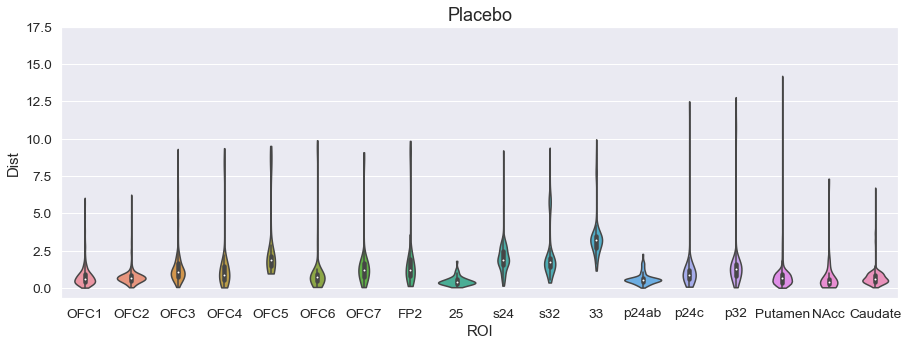

In [46]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=p_df, order= roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Placebo', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Plots/Dist_Placebo_Violinplot')

In [47]:
b_p_df = pd.DataFrame.from_dict(b_p_dist_dict,orient='index')

In [48]:
b_k_df = pd.DataFrame.from_dict(b_k_dist_dict,orient='index')

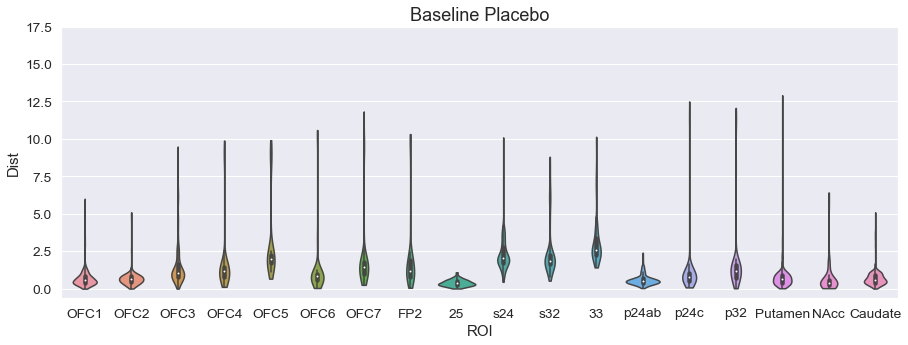

In [49]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=b_p_df, order=roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Baseline Placebo', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Plots/Dist_Placebo_Baseline_Violinplot')

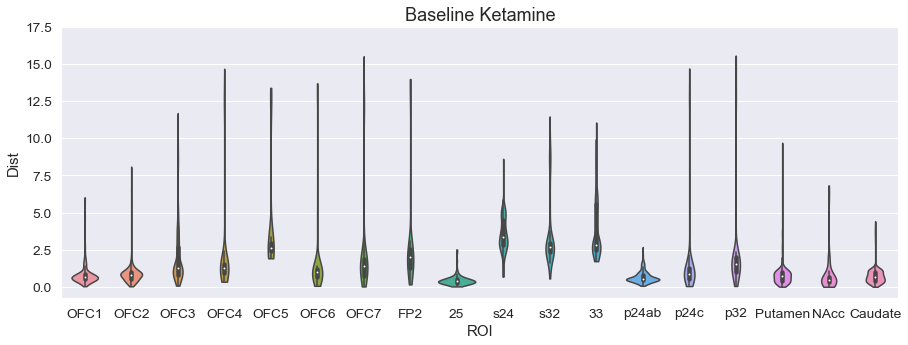

In [50]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Dist", data=b_k_df, order=roi_list_plot, split=True, cut=0)
plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Baseline Ketamine', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Plots/Dist_Ketamine_Baseline_Violinplot')

Calculate difference between placebo and its baseline

In [80]:
for entry in p_dist_dict:
    p = p_dist_dict[entry]['Dist']
    b = b_p_dist_dict[entry]['Dist']
    diff=p-b
    p_dist_dict[entry]['Diff']=copy.deepcopy(diff)

In [81]:
p_dist_dict

{0: {'x': -2.739386796951294,
  'y': -3.7363715171813965,
  'ROI': 'OFC1',
  'ID': 205889,
  'Dist': 0.08209464565631883,
  'Diff': -0.413992292334162},
 1: {'x': -2.47414231300354,
  'y': -3.2297558784484863,
  'ROI': 'OFC1',
  'ID': 205890,
  'Dist': 0.648925095850051,
  'Diff': -0.4133337508748971},
 2: {'x': -3.0095107555389404,
  'y': -3.5259978771209717,
  'ROI': 'OFC1',
  'ID': 205980,
  'Dist': 0.39189130235294745,
  'Diff': 0.21342147862466518},
 3: {'x': -3.0312700271606445,
  'y': -3.3987386226654053,
  'ROI': 'OFC1',
  'ID': 206071,
  'Dist': 0.5059062425874719,
  'Diff': 0.3046921597267705},
 4: {'x': -2.920102119445801,
  'y': -4.031643867492676,
  'ROI': 'OFC1',
  'ID': 206162,
  'Dist': 0.27425429982382826,
  'Diff': 0.08280436716065936},
 5: {'x': -2.5199127197265625,
  'y': -3.7720212936401367,
  'ROI': 'OFC2',
  'ID': 215350,
  'Dist': 0.40898290102856616,
  'Diff': 0.07729044264664703},
 6: {'x': -2.466846227645874,
  'y': -3.9160046577453613,
  'ROI': 'OFC2',
  'ID

In [82]:
_df = pd.DataFrame.from_dict(p_dist_dict,orient='index')

In [83]:
_df

,x,y,ROI,ID,Dist,Diff
0,-2.739387,-3.736372,OFC1,205889,0.082095,-0.413992
1,-2.474142,-3.229756,OFC1,205890,0.648925,-0.413334
2,-3.009511,-3.525998,OFC1,205980,0.391891,0.213421
3,-3.031270,-3.398739,OFC1,206071,0.505906,0.304692
4,-2.920102,-4.031644,OFC1,206162,0.274254,0.082804
...,...,...,...,...,...,...
11878,0.621853,2.811207,Caudate,491091,1.123040,-0.070343
11879,0.642768,2.803928,Caudate,491182,1.104175,-0.081357
11880,0.593797,2.761256,Caudate,491273,1.161738,0.015059
11881,0.626058,2.782596,Caudate,491364,1.125296,-0.021117


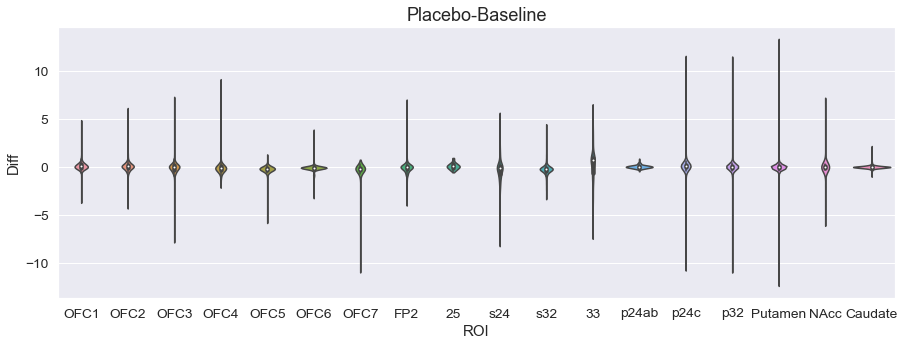

In [55]:
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Diff", data=_df, order= roi_list_plot, split=True, cut=0)
#plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Placebo-Baseline', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Plots/Subtracted_Placebo_Baseline_Violinplot')

In [74]:
kb_df

NameError: name 'kb_df' is not defined

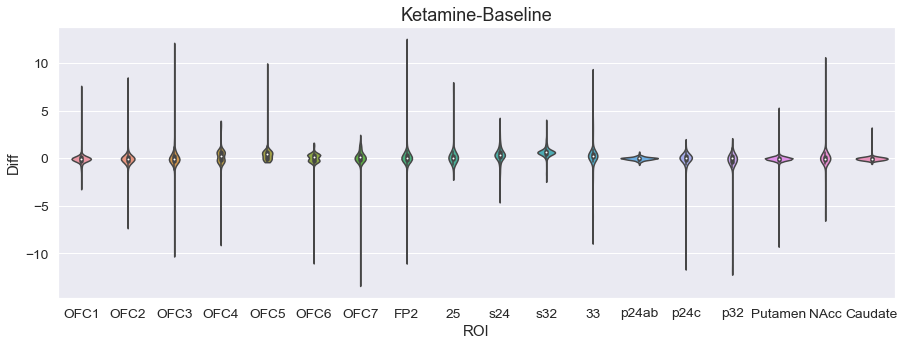

In [56]:
kb_df = pd.DataFrame.from_dict(ket_dist_dict,orient='index')
plt.figure(figsize=(15,5))
sns.set(font_scale = 1.25)
ax = sns.violinplot(x="ROI", y="Diff", order=roi_list_plot, data=kb_df, split=True, cut=0)
#plt.setp(ax,yticks=[0, 2.5, 5, 7.5, 10, 12.5, 15, 17.5])
#plt.ylim=(0, 15)
plt.title('Ketamine-Baseline', fontsize=18)
plt.savefig('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/Plots/Subtracted_Ketamine_Baseline_Violinplot')

Difference between ketamine and placebo

In [116]:
for entry in ket_dist_dict:
    k = ket_dist_dict[entry]['Diff']
    p = p_dist_dict[entry]['Diff']
    diff=k-p
    ket_dist_dict[entry]['Diff_k_p']=copy.deepcopy(diff)

In [120]:
ket_df=pd.DataFrame.from_dict(ket_dist_dict, orient='index')

In [121]:
ket_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
0,1.133926,-0.809377,OFC1,205889,0.476556,-0.320204,0.093788
1,1.134167,-0.851568,OFC1,205890,0.490172,-0.574751,-0.161418
2,1.101762,-0.911788,OFC1,205980,0.486076,-0.389410,-0.602832
3,1.149000,-0.465464,OFC1,206071,0.518099,-0.247404,-0.552096
4,1.019709,-0.775353,OFC1,206162,0.357384,-0.305098,-0.387903
...,...,...,...,...,...,...,...
11878,-2.722308,4.898921,Caudate,491091,0.974076,-0.232935,-0.162591
11879,-2.703566,4.901717,Caudate,491182,0.991907,-0.252313,-0.170956
11880,-2.700493,4.900335,Caudate,491273,0.993970,-0.272086,-0.287145
11881,-2.707304,4.912504,Caudate,491364,0.993752,-0.260076,-0.238959


In [122]:
ket_df.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/K_centroid')

In [59]:
#_dict=ket_dist_dict[]

Sort the dictionaries to get s24 and s32 and sort them according to their difference between ketamine and placebo

In [77]:
ket_dist_dict.values()

dict_values([{'x': 1.133926272392273, 'y': -0.8093768954277039, 'ROI': 'OFC1', 'ID': 205889, 'Dist': 0.4765561093270855, 'Diff': -0.32020388693128554}, {'x': 1.134166955947876, 'y': -0.8515681624412537, 'ROI': 'OFC1', 'ID': 205890, 'Dist': 0.49017162350341814, 'Diff': -0.5747514859772196}, {'x': 1.1017615795135498, 'y': -0.9117879271507263, 'ROI': 'OFC1', 'ID': 205980, 'Dist': 0.4860759595640086, 'Diff': -0.38941034583757583}, {'x': 1.148999810218811, 'y': -0.46546435356140137, 'ROI': 'OFC1', 'ID': 206071, 'Dist': 0.518099319447076, 'Diff': -0.24740366037542982}, {'x': 1.019708514213562, 'y': -0.7753534317016602, 'ROI': 'OFC1', 'ID': 206162, 'Dist': 0.35738394904559734, 'Diff': -0.30509823125966595}, {'x': 0.8803349137306213, 'y': -0.1984509825706482, 'ROI': 'OFC2', 'ID': 215350, 'Dist': 0.7804273887557499, 'Diff': -0.38981285530797305}, {'x': 0.9064167737960815, 'y': -0.19024191796779633, 'ROI': 'OFC2', 'ID': 215353, 'Dist': 0.8032009546117277, 'Diff': 0.32121949589354204}, {'x': 0.86

In [175]:
ket_dist_dict.items()

dict_items([(0, {'x': 1.3133915662765503, 'y': -0.23098969459533691, 'ROI': 'OFC1', 'ID': 205889, 'Dist': 0.4208027831085193, 'Diff': -0.8296096152336148, 'Diff_k_p': 0.8132648722314633}), (1, {'x': 1.4064911603927612, 'y': -0.34745585918426514, 'ROI': 'OFC1', 'ID': 205890, 'Dist': 0.5377301276261912, 'Diff': -0.5453643144216374, 'Diff_k_p': 1.8999400441373995}), (2, {'x': 1.3203647136688232, 'y': -0.32149776816368103, 'ROI': 'OFC1', 'ID': 205980, 'Dist': 0.44781268688947384, 'Diff': -0.6477967145524965, 'Diff_k_p': -0.31208802596730356}), (3, {'x': 1.3174872398376465, 'y': -0.2732459306716919, 'ROI': 'OFC1', 'ID': 206071, 'Dist': 0.4320708799393741, 'Diff': -0.44594164761715094, 'Diff_k_p': -0.5884169230158072}), (4, {'x': 1.2966349124908447, 'y': -0.3141494691371918, 'ROI': 'OFC1', 'ID': 206162, 'Dist': 0.42297834418737706, 'Diff': -0.3918281267352391, 'Diff_k_p': -0.5151530556089163}), (5, {'x': 1.2379392385482788, 'y': 0.2534130811691284, 'ROI': 'OFC2', 'ID': 215350, 'Dist': 0.9810

In [53]:
_k_df = pd.DataFrame.from_dict(ket_dist_dict,orient='index')

In [54]:
_k_df

,x,y,ROI,ID,Dist,Diff
0,1.133926,-0.809377,OFC1,205889,0.476556,-0.320204
1,1.134167,-0.851568,OFC1,205890,0.490172,-0.574751
2,1.101762,-0.911788,OFC1,205980,0.486076,-0.389410
3,1.149000,-0.465464,OFC1,206071,0.518099,-0.247404
4,1.019709,-0.775353,OFC1,206162,0.357384,-0.305098
...,...,...,...,...,...,...
11878,-2.722308,4.898921,Caudate,491091,0.974076,-0.232935
11879,-2.703566,4.901717,Caudate,491182,0.991907,-0.252313
11880,-2.700493,4.900335,Caudate,491273,0.993970,-0.272086
11881,-2.707304,4.912504,Caudate,491364,0.993752,-0.260076


In [78]:
_k_df

,x,y,ROI,ID,Dist,Diff
0,1.133926,-0.809377,OFC1,205889,0.476556,-0.320204
1,1.134167,-0.851568,OFC1,205890,0.490172,-0.574751
2,1.101762,-0.911788,OFC1,205980,0.486076,-0.389410
3,1.149000,-0.465464,OFC1,206071,0.518099,-0.247404
4,1.019709,-0.775353,OFC1,206162,0.357384,-0.305098
...,...,...,...,...,...,...
11878,-2.722308,4.898921,Caudate,491091,0.974076,-0.232935
11879,-2.703566,4.901717,Caudate,491182,0.991907,-0.252313
11880,-2.700493,4.900335,Caudate,491273,0.993970,-0.272086
11881,-2.707304,4.912504,Caudate,491364,0.993752,-0.260076


## Find 3 voxels showing largest changes ketamine vs placebo 

In [124]:
split_df=ket_df.groupby('ROI')
#split_df.appy() s

In [125]:
s24=list(split_df)[16]

In [126]:
s24

('s24',              x         y  ROI      ID      Dist      Diff  Diff_k_p
 1705  0.026158 -0.597925  s24  264582  4.283280  0.468984  1.842748
 1732 -0.073165 -0.730372  s24  264673  4.122033  0.718357  1.477501
 2214 -0.029817 -0.087669  s24  274318  4.733627 -0.190585  1.154483
 2232 -0.082367 -0.240767  s24  274409  4.571858 -0.341071  0.622396
 2233 -0.105545 -0.702335  s24  274410  4.135026 -0.092347  1.145245
 ...        ...       ...  ...     ...       ...       ...       ...
 5768 -2.901754 -7.694065  s24  334564  3.396961  0.149700  0.188487
 6015 -0.100721  0.818490  s24  343932  5.568568  0.386633 -4.785247
 6016 -0.060779  1.047243  s24  343933  5.799132  0.939461 -4.705742
 6021  0.013893  0.201673  s24  344023  5.019922 -0.847448 -0.248293
 6027 -3.317720 -8.318007  s24  344114  4.130362  0.177558  0.303729
 
 [307 rows x 7 columns])

In [127]:
s24_df=pd.DataFrame(s24[1])
s24_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
1705,0.026158,-0.597925,s24,264582,4.283280,0.468984,1.842748
1732,-0.073165,-0.730372,s24,264673,4.122033,0.718357,1.477501
2214,-0.029817,-0.087669,s24,274318,4.733627,-0.190585,1.154483
2232,-0.082367,-0.240767,s24,274409,4.571858,-0.341071,0.622396
2233,-0.105545,-0.702335,s24,274410,4.135026,-0.092347,1.145245
...,...,...,...,...,...,...,...
5768,-2.901754,-7.694065,s24,334564,3.396961,0.149700,0.188487
6015,-0.100721,0.818490,s24,343932,5.568568,0.386633,-4.785247
6016,-0.060779,1.047243,s24,343933,5.799132,0.939461,-4.705742
6021,0.013893,0.201673,s24,344023,5.019922,-0.847448,-0.248293


In [128]:
s32=list(split_df)[17]

In [129]:
s32_df=pd.DataFrame(s32[1])
s32_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
1311,0.105311,-0.906633,s32,254938,3.803771,0.274113,1.116021
1391,0.434112,-1.132829,s32,255207,3.755279,0.649335,1.340664
1760,-0.167581,-0.999687,s32,264766,3.611823,0.646623,1.258869
1761,0.017384,-0.735205,s32,264767,3.926076,-0.538201,-0.110508
1785,0.065431,-1.135239,s32,264853,3.579745,0.655093,1.102806
...,...,...,...,...,...,...,...
5448,-2.501512,-7.618301,s32,325003,3.409925,0.610919,1.168156
5452,-3.049851,-8.020727,s32,325008,3.979061,0.763543,0.907437
5453,-3.149412,-7.839010,s32,325009,3.855039,0.801175,0.879342
5474,-2.532861,-7.755686,s32,325099,3.550393,0.780422,0.988273


In [130]:
p32=list(split_df)[15]
p32

('p32',              x          y  ROI      ID      Dist      Diff  Diff_k_p
 3946 -2.161824  -7.577792  p32  295519  2.100066  0.503375  0.427631
 3947 -2.315058  -7.533535  p32  295520  2.021848  0.560959  0.258223
 3948 -2.355694  -7.600945  p32  295521  1.945061  0.410524  0.080052
 3949 -2.508229  -7.963042  p32  295524  1.585064 -0.043289 -0.179464
 3950 -2.377975  -7.780121  p32  295525  1.804008  0.180682 -0.034310
 ...        ...        ...  ...     ...       ...       ...       ...
 8947 -5.096673 -10.089321  p32  523482  1.765672 -0.449765 -0.468303
 8948 -5.118205 -10.096391  p32  523572  1.786993 -0.460616 -0.481794
 8949 -5.107682 -10.097229  p32  523573  1.779214 -0.455142 -0.501967
 8950 -5.032690 -10.168830  p32  523753  1.767353 -0.464435 -0.534461
 8951 -5.022842 -10.161909  p32  523754  1.755391 -0.404407 -0.481328
 
 [1442 rows x 7 columns])

In [131]:
p32_df=pd.DataFrame(p32[1])
p32_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
3946,-2.161824,-7.577792,p32,295519,2.100066,0.503375,0.427631
3947,-2.315058,-7.533535,p32,295520,2.021848,0.560959,0.258223
3948,-2.355694,-7.600945,p32,295521,1.945061,0.410524,0.080052
3949,-2.508229,-7.963042,p32,295524,1.585064,-0.043289,-0.179464
3950,-2.377975,-7.780121,p32,295525,1.804008,0.180682,-0.034310
...,...,...,...,...,...,...,...
8947,-5.096673,-10.089321,p32,523482,1.765672,-0.449765,-0.468303
8948,-5.118205,-10.096391,p32,523572,1.786993,-0.460616,-0.481794
8949,-5.107682,-10.097229,p32,523573,1.779214,-0.455142,-0.501967
8950,-5.032690,-10.168830,p32,523753,1.767353,-0.464435,-0.534461


In [132]:
ofc5=list(split_df)[9]
ofc5

('OFC5',              x          y   ROI      ID       Dist      Diff  Diff_k_p
 3415  2.080376   5.791210  OFC5  285950   2.569164 -0.091927  0.090109
 3441  2.063715   5.870281  OFC5  286040   2.633018 -0.046281  0.170168
 3442  1.906288   5.795729  OFC5  286041   2.500670 -0.130195  0.218115
 3443  1.935435   5.546901  OFC5  286042   2.285966 -0.374015 -0.373214
 3464  1.202484   6.224658  OFC5  286079   2.746714  0.664353  0.850726
 ...        ...        ...   ...     ...        ...       ...       ...
 7019 -3.281188  -9.877083  OFC5  385448  14.017453  0.826703  1.238302
 7020 -3.215070  -9.800953  OFC5  385449  13.925016  0.682313  0.874962
 7031 -3.556847 -10.250930  OFC5  385538  14.457698  1.261860  1.763597
 7032 -3.331764 -10.126056  OFC5  385539  14.270132  0.892738  1.354347
 7044 -3.339012  -9.756602  OFC5  385629  13.920253  1.264666  2.125818
 
 [341 rows x 7 columns])

In [133]:
ofc5_df=pd.DataFrame(ofc5[1])
ofc5_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
3415,2.080376,5.791210,OFC5,285950,2.569164,-0.091927,0.090109
3441,2.063715,5.870281,OFC5,286040,2.633018,-0.046281,0.170168
3442,1.906288,5.795729,OFC5,286041,2.500670,-0.130195,0.218115
3443,1.935435,5.546901,OFC5,286042,2.285966,-0.374015,-0.373214
3464,1.202484,6.224658,OFC5,286079,2.746714,0.664353,0.850726
...,...,...,...,...,...,...,...
7019,-3.281188,-9.877083,OFC5,385448,14.017453,0.826703,1.238302
7020,-3.215070,-9.800953,OFC5,385449,13.925016,0.682313,0.874962
7031,-3.556847,-10.250930,OFC5,385538,14.457698,1.261860,1.763597
7032,-3.331764,-10.126056,OFC5,385539,14.270132,0.892738,1.354347


#### Sorting the dictionaries to find voxels with largest change

In [134]:
sorted_s24_df=s24_df.sort_values(by=['Diff_k_p'],ascending=False)

In [135]:
sorted_s24_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
5746,-0.443762,0.365012,s24,334196,5.038855,2.426799,6.840948
5744,-2.618876,4.985831,s24,334109,9.538644,4.245740,6.128089
5373,-3.003107,-8.374632,s24,324372,4.072658,0.533308,5.808671
5379,-2.882548,-7.995244,s24,324463,3.674616,0.097216,5.649916
4257,-0.474426,0.334088,s24,304349,5.001231,2.745575,4.606714
...,...,...,...,...,...,...,...
5748,-2.948683,-8.267272,s24,334200,3.953648,-4.639725,-3.609447
4250,-2.586455,-7.243221,s24,304263,2.867830,-1.906499,-3.643023
4240,-2.840901,-7.259656,s24,304171,2.970086,-2.331206,-4.399261
6016,-0.060779,1.047243,s24,343933,5.799132,0.939461,-4.705742


In [137]:
largest_s24=sorted_s24_df[0:3][:]
largest_s24.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_3_voxels_s24')
largest_s24

,x,y,ROI,ID,Dist,Diff,Diff_k_p
5746,-0.443762,0.365012,s24,334196,5.038855,2.426799,6.840948
5744,-2.618876,4.985831,s24,334109,9.538644,4.245740,6.128089
5373,-3.003107,-8.374632,s24,324372,4.072658,0.533308,5.808671


In [138]:
sorted_s32_df=s32_df.sort_values(by=['Diff_k_p'],ascending=False)
sorted_s32_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
3657,-2.563175,4.861537,s32,294790,9.291923,4.048604,3.876187
3711,-2.400274,4.990358,s32,294978,9.402448,1.367356,3.701948
3746,-2.455989,5.003104,s32,295071,9.420770,1.252994,3.606458
3043,0.413888,3.193655,s32,284967,7.792587,-0.118932,3.252227
3070,0.357074,3.209906,s32,285057,7.794804,-0.120603,3.138613
...,...,...,...,...,...,...,...
3183,1.048173,4.435603,s32,285326,9.156651,0.089651,-1.212535
2943,-0.384262,-1.375277,s32,284599,3.183947,-2.477588,-1.331660
2447,0.487368,1.958297,s32,275134,6.622281,-2.365840,-1.627880
3021,-0.227846,-1.286808,s32,284879,3.322705,-1.462433,-2.041288


In [139]:
largest_s32=sorted_s32_df[0:3][:]
largest_s32.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_3_voxels_s32')
largest_s32

,x,y,ROI,ID,Dist,Diff,Diff_k_p
3657,-2.563175,4.861537,s32,294790,9.291923,4.048604,3.876187
3711,-2.400274,4.990358,s32,294978,9.402448,1.367356,3.701948
3746,-2.455989,5.003104,s32,295071,9.420770,1.252994,3.606458


In [148]:
largest_5_s32=sorted_s32_df[0:5][:]
largest_5_s32.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_5_voxels_s32')
largest_5_s32

,x,y,ROI,ID,Dist,Diff,Diff_k_p
3657,-2.563175,4.861537,s32,294790,9.291923,4.048604,3.876187
3711,-2.400274,4.990358,s32,294978,9.402448,1.367356,3.701948
3746,-2.455989,5.003104,s32,295071,9.420770,1.252994,3.606458
3043,0.413888,3.193655,s32,284967,7.792587,-0.118932,3.252227
3070,0.357074,3.209906,s32,285057,7.794804,-0.120603,3.138613


In [149]:
largest_10_s32=sorted_s32_df[0:10][:]
largest_10_s32.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_10_voxels_s32')
largest_10_s32

,x,y,ROI,ID,Dist,Diff,Diff_k_p
3657,-2.563175,4.861537,s32,294790,9.291923,4.048604,3.876187
3711,-2.400274,4.990358,s32,294978,9.402448,1.367356,3.701948
3746,-2.455989,5.003104,s32,295071,9.420770,1.252994,3.606458
3043,0.413888,3.193655,s32,284967,7.792587,-0.118932,3.252227
3070,0.357074,3.209906,s32,285057,7.794804,-0.120603,3.138613
4933,0.090174,5.015749,s32,314910,9.511924,0.732570,2.902082
2333,-0.417073,-1.538335,s32,274773,3.019621,2.455695,2.766784
4397,0.102310,4.838538,s32,305081,9.339217,0.559089,2.766067
2335,-0.318590,-1.136848,s32,274776,3.430503,1.065562,2.761532
4961,0.231118,5.112484,s32,315000,9.631322,0.698112,2.656181


In [146]:
sorted_p32_df=p32_df.sort_values(by=['Diff_k_p'],ascending=True)
sorted_p32_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
8215,-4.491000,-10.071767,p32,454311,1.328032,-11.316780,-16.558626
7324,-4.031125,-9.642213,p32,404715,0.719601,-12.053444,-16.298335
7336,-4.072979,-9.752576,p32,404806,0.837086,-11.982416,-16.232844
7494,-4.255521,-9.795414,p32,414543,0.966350,-11.880815,-16.209611
7144,-4.116112,-9.668296,p32,394887,0.783754,-12.002447,-16.135013
...,...,...,...,...,...,...,...
7529,-4.022123,-9.672978,p32,414740,0.743352,-0.404947,10.121864
6788,-3.224916,-8.932505,p32,375245,0.487177,-0.053654,10.378723
7542,-4.041685,-9.799593,p32,414831,0.867086,-0.138185,10.679377
7159,-2.817046,4.455366,p32,394903,13.484306,0.717583,11.484944


In [151]:
largest_5_p32=sorted_p32_df[0:10][:]
largest_5_p32.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_10_voxels_p32')
largest_5_p32

,x,y,ROI,ID,Dist,Diff,Diff_k_p
8215,-4.491000,-10.071767,p32,454311,1.328032,-11.316780,-16.558626
7324,-4.031125,-9.642213,p32,404715,0.719601,-12.053444,-16.298335
7336,-4.072979,-9.752576,p32,404806,0.837086,-11.982416,-16.232844
7494,-4.255521,-9.795414,p32,414543,0.966350,-11.880815,-16.209611
7144,-4.116112,-9.668296,p32,394887,0.783754,-12.002447,-16.135013
7131,-4.050741,-9.656197,p32,394796,0.740999,-12.039640,-16.001555
6934,-4.186914,-9.920426,p32,384877,1.038250,-11.670323,-15.620683
7680,-4.420867,-9.824062,p32,424463,1.090337,-11.744713,-13.214506
7691,-4.344812,-9.818165,p32,424554,1.037503,-11.808765,-13.132693
7507,-4.323717,-9.846621,p32,414634,1.047553,-11.771407,-13.068468


In [147]:
largest_p32=sorted_p32_df[0:3][:]
largest_p32.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_3_voxels_p32')
largest_p32

,x,y,ROI,ID,Dist,Diff,Diff_k_p
8215,-4.491000,-10.071767,p32,454311,1.328032,-11.316780,-16.558626
7324,-4.031125,-9.642213,p32,404715,0.719601,-12.053444,-16.298335
7336,-4.072979,-9.752576,p32,404806,0.837086,-11.982416,-16.232844


In [144]:
sorted_ofc5_df=ofc5_df.sort_values(by=['Diff_k_p'],ascending=False)
sorted_ofc5_df

,x,y,ROI,ID,Dist,Diff,Diff_k_p
5629,-2.482593,-9.114744,OFC5,325750,13.061013,9.972349,15.309971
5925,-2.526051,-8.744320,OFC5,335671,12.715639,7.803372,13.210946
6413,-2.960276,-9.154511,OFC5,355604,13.232106,9.859441,10.328194
5964,-2.635837,-8.998531,OFC5,335908,12.990189,0.073208,5.931742
5655,-2.579562,-9.179735,OFC5,325842,13.149344,0.583605,5.277920
...,...,...,...,...,...,...,...
5297,2.125208,5.667779,OFC5,316072,2.480438,-0.142205,-0.079859
5590,2.089597,5.974737,OFC5,325621,2.738579,-0.322444,-0.080064
4789,2.156733,5.472104,OFC5,306154,2.326991,-0.198893,-0.140724
3443,1.935435,5.546901,OFC5,286042,2.285966,-0.374015,-0.373214


In [145]:
largest_ofc5=sorted_ofc5_df[0:3][:]
largest_ofc5.to_pickle('C:/Users/canlab/Desktop/Masterthesis_python/ReDoneAnalysis20200420/largest_3_voxels_ofc5')
largest_ofc5

,x,y,ROI,ID,Dist,Diff,Diff_k_p
5629,-2.482593,-9.114744,OFC5,325750,13.061013,9.972349,15.309971
5925,-2.526051,-8.744320,OFC5,335671,12.715639,7.803372,13.210946
6413,-2.960276,-9.154511,OFC5,355604,13.232106,9.859441,10.328194
